<a href="https://colab.research.google.com/github/yasirufernando101/robomassign/blob/master/Copy_of_TEMG4940C_ML_Assignment_Instruction20726363.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### **TEMG 4940C - Machine Learning Assignment Guideline**

---



This document provides a guideline for completing a machine learning assignment. The assignment consists of 6 part, each corresponding to each steps with reference to Tutorial’s PPT:

*Remarks: There are no restrictions in terms of what specific libraries or programming language to use, so feel free to be creative or search online for inspirations.*


---




#### **Submission Criteria**
Your submission should include the following:
1. A public git repository with your machine learning code and a brief README file describing how to run it.
   
   a. README file should include the version of python & common libraries used during the development
   
   b. You are **STRONGLY RECOMMENDED** to comment your code, both for readability & to develop good collaboration habits in dev
   
   
2. A link to your deployed dashboard (if hosted)

---



**Name**: Lindamulage Yasiru Hansaja Fernando

**Student ID**: 20726363

#### **Dataset Introduction**
Customer personality analysis is a thorough examination of a company's ideal clients. It makes it simpler for businesses to adapt products in response to the unique wants, habits, and concerns of various consumer types.

Consumer personality analysis aids a corporation in tailoring its offering to its target market from various consumer categories. For instance, a firm can assess which customer segment is most likely to purchase the product and then promote the product exclusively to that specific segment rather than investing money to market a new product to every consumer in the database of the company.


---

**Attributes:**

*Part 1. People*
- ID: Customer's unique identifier
- Year_Birth: Customer's birth year
- Education: Customer's education level
- Marital_Status: Customer's marital status
- Income: Customer's yearly household income
- Kidhome: Number of children in customer's household
- Teenhome: Number of teenagers in customer's household
- Dt_Customer: Date of customer's enrollment with the company
- Recency: Number of days since customer's last purchase
- Complain: 1 if the customer complained in the last 2 years, 0 otherwise


*Part 2. Products*
- MntWines: Amount spent on wine in last 2 years
- MntFruits: Amount spent on fruits in last 2 years
- MntMeatProducts: Amount spent on meat in last 2 years
- MntFishProducts: Amount spent on fish in last 2 years
- MntSweetProducts: Amount spent on sweets in last 2 years
- MntGoldProds: Amount spent on gold in last 2 years


*Part 3.Promotion*
- NumDealsPurchases: Number of purchases made with a discount
- AcceptedCmp1: 1 if customer accepted the offer in the 1st campaign, 0 otherwise
- AcceptedCmp2: 1 if customer accepted the offer in the 2nd campaign, 0 otherwise
- AcceptedCmp3: 1 if customer accepted the offer in the 3rd campaign, 0 otherwise
- AcceptedCmp4: 1 if customer accepted the offer in the 4th campaign, 0 otherwise
- AcceptedCmp5: 1 if customer accepted the offer in the 5th campaign, 0 otherwise
- Response: 1 if customer accepted the offer in the last campaign, 0 otherwise


*Part 4. Place*
- NumWebPurchases: Number of purchases made through the company’s website
- NumCatalogPurchases: Number of purchases made using a catalogue
- NumStorePurchases: Number of purchases made directly in stores
- NumWebVisitsMonth: Number of visits to company’s website in the last month

-------
**Ultimate Goal:**

With the Datasets aforementioned, evaluated the likelihood that customer would accepted offers in Marketing Campaign

**[Prediction Value]: Y =AcceptedCmp1 + cceptedCmp2 + AcceptedCmp3 + AcceptedCmp4 + AcceptedCmp5 + Response**

#### **Step 0. Loading the Data from File Path**
- Download the dataset from Canvas
- Undergo Preliminary Analysis



In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Most library imports are run in individual cells for the ease of understanding the code and to improve runtime

In [ ]:
#Importing Relevant Libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno

In [ ]:
#Loading the Dataset
filename = '/content/drive/MyDrive/TEMG/ML practice/TEMG4940C - Assignment Dataset.csv'
data = pd.read_csv(filename, index_col=0, sep="\t")
print("Number of datapoints:", len(data)) # Show number of Data Rows in Dataset
data.head(10) # Print Top 10 Rows of the dataset for preview

Number of datapoints: 2240


,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
ID,,,,,,,,,,,,,,,,,,,,,
5524,1957,Graduation,Single,58138.0,0,0,04-09-2012,58,635,88,...,7,0,0,0,0,0,0,3,11,1
2174,1954,Graduation,Single,46344.0,1,1,08-03-2014,38,11,1,...,5,0,0,0,0,0,0,3,11,0
4141,1965,Graduation,Together,71613.0,0,0,21-08-2013,26,426,49,...,4,0,0,0,0,0,0,3,11,0
6182,1984,Graduation,Together,26646.0,1,0,10-02-2014,26,11,4,...,6,0,0,0,0,0,0,3,11,0
5324,1981,PhD,Married,58293.0,1,0,19-01-2014,94,173,43,...,5,0,0,0,0,0,0,3,11,0
7446,1967,Master,Together,62513.0,0,1,09-09-2013,16,520,42,...,6,0,0,0,0,0,0,3,11,0
965,1971,Graduation,Divorced,55635.0,0,1,13-11-2012,34,235,65,...,6,0,0,0,0,0,0,3,11,0
6177,1985,PhD,Married,33454.0,1,0,08-05-2013,32,76,10,...,8,0,0,0,0,0,0,3,11,0
4855,1974,PhD,Together,30351.0,1,0,06-06-2013,19,14,0,...,9,0,0,0,0,0,0,3,11,1


In [ ]:
#Information on features
data.info()
data.describe()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2240 entries, 5524 to 9405
Data columns (total 28 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Year_Birth           2240 non-null   int64  
 1   Education            2240 non-null   object 
 2   Marital_Status       2240 non-null   object 
 3   Income               2216 non-null   float64
 4   Kidhome              2240 non-null   int64  
 5   Teenhome             2240 non-null   int64  
 6   Dt_Customer          2240 non-null   object 
 7   Recency              2240 non-null   int64  
 8   MntWines             2240 non-null   int64  
 9   MntFruits            2240 non-null   int64  
 10  MntMeatProducts      2240 non-null   int64  
 11  MntFishProducts      2240 non-null   int64  
 12  MntSweetProducts     2240 non-null   int64  
 13  MntGoldProds         2240 non-null   int64  
 14  NumDealsPurchases    2240 non-null   int64  
 15  NumWebPurchases      2240 non-null 

,Year_Birth,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
count,2240.000000,2216.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,...,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.0,2240.0,2240.000000
mean,1968.805804,52247.251354,0.444196,0.506250,49.109375,303.935714,26.302232,166.950000,37.525446,27.062946,...,5.316518,0.072768,0.074554,0.072768,0.064286,0.013393,0.009375,3.0,11.0,0.149107
std,11.984069,25173.076661,0.538398,0.544538,28.962453,336.597393,39.773434,225.715373,54.628979,41.280498,...,2.426645,0.259813,0.262728,0.259813,0.245316,0.114976,0.096391,0.0,0.0,0.356274
min,1893.000000,1730.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
25%,1959.000000,35303.000000,0.000000,0.000000,24.000000,23.750000,1.000000,16.000000,3.000000,1.000000,...,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
50%,1970.000000,51381.500000,0.000000,0.000000,49.000000,173.500000,8.000000,67.000000,12.000000,8.000000,...,6.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
75%,1977.000000,68522.000000,1.000000,1.000000,74.000000,504.250000,33.000000,232.000000,50.000000,33.000000,...,7.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
max,1996.000000,666666.000000,2.000000,2.000000,99.000000,1493.000000,199.000000,1725.000000,259.000000,263.000000,...,20.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,3.0,11.0,1.000000




---



> Q0. Generate Y - Predictor Value

In [ ]:
#@title Q0. Generate Y - Predictor Value
## Before Proceeding, You may want to evaluate the Y -Predictor Value first
## By combining Y = AcceptedCmp1 + AcceptedCmp2 + AcceptedCmp3 + AcceptedCmp4 + AcceptedCmp5 + Response



This was done at a latter stage

#### **Step 1. Exploratory Data Analysis**
In this step, you shall explore the data set and perform some descriptive statistics and visualizations to understand the data better. You shall also identify any potential problems or issues with the data, such as missing values, outliers, or imbalances.




> Q1a. In whichever preferred means (tables, graphs etcs), showcase the existence of missing value, outliers & imbalances in the dataset.

## finding the missing data points

<Axes: >

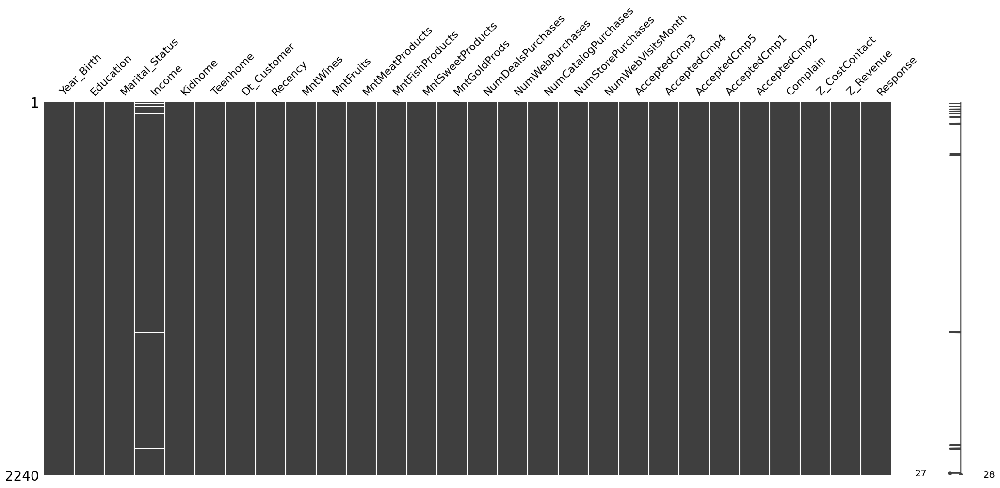

In [ ]:
msno.matrix(data)


##  Boxplots

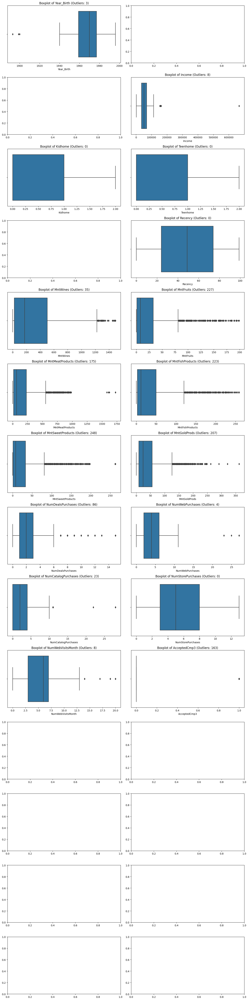

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

fig, axs = plt.subplots(len(data.columns)//2 + len(data.columns)%2, 2, figsize=(14, len(data.columns)*2))

# Adjust the space between plots
plt.subplots_adjust(hspace = 0.5)

# Iterate over each column
for i, column in enumerate(data.columns):
    # Check if column data type is numeric
    if data[column].dtype in ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']:
        # Calculate the IQR of the column
        Q1 = data[column].quantile(0.25)
        Q3 = data[column].quantile(0.75)
        IQR = Q3 - Q1

        # Define the range of outliers
        outlier_range = ((data[column] < (Q1 - 1.5 * IQR)) | (data[column] > (Q3 + 1.5 * IQR)))

        # Count the number of outliers in the column
        outlier_count = outlier_range.sum()

        # Create a boxplot of the column
        sns.boxplot(x=data[column], ax=axs[i//2, i%2])
        axs[i//2, i%2].set_title(f'Boxplot of {column} (Outliers: {outlier_count})')

    # Stop the loop if the column is 'AcceptedCmp3'
    if column == 'AcceptedCmp3':
        break

# Delete empty subplots
if len(data.columns) % 2 != 0:
    fig.delaxes(axs[i//2, i%2 + 1])

plt.tight_layout()
plt.show()

#this code will represent outliers (defined as following outside a 1.5* +/- quartile fence) alongside the number of outliers however some columsn have binary values, these are not to be classified as containing outliers.

The axes for the graph below are not completely accurate. The important visual  is the number of yellow dashes

## Outlier Matrix

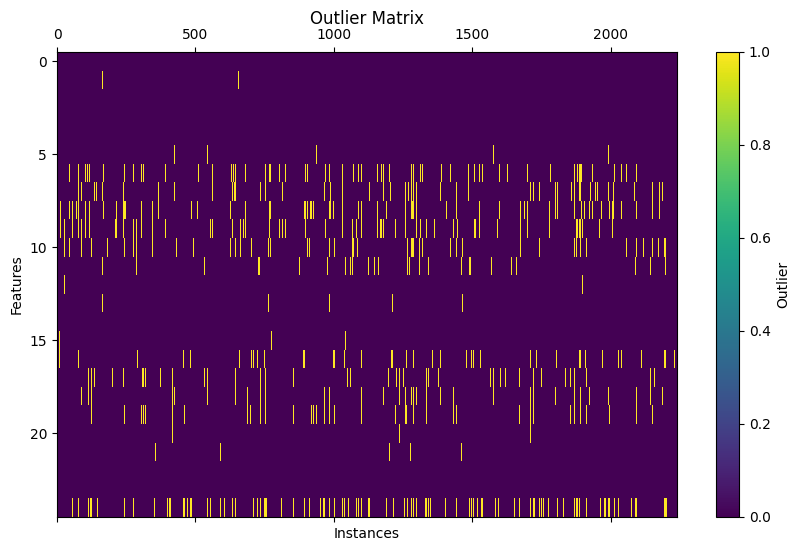

Total outliers:  2269


In [ ]:

# Create a new DataFrame to store outlier information
outlier_df = pd.DataFrame(index=data.index)

# Iterate over each column
for column in data.columns:
  #if column == 'AcceptedCmp3':
    #break
    # Check if column data type is numeric
    if data[column].dtype in ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']:
        # Calculate the IQR of the column
        Q1 = data[column].quantile(0.25)
        Q3 = data[column].quantile(0.75)
        IQR = Q3 - Q1

        # Define the range of outliers
        outlier_range = ((data[column] < (Q1 - 1.5 * IQR)) | (data[column] > (Q3 + 1.5 * IQR)))

        # Assign 1 to the outliers and 0 to others
        outlier_df[column] = np.where(outlier_range, 1, 0)

# Plotting the matrix
plt.figure(figsize=(10,6))
plt.matshow(outlier_df.T, fignum=1, aspect='auto')
plt.colorbar(label='Outlier')
plt.title('Outlier Matrix', pad=20)
plt.xlabel('Instances')
plt.ylabel('Features')
plt.show()

# Print the total number of outliers
print("Total outliers: ", outlier_df.sum().sum())

#only the first 19 features matter

>  Q1b. Handle the missing values and outliers, and explain why was that particular methodology chosen.

In [ ]:
#@title Q1b. Handle the missing values and outliers, and explain why was that particular methodology chosen.
# Q1b. Codes to handle (i) Missing Values, (ii) Outliers
# Tips: You may refer to Slide 19 in Tutorial PPT


In [ ]:

# Calculate the mean of the 'Income' column
mean_income = data['Income'].mean()

# Fill in missing values in the 'Income' column with the mean
data['Income'] = data['Income'].fillna(mean_income)


In [ ]:
data.shape

(2240, 28)

In [ ]:
# Define the columns to check for outliers
cols_to_check = ['Year_Birth', 'Education', 'Marital_Status', 'Income', 'Kidhome', 'Teenhome',
                 'Dt_Customer', 'Recency', 'MntWines', 'MntFruits', 'MntMeatProducts',
                 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds', 'NumDealsPurchases',
                 'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth']

# Iterate over the columns
for col in cols_to_check:
    if data[col].dtype in ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']:
        # Calculate the IQR of the column
        Q1 = data[col].quantile(0.25)
        Q3 = data[col].quantile(0.75)
        IQR = Q3 - Q1

        # Define the upper and lower bounds for outliers
        lower_fence = Q1 - 1.5 * IQR
        upper_fence = Q3 + 1.5 * IQR

        # Replace outliers with the respective fence values
        data.loc[data[col] < lower_fence, col] = lower_fence
        data.loc[data[col] > upper_fence, col] = upper_fence #972

> Q1c. Explain why the above methodology to handle the missing values and outliers is chosen

**Answer:**

| | Methodology Used | Underlying Rationale |
|--|--|--|
|Handling Outliers | (Fill the missing values with the mean) | (A very low amount of the data is missing, removing this would have been fine too. However, at this stage we are not sure fi the data is missing due to some underlying bias in the data. By filling with data we can explore later. For instance the number of customers appealed to by certain runs are also low. This may be related to people not willing to disclose their income or other reasons. Filling with the mean will not skew our data much as it is only a few observations) |
|Handling Missing Values| (Fill the missing values with either the upper fence or lower fence) | (There are a significant number of outliers in the data. However removing them will result in an over 50% loss in our data points. Hence, we need to consider the feature clipping methodology. This might affect the skewness of our data. However as observed in the box and whisker plots in the rows with outliers it may be limited to simply one cell. Removing the entire row is throwing away other useful data.) |


\>  Q1d. Plot 3 or more types of charts over all columns of data

In [ ]:
#@title Q1d. Plot 3 or more types of charts over all columns of data
# Q1d. Exploratory Data Analysis Graph Plotting

# import xxx as xxx (Import Graphing Libraries)
# ....
# plt.show()

## Histograms and box plots

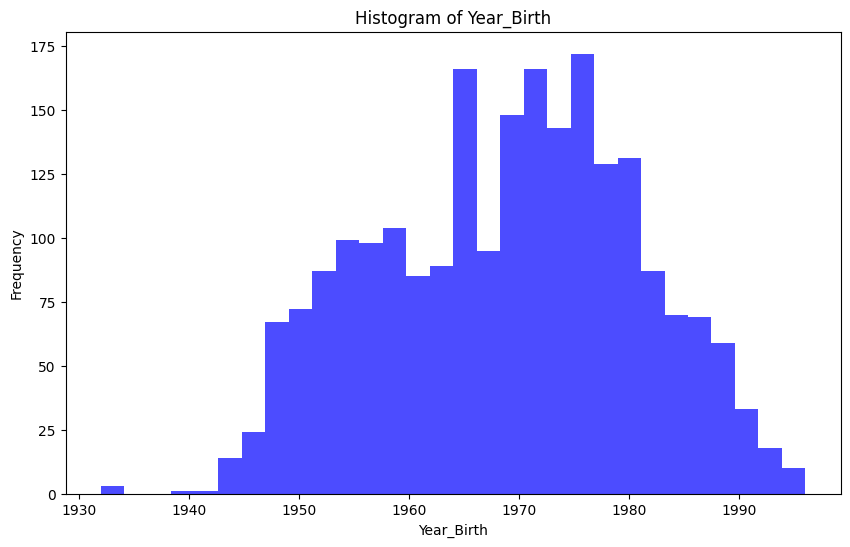

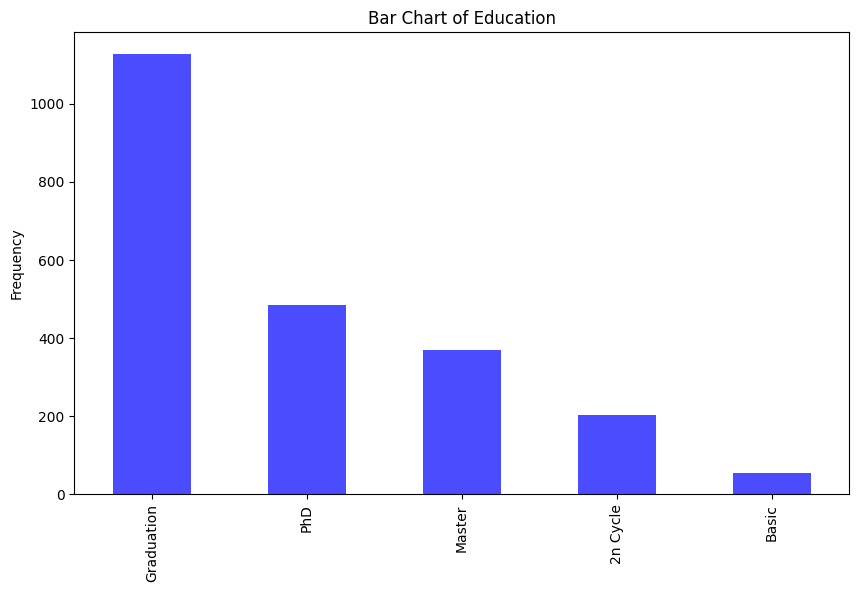

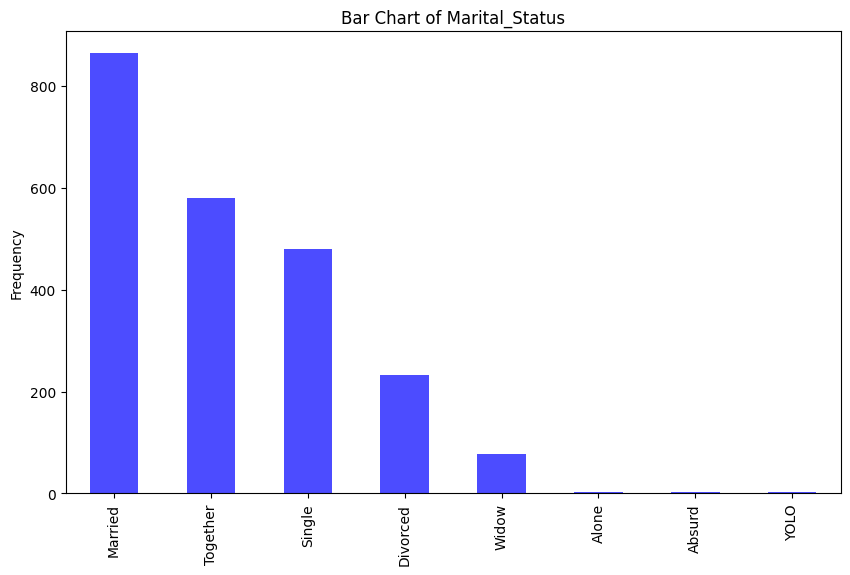

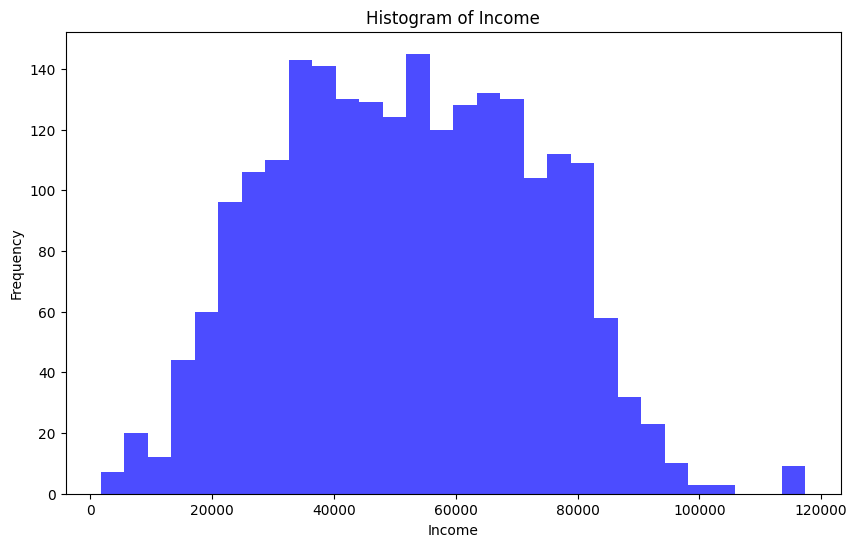

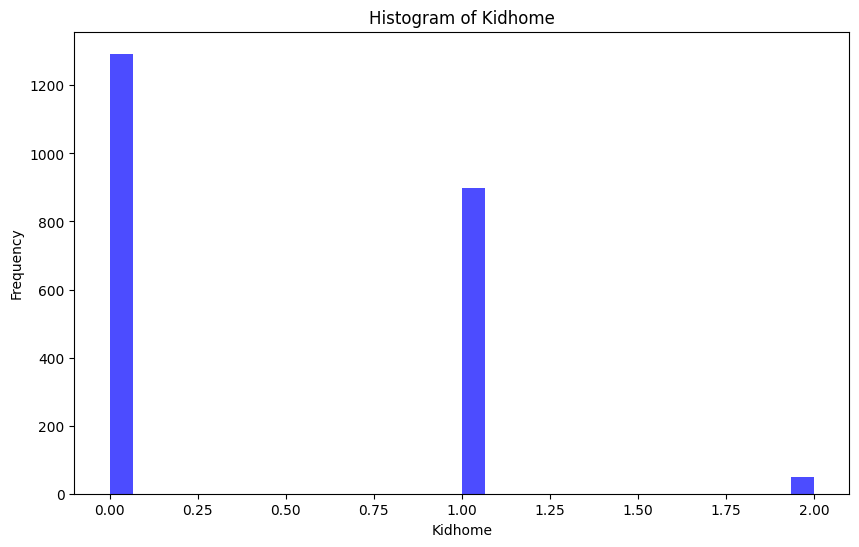

...

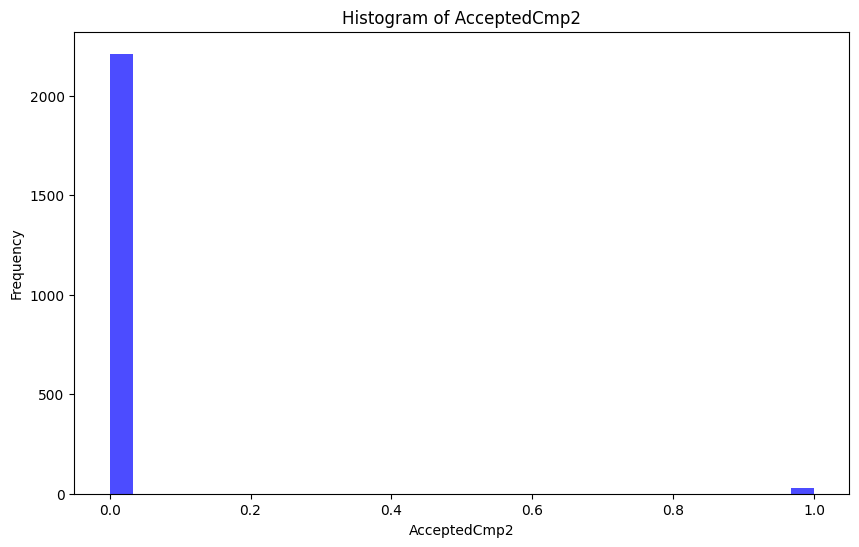

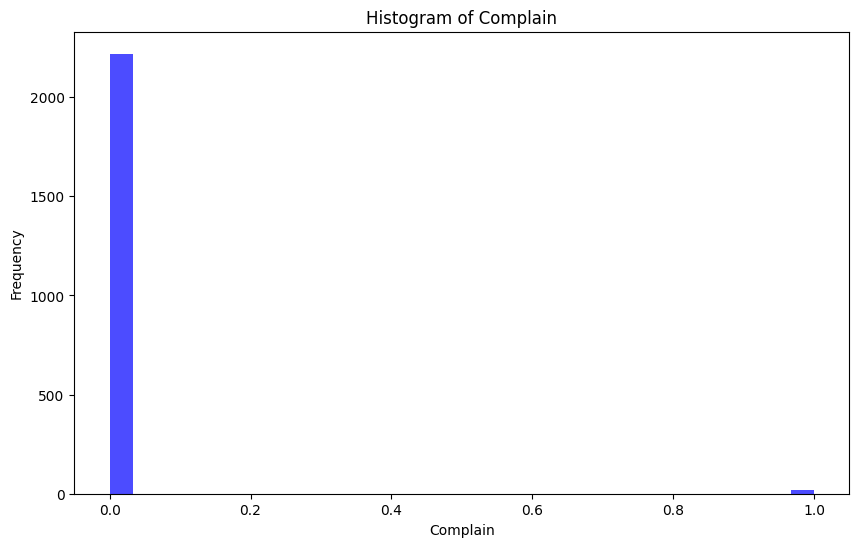

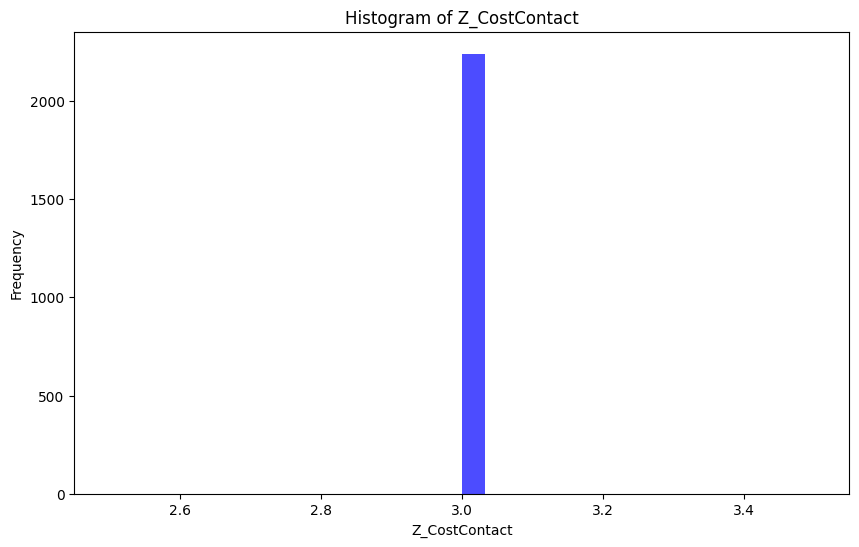

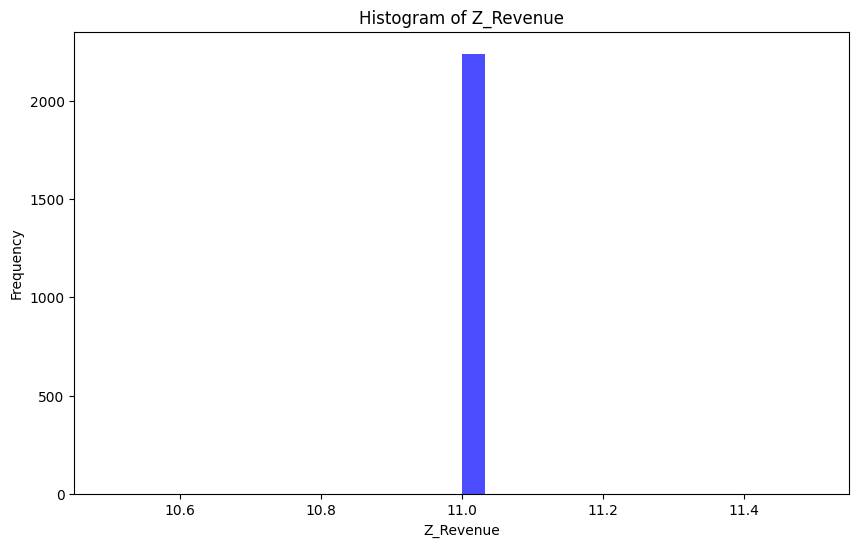

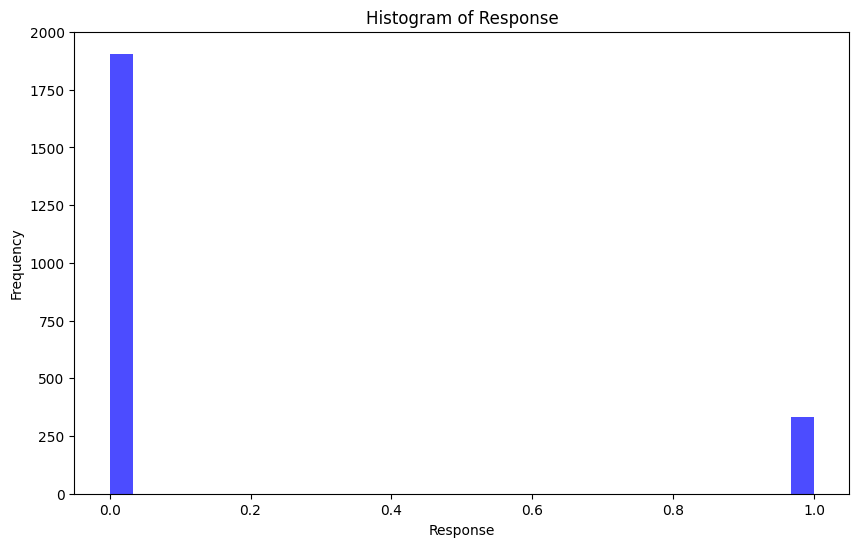

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Iterate over all columns
for column in data.columns:
    # Check data type
    if np.issubdtype(data[column].dtype, np.number):
        # If numerical, plot a histogram
        plt.figure(figsize=(10,6))
        plt.hist(data[column], bins=30, color='blue', alpha=0.7)
        plt.title(f'Histogram of {column}')
        plt.xlabel(column)
        plt.ylabel('Frequency')
        plt.show()
    else:
        # If non-numerical, plot a bar chart
        plt.figure(figsize=(10,6))
        data[column].value_counts().plot(kind='bar', color='blue', alpha=0.7)
        plt.title(f'Bar Chart of {column}')
        plt.ylabel('Frequency')
        plt.show()

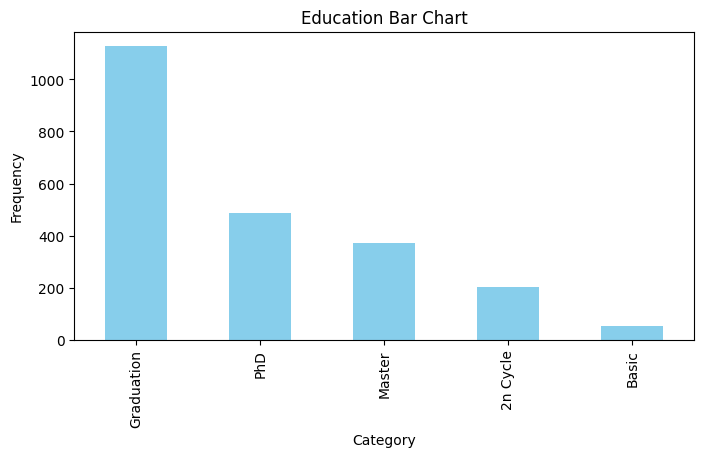

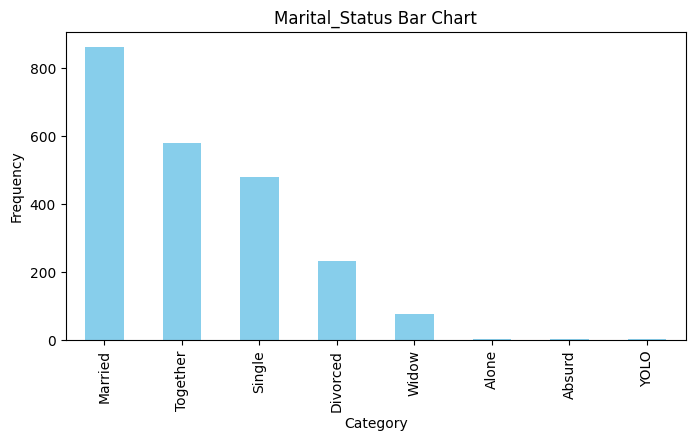

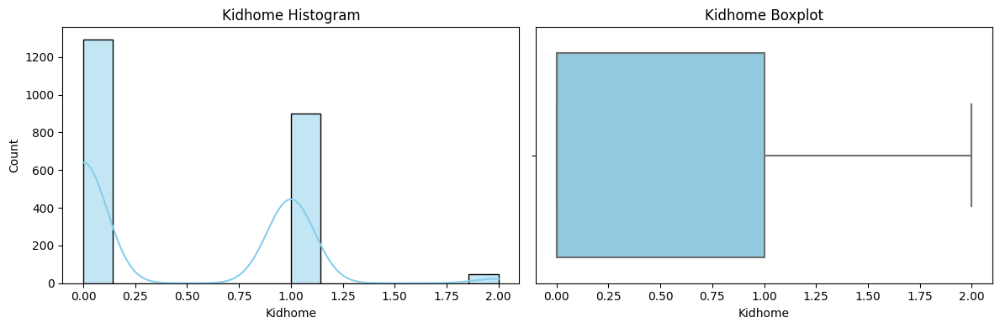

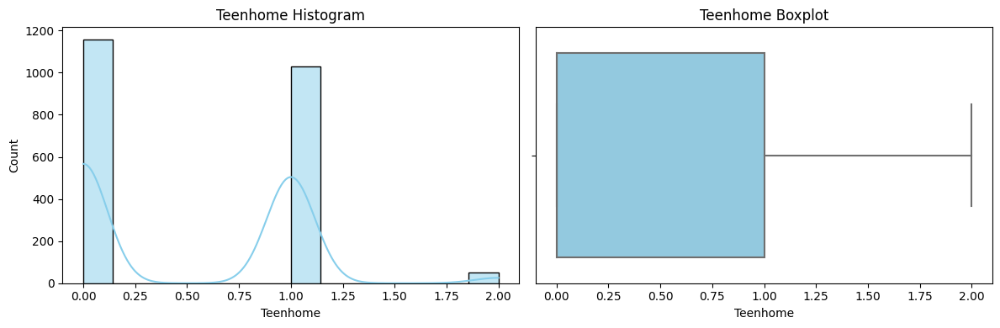

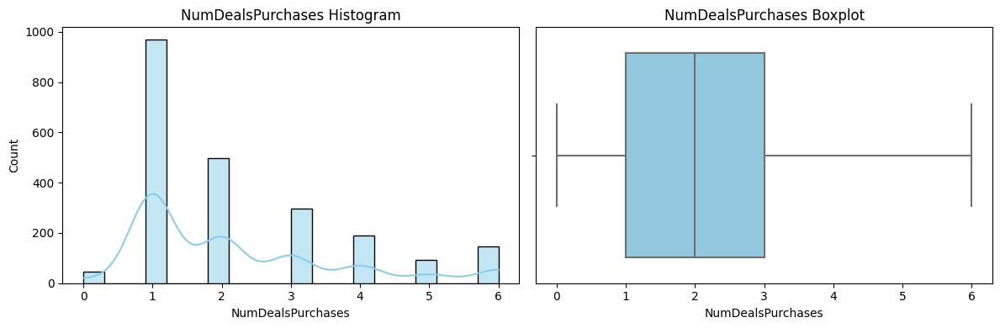

...

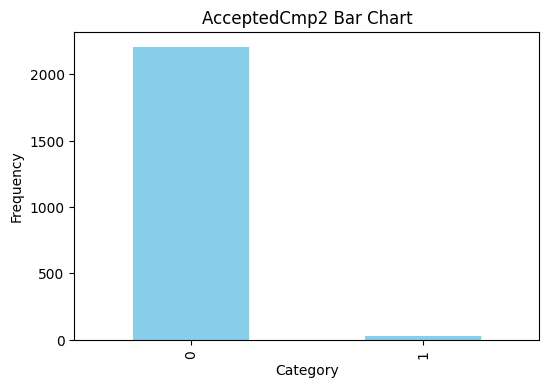

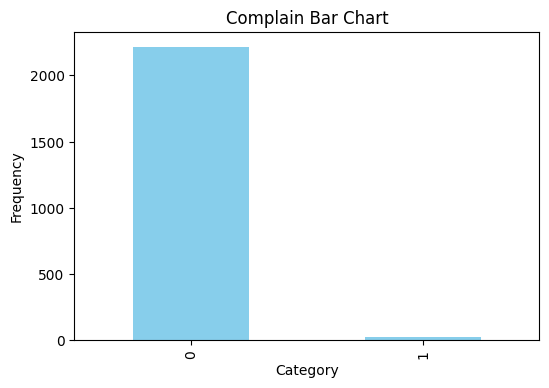

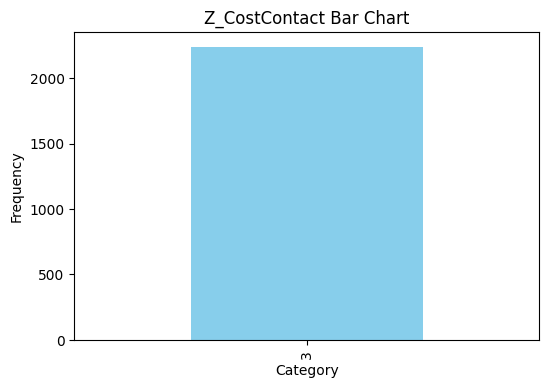

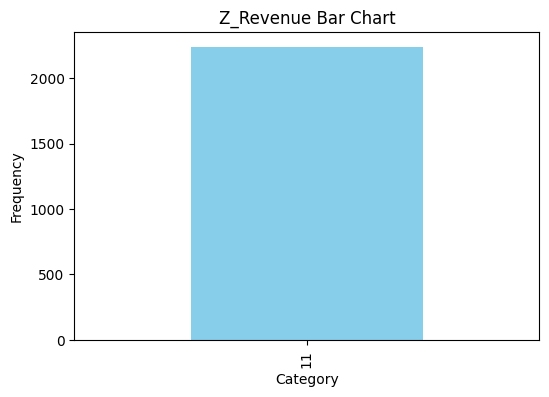

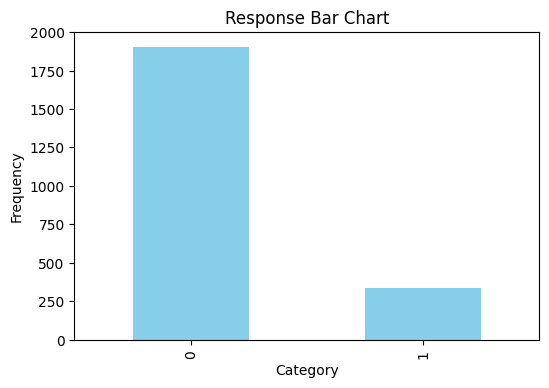

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

for col in data.columns:
    # Skip columns with too many unique values
    if len(data[col].unique()) > 50:
        continue

    # Determine the data type
    if pd.api.types.is_numeric_dtype(data[col]):
        if len(data[col].unique()) <= 2:
            # Binary data: bar chart
            plt.figure(figsize=(6, 4))
            data[col].value_counts().plot(kind='bar', color='skyblue')
            plt.title(f'{col} Bar Chart')
            plt.xlabel('Category')
            plt.ylabel('Frequency')
            plt.show()

        else:
            # Continuous data: histogram and boxplot
            fig, axs = plt.subplots(1, 2, figsize=(12, 4))

            sns.histplot(data=data, x=col, kde=True, color='skyblue', ax=axs[0])
            axs[0].set_title(f'{col} Histogram')

            sns.boxplot(x=data[col], color='skyblue', ax=axs[1])
            axs[1].set_title(f'{col} Boxplot')

            plt.tight_layout()
            plt.show()

    elif pd.api.types.is_string_dtype(data[col]) or pd.api.types.is_categorical_dtype(data[col]):
        # Qualitative data: bar chart
        plt.figure(figsize=(8, 4))
        data[col].value_counts().plot(kind='bar', color='skyblue')
        plt.title(f'{col} Bar Chart')
        plt.xlabel('Category')
        plt.ylabel('Frequency')
        plt.show()

## Whisker and violin

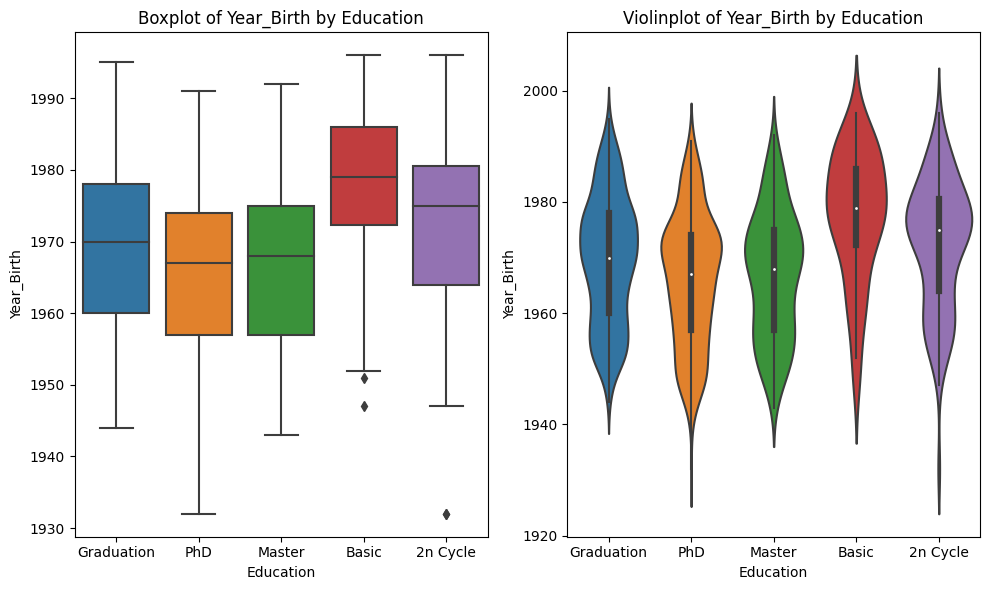

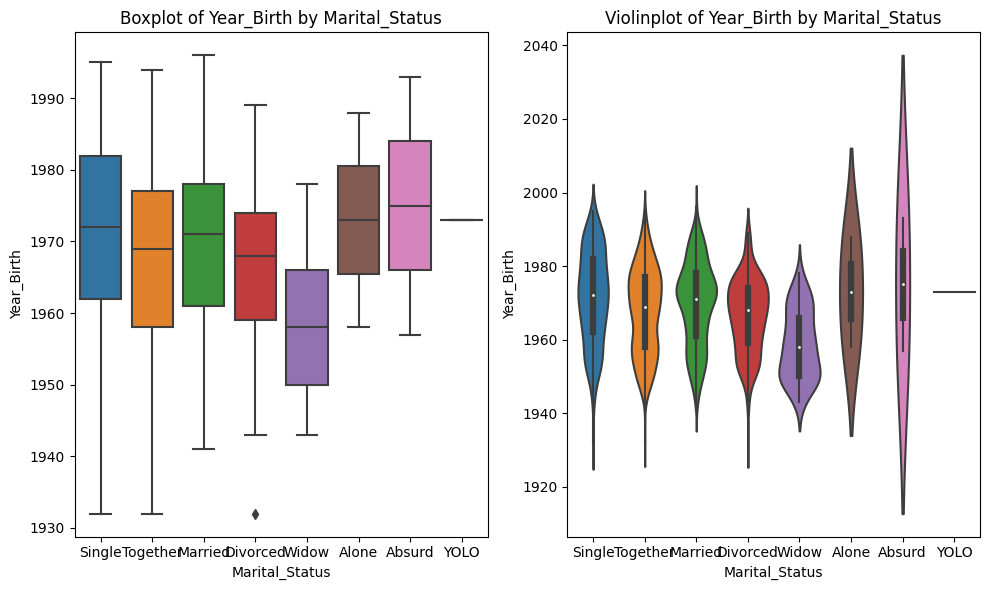

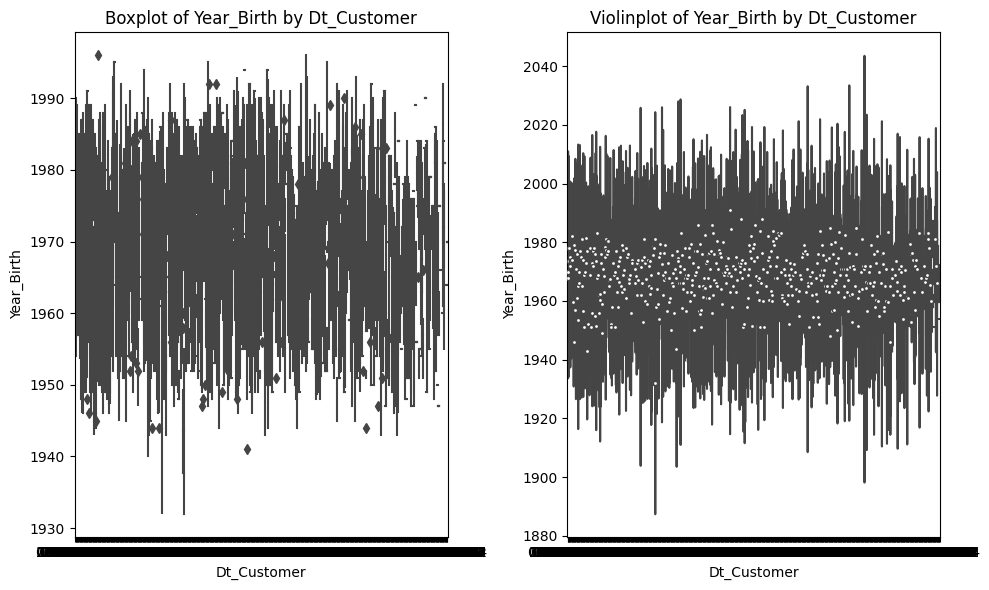

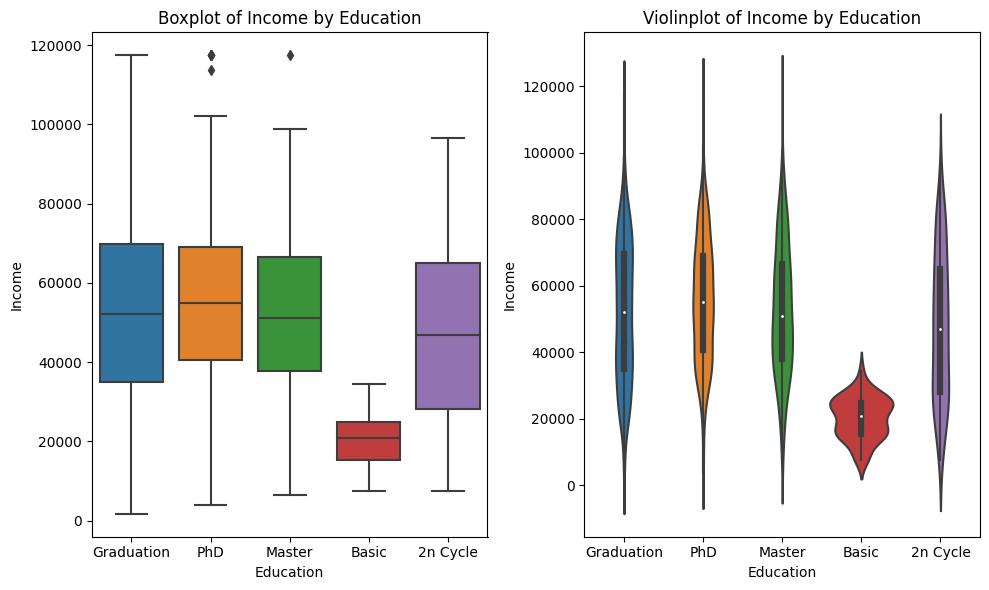

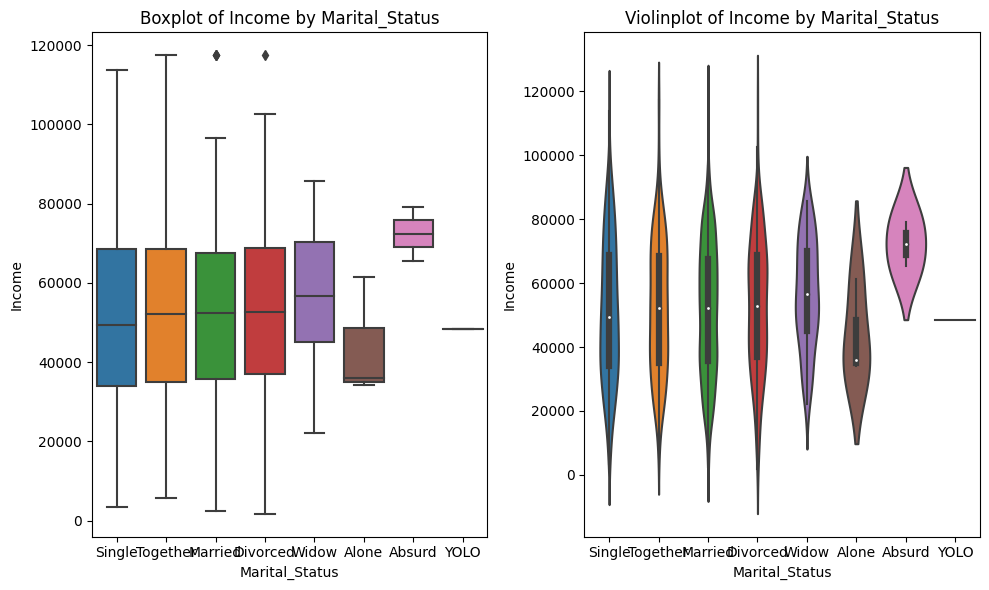

...

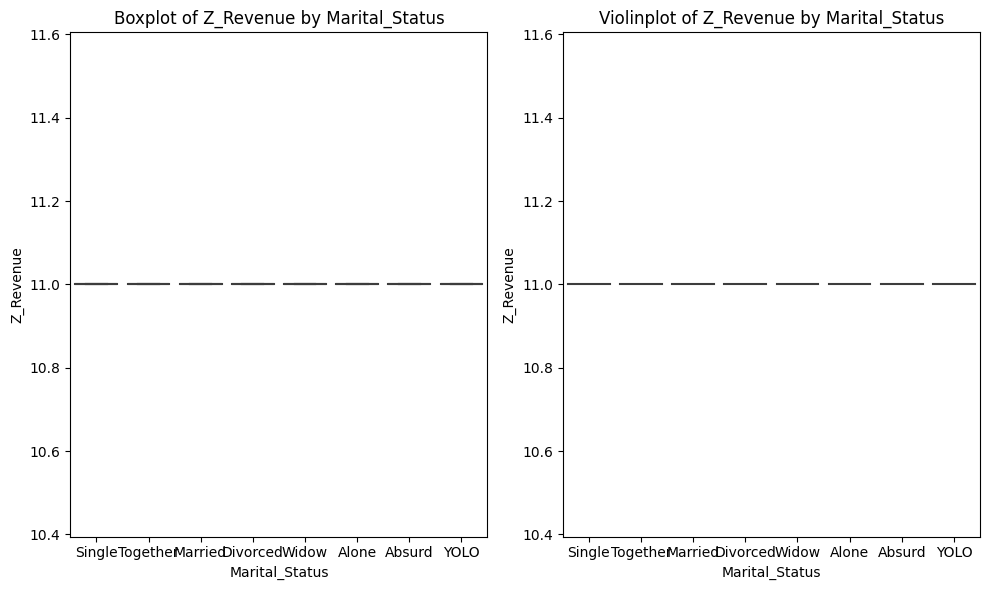

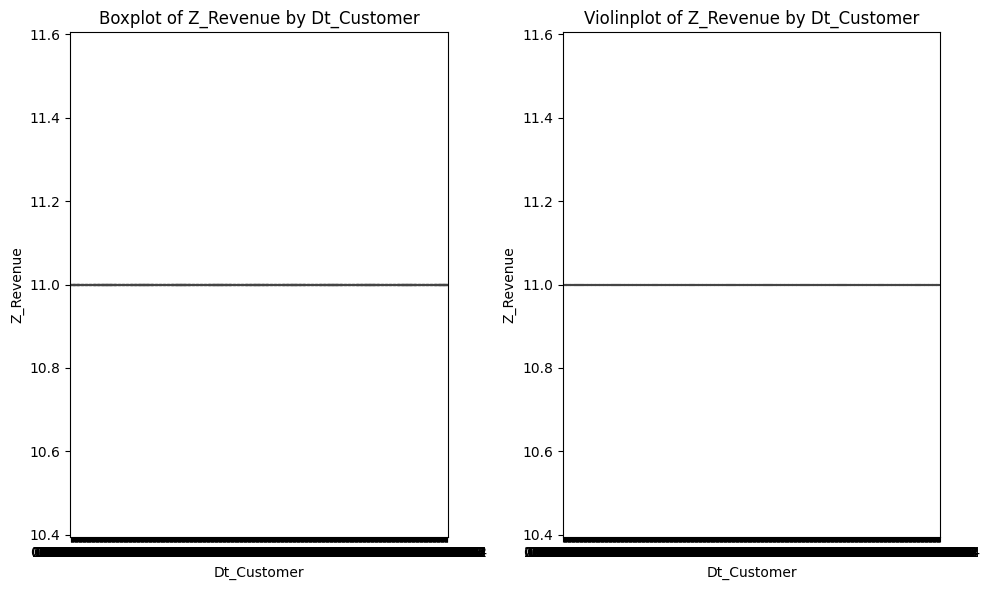

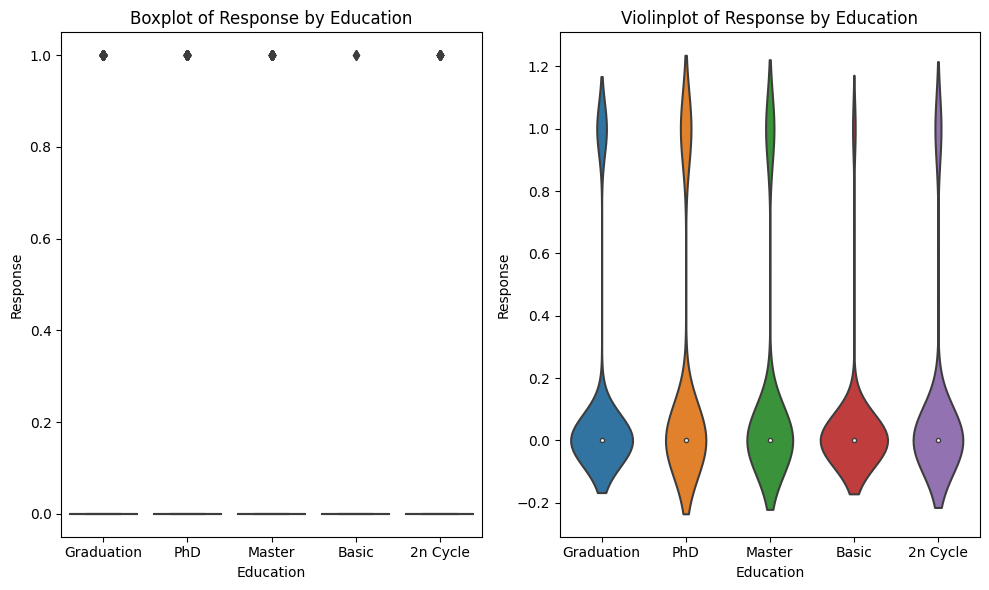

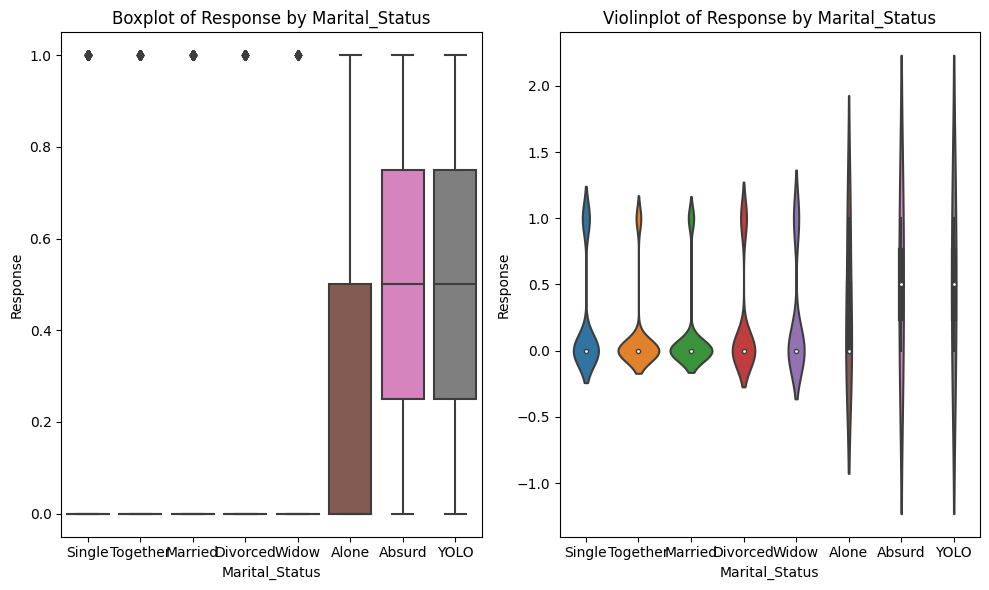

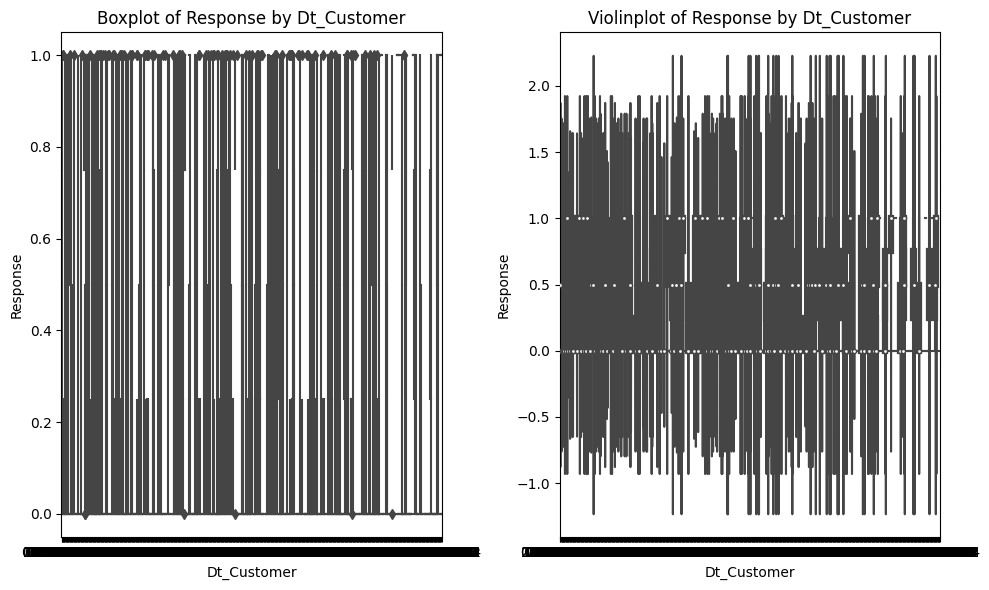

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Select the first 4 numerical columns
numerical_cols = data.select_dtypes(include=['int64', 'float64']).columns[:]

# Select the first qualitative column
qualitative_cols = data.select_dtypes(include=['object', 'bool', 'category']).columns[:]

# If both types of columns are available
if len(numerical_cols) > 0 and len(qualitative_cols) > 0:
    for num_col in numerical_cols:
        for qual_col in qualitative_cols:
            plt.figure(figsize=(10, 6))

            # Boxplot
            plt.subplot(1, 2, 1)
            sns.boxplot(x=qual_col, y=num_col, data=data)
            plt.title(f'Boxplot of {num_col} by {qual_col}')

            # Violinplot
            plt.subplot(1, 2, 2)
            sns.violinplot(x=qual_col, y=num_col, data=data)
            plt.title(f'Violinplot of {num_col} by {qual_col}')

            plt.tight_layout()
            plt.show()

## Scatter Plots

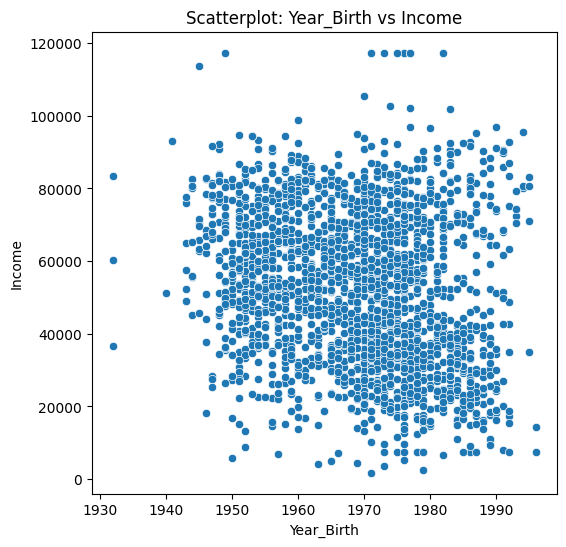

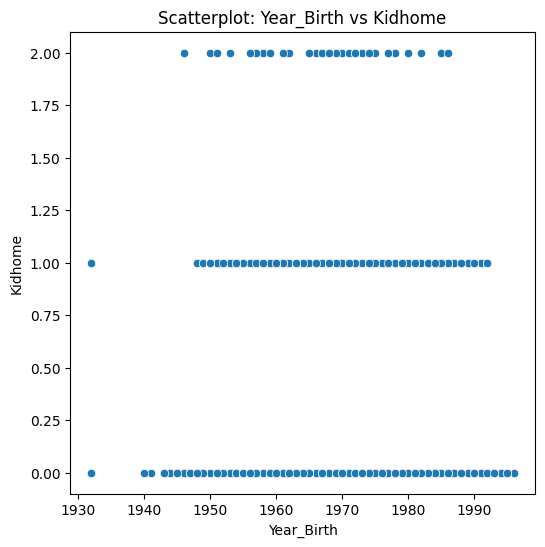

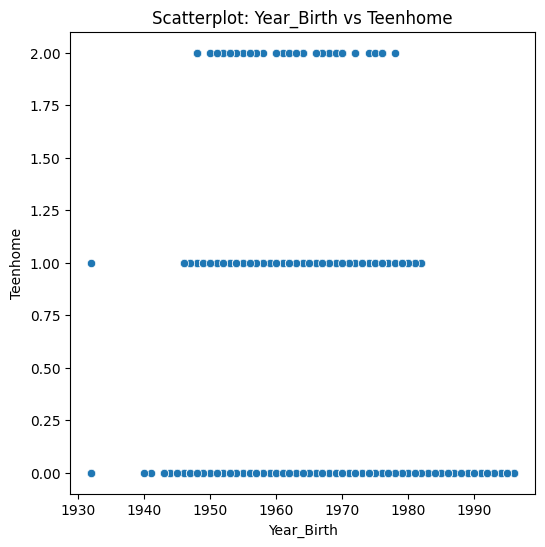

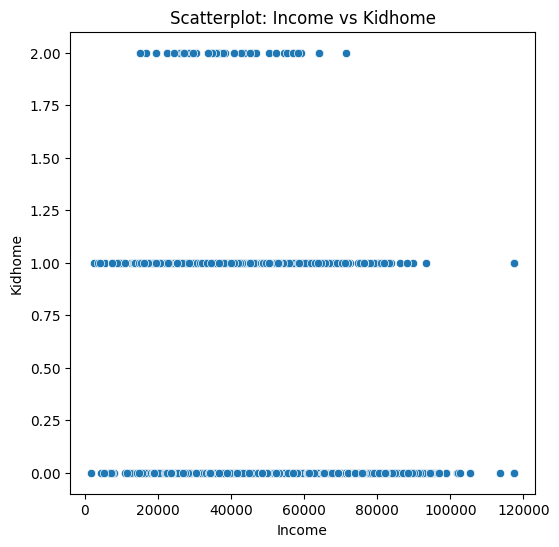

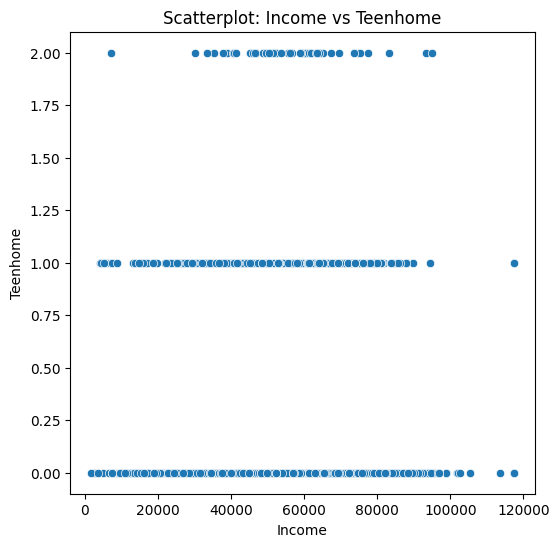

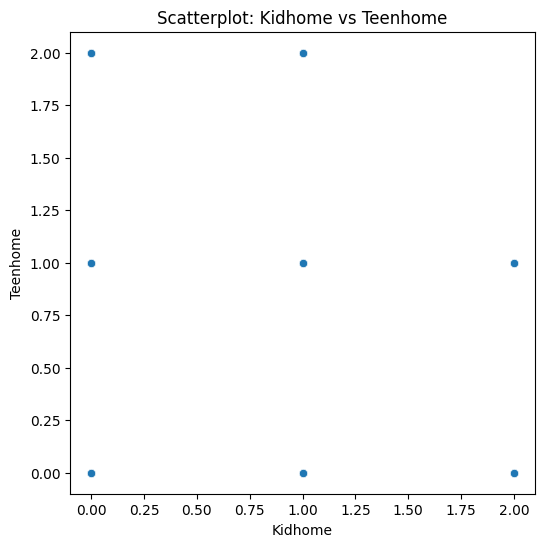

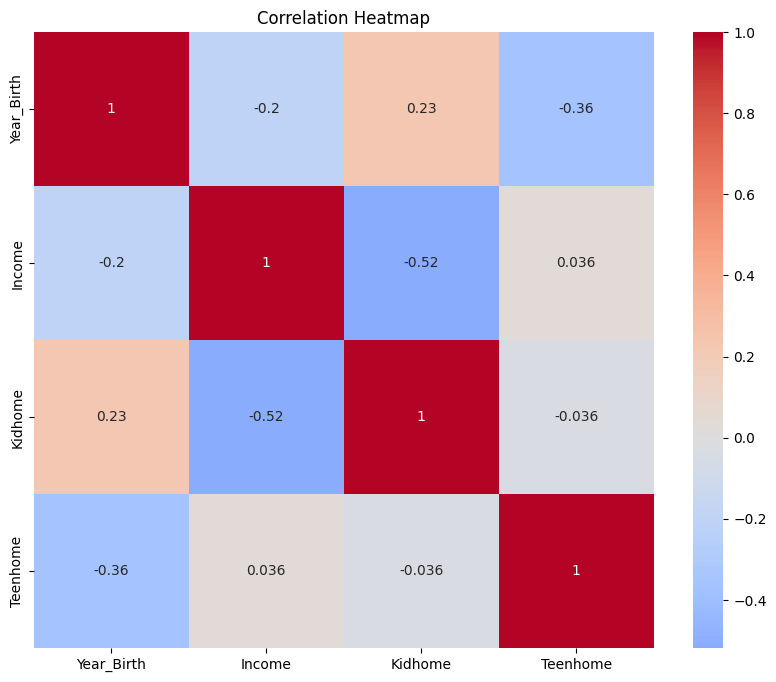

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Select the first 4 numerical columns
numerical_cols = data.select_dtypes(include=['int64', 'float64']).columns[:4]

# Let's create scatter plots for each pair of these numerical columns
for i in range(len(numerical_cols)):
    for j in range(i+1, len(numerical_cols)):
        plt.figure(figsize=(6, 6))
        sns.scatterplot(x=numerical_cols[i], y=numerical_cols[j], data=data)
        plt.title(f'Scatterplot: {numerical_cols[i]} vs {numerical_cols[j]}')
        plt.show()

# If you have more than two numerical columns, you can also create a correlation heatmap
if len(numerical_cols) > 2:
    correlation_matrix = data[numerical_cols].corr()
    plt.figure(figsize=(10, 8))
    sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0)
    plt.title('Correlation Heatmap')
    plt.show()

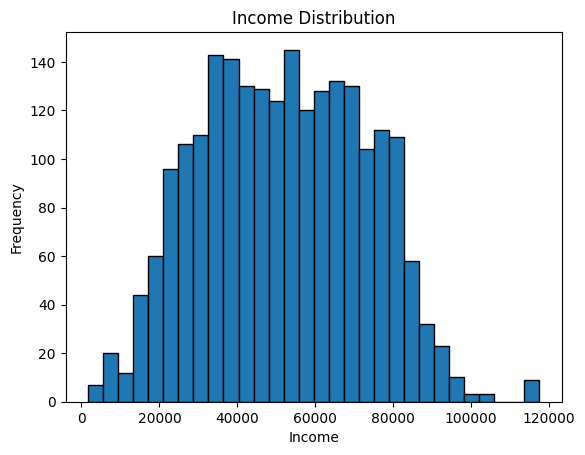

In [ ]:
import matplotlib.pyplot as plt

# Assume 'data' is your DataFrame
plt.hist(data['Income'], bins=30, edgecolor='black')
plt.title('Income Distribution')
plt.xlabel('Income')
plt.ylabel('Frequency')
plt.show()

(array([46., 45., 59., 51., 39., 42., 45., 50., 40., 39., 37., 58., 45.,
        30., 65., 40., 44., 49., 43., 41., 49., 42., 43., 45., 50., 37.,
        49., 44., 40., 53., 52., 49., 50., 46., 39., 39., 42., 35., 47.,
        38., 38., 49., 47., 50., 41., 47., 49., 48., 30., 44.]),
 array([15551.  , 15564.98, 15578.96, 15592.94, 15606.92, 15620.9 ,
        15634.88, 15648.86, 15662.84, 15676.82, 15690.8 , 15704.78,
        15718.76, 15732.74, 15746.72, 15760.7 , 15774.68, 15788.66,
        15802.64, 15816.62, 15830.6 , 15844.58, 15858.56, 15872.54,
        15886.52, 15900.5 , 15914.48, 15928.46, 15942.44, 15956.42,
        15970.4 , 15984.38, 15998.36, 16012.34, 16026.32, 16040.3 ,
        16054.28, 16068.26, 16082.24, 16096.22, 16110.2 , 16124.18,
        16138.16, 16152.14, 16166.12, 16180.1 , 16194.08, 16208.06,
        16222.04, 16236.02, 16250.  ]),
 <BarContainer object of 50 artists>)

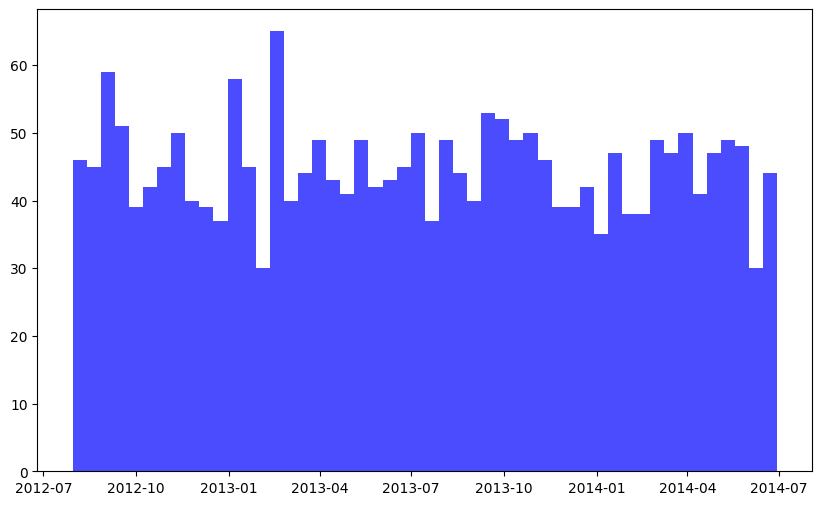

In [ ]:
import matplotlib.pyplot as plt

# Convert 'Dt_Customer' to datetime if not already
data['Dt_Customer'] = pd.to_datetime(data['Dt_Customer'], dayfirst=True)

# Extract year from 'Dt_Customer' for boxplot
data['Year'] = data['Dt_Customer'].dt.year

# Create a histogram
plt.figure(figsize=(10,6))
plt.hist(data['Dt_Customer'], bins=50, color='blue', alpha=0.7)

> Q1e. Describe 3 observed patterns/ anomalies, and explain how would you plan/change your approach in upcoming data preparation/modeling based on the observations

**Answer:**

| | Pattern/Anomalies Observed | Respective Insights based on Observation |
|--|--|--|
| Pattern 1 | (Teenhome has very low correlation with the data) | (Consider feature clipping this when tryinig to predict some points sucj as income or kidhome) |
| Pattern 2 | (Number of web visits is quite skewed (high values but at a low frequency) | (Consider removing these) |
| Pattern 3 | Several violin plots exibit skewness| Take logarithm to normalize the data |




--------



#### **Step 2. Data Preparation**
In this step, you will prepare the data for modeling by applying appropriate techniques such as data cleaning, feature engineering, feature selection, and data transformation. You will also split the data into training and testing sets.

> Q2a. Identify Data Type of Each Column & Respective Data Preprocessing Methods
- **Type:** Nominal | Ordinal | Discrete | Continuous
- **Data Preprocessing Method:** One Hot Encoding | Rank Replacement | Normalization | Missing Data | Outlier | Feature Engineer | Data Balancing

**Answer:** I have written code for this`

| Column | Data Type | Data Preprocessing |
|--|--|--|
ID                 | (Discrete) | (Being used as index) |
Year_Birth         | (Discrete) | (Fill in the blank) |      
Education          | (Nominal) | (One hot encoding) |       
Marital_Status     | (Nominal) | (One hot encoding) |
Income             | (Continuos) | (dropped missing values) |      
Kidhome            | (Discrete) | (Data balancing) |        
Teenhome           | (Discrete) | (Data balancing)|   
Dt_Customer        | (Discrete / Nominal) | (Feature engineering: split) |      
Recency            | (Discrete) | (Outlier + norm) |     
MntWines           | (Discrete) | (Outlier + norm) |    
MntFruits          | (Discrete) | (Outlier + norm) |    
MntMeatProducts    | (Discrete) | (Outlier + norm) |     
MntFishProducts    | (Discrete) | (Outlier + norm) |    
MntSweetProducts   | (Discrete) | (Outlier + norm) |    
MntGoldProds       | (Discrete) | (Outlier + norm) |
NumDealsPurchases  | (Discrete) | (Outlier) |  
NumWebPurchases    | (Discrete) | (Outlier) |
NumCatalogPurchases| (Discrete) | (Outlier) |
NumStorePurchases  | (Discrete) | (Outlier) |  
NumWebVisitsMonth  | (Discrete) | (Outlier) |  
AcceptedCmp3       | (Discrete) | (Data balancing) |  
AcceptedCmp4       | (Discrete) | (Data balancing) |       
AcceptedCmp5       | (Discrete) | (Data balancing) |       
AcceptedCmp1       | (Discrete) | (Data balancing) |       
AcceptedCmp2       | (Discrete) | (Data balancing) |       
Complain           | (Discrete) | (Data balancing) |       
Z_CostContact      | (Discrete) | (Nothing) |     
Z_Revenue          | (Discrete) | (Nothing) |          
Response           | (Discrete) | (Data balancing) |


In [ ]:
# Function to determine data type
def identify_data_type(series):
    if series.dtype == 'O':  # if the series is of type object (string), it could be Nominal or Ordinal
        unique_vals = series.nunique()
        if unique_vals < 10:  # This is an arbitrary threshold, adjust depending on your data
            return 'Nominal'
        else:
            return 'Ordinal'
    elif np.issubdtype(series.dtype, np.integer):  # integer type could be considered Discrete
        return 'Discrete'
    elif np.issubdtype(series.dtype, np.floating):  # float type could be considered Continuous
        return 'Continuous'
    else:
        return 'Unknown'

# Function to suggest preprocessing methods
def suggest_preprocessing(data_type):
    if data_type == 'Nominal':
        return ['One Hot Encoding']
    elif data_type == 'Ordinal':
        return ['Rank Replacement', 'Missing Data', 'Outlier', 'Data Balancing']
    elif data_type == 'Discrete':
        return ['Missing Data', 'Outlier', 'Feature Engineer', 'Data Balancing']
    elif data_type == 'Continuous':
        return ['Normalization', 'Missing Data', 'Outlier', 'Feature Engineer']
    else:
        return []

# Apply functions to each column
for column in data.columns:
    data_type = identify_data_type(data[column])
    methods = suggest_preprocessing(data_type)
    print(f'Column: {column}\nType: {data_type}\nPreprocessing Methods: {methods}\n')

Column: Year_Birth
Type: Discrete
Preprocessing Methods: ['Missing Data', 'Outlier', 'Feature Engineer', 'Data Balancing']

Column: Education
Type: Nominal
Preprocessing Methods: ['One Hot Encoding']

Column: Marital_Status
Type: Nominal
Preprocessing Methods: ['One Hot Encoding']

Column: Income
Type: Continuous
Preprocessing Methods: ['Normalization', 'Missing Data', 'Outlier', 'Feature Engineer']

Column: Kidhome
Type: Continuous
Preprocessing Methods: ['Normalization', 'Missing Data', 'Outlier', 'Feature Engineer']

Column: Teenhome
Type: Continuous
Preprocessing Methods: ['Normalization', 'Missing Data', 'Outlier', 'Feature Engineer']

Column: Dt_Customer
Type: Ordinal
Preprocessing Methods: ['Rank Replacement', 'Missing Data', 'Outlier', 'Data Balancing']

Column: Recency
Type: Discrete
Preprocessing Methods: ['Missing Data', 'Outlier', 'Feature Engineer', 'Data Balancing']

Column: MntWines
Type: Discrete
Preprocessing Methods: ['Missing Data', 'Outlier', 'Feature Engineer', 'Da

>  Q2b. Perform the aforementioned Data Preprocessings

In [ ]:
#@title Q2b. Perform the aforementioned Data Preprocessings
# Q2b. Preform Data Preprocessing

# import xxx as xxx (Import panda Libraries)
# from sklearn.preprocessing import xxx (Import sklearn libraries)
# ....
#

# Hot encoding

In [ ]:
import pandas as pd

# Assume 'data' is your DataFrame
nominal_columns = [col for col in data.columns if identify_data_type(data[col]) == 'Nominal']

# Perform one-hot encoding
data_encoded = pd.get_dummies(data, columns=nominal_columns)

# Now data_encoded is your new DataFrame with one-hot encoded nominal columns
print(data_encoded)

       Year_Birth   Income  Kidhome  Teenhome Dt_Customer  Recency  MntWines  \
ID                                                                             
5524         1957  58138.0      0.0       0.0  04-09-2012       58       635   
2174         1954  46344.0      1.0       1.0  08-03-2014       38        11   
4141         1965  71613.0      0.0       0.0  21-08-2013       26       426   
6182         1984  26646.0      1.0       0.0  10-02-2014       26        11   
5324         1981  58293.0      1.0       0.0  19-01-2014       94       173   
...           ...      ...      ...       ...         ...      ...       ...   
10870        1967  61223.0      0.0       1.0  13-06-2013       46       709   
4001         1946  64014.0      2.0       1.0  10-06-2014       56       406   
7270         1981  56981.0      0.0       0.0  25-01-2014       91       908   
8235         1956  69245.0      0.0       1.0  24-01-2014        8       428   
9405         1954  52869.0      1.0     

In [ ]:
data_encoded.shape

(2240, 39)

# Upsizing

In [ ]:
import pandas as pd

# Assume 'data_encoded' is your DataFrame

# Filter the data where 'Kidhome' and 'Teenhome' are 2
data_Kidhome = data_encoded[data_encoded['Kidhome'] == 2]
data_Teenhome = data_encoded[data_encoded['Teenhome'] == 2]

# Calculate the number of samples for upsampling
n_Kidhome = len(data_encoded[data_encoded['Kidhome'] == 2])
n_Teenhome = len(data_encoded[data_encoded['Teenhome'] == 2])

# Upsample 'Kidhome' and 'Teenhome'
data_Kidhome_upsampled = data_Kidhome.sample(n_Kidhome, replace=True, random_state=42)
data_Teenhome_upsampled = data_Teenhome.sample(n_Teenhome, replace=True, random_state=42)

# Combine original data with upsampled data and assign to 'data_upped'
data_upped = pd.concat([data_encoded, data_Kidhome_upsampled, data_Teenhome_upsampled])

In [ ]:
data_upped.shape

(2340, 39)

# Splitting the date

In [ ]:
import pandas as pd

# Convert 'Dt_Customer' to datetime if not already
data_upped['Dt_Customer'] = pd.to_datetime(data_upped['Dt_Customer'], dayfirst=True)

# Create new dataframe
data_new = data_upped.copy()

# Create new features
data_new['Year'] = data_upped['Dt_Customer'].dt.year
data_new['Month'] = data_upped['Dt_Customer'].dt.month
data_new['Day'] = data_upped['Dt_Customer'].dt.day
data_new['DayOfWeek'] = data_upped['Dt_Customer'].dt.dayofweek

In [ ]:
data_new.shape

(2340, 43)

# Scaling

In [ ]:
from sklearn.preprocessing import StandardScaler

# Create a StandardScaler instance
scaler = StandardScaler()

# Fit the scaler to the data and transform the data
data_new[['MntMeatProducts', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds']] = scaler.fit_transform(data_new[['MntMeatProducts', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds']])

# Create a new DataFrame with normalized data
data_norm = data_new.copy()

In [ ]:
data_norm = data_norm.drop(columns='Dt_Customer')

In [ ]:
data_norm.shape

(2340, 42)

In [ ]:
import scipy.stats as stats

# Define the columns
columns = ['AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1', 'AcceptedCmp2', 'Complain', 'Response']

# Calculate the Chi-Square test of independence for each pair of columns
for i in range(len(columns)):
    for j in range(i+1, len(columns)):
        crosstab = pd.crosstab(data_new[columns[i]], data_new[columns[j]])
        chi2, p, _, _ = stats.chi2_contingency(crosstab)
        if p < 0.05:
            print(f"The variables {columns[i]} and {columns[j]} are dependent (p = {p}).")
        else:
            print(f"The variables {columns[i]} and {columns[j]} are independent (p = {p}).")

The variables AcceptedCmp3 and AcceptedCmp4 are dependent (p = 0.00029080874215436285).
The variables AcceptedCmp3 and AcceptedCmp5 are dependent (p = 8.691020590068801e-05).
The variables AcceptedCmp3 and AcceptedCmp1 are dependent (p = 1.971109359604558e-05).
The variables AcceptedCmp3 and AcceptedCmp2 are dependent (p = 0.0002042839704277942).
The variables AcceptedCmp3 and Complain are independent (p = 0.9991289942175245).
The variables AcceptedCmp3 and Response are dependent (p = 3.392770868061198e-34).
The variables AcceptedCmp4 and AcceptedCmp5 are dependent (p = 7.934530328620956e-52).
The variables AcceptedCmp4 and AcceptedCmp1 are dependent (p = 9.505794778549262e-33).
The variables AcceptedCmp4 and AcceptedCmp2 are dependent (p = 1.8323663041459506e-40).
The variables AcceptedCmp4 and Complain are independent (p = 0.3807058717021542).
The variables AcceptedCmp4 and Response are dependent (p = 3.020895040400528e-18).
The variables AcceptedCmp5 and AcceptedCmp1 are dependent (

In [ ]:
data_norm.shape

(2340, 42)

In [ ]:
# Define the list of columns you want to balance
target_columns = ['AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1', 'AcceptedCmp2', 'Complain', 'Response']

# Create a copy of the original DataFrame
data_resampled = data_norm.copy()

# Loop through each column and duplicate the minority class
for target in target_columns:
    # Determine the minority and majority classes
    if data_resampled[target].value_counts()[0] > data_resampled[target].value_counts()[1]:
        data_majority = data_resampled[data_resampled[target] == 0]
        data_minority = data_resampled[data_resampled[target] == 1]
    else:
        data_majority = data_resampled[data_resampled[target] == 1]
        data_minority = data_resampled[data_resampled[target] == 0]

    # Duplicate the minority class
    data_minority_duplicated = data_minority.copy()

    # Combine majority class with duplicated minority class
    data_resampled = pd.concat([data_majority, data_minority, data_minority_duplicated])

# Print the count of each class in each target column
for target in target_columns:
    print(data_resampled[target].value_counts())

0    3610
1     806
Name: AcceptedCmp3, dtype: int64
0    3278
1    1138
Name: AcceptedCmp4, dtype: int64
0    2964
1    1452
Name: AcceptedCmp5, dtype: int64
0    3116
1    1300
Name: AcceptedCmp1, dtype: int64
0    3896
1     520
Name: AcceptedCmp2, dtype: int64
0    4352
1      64
Name: Complain, dtype: int64
0    2460
1    1956
Name: Response, dtype: int64


In [ ]:
data_resampled.shape

(4416, 42)

In [ ]:
pd.set_option('display.max_columns', None)
print(data_resampled)

       Year_Birth   Income  Kidhome  Teenhome  Recency  MntWines  MntFruits  \
ID                                                                            
2174         1954  46344.0      1.0       1.0       38        11          1   
4141         1965  71613.0      0.0       0.0       26       426         49   
6182         1984  26646.0      1.0       0.0       26        11          4   
5324         1981  58293.0      1.0       0.0       94       173         43   
7446         1967  62513.0      0.0       1.0       16       520         42   
...           ...      ...      ...       ...      ...       ...        ...   
10971        1977  37774.0      2.0       0.0       28       173          8   
4427         1995  83257.0      0.0       0.0       56       536         27   
4427         1995  83257.0      0.0       0.0       56       536         27   
4427         1995  83257.0      0.0       0.0       56       536         27   
4427         1995  83257.0      0.0       0.0       

# Creating the predictor by giving weights

In [ ]:
weights = {'AcceptedCmp1': 6, 'AcceptedCmp2': 5, 'AcceptedCmp3': 4, 'AcceptedCmp4': 3, 'AcceptedCmp5': 2, 'Response': 1}

# Create the predictor column
data_resampled['predictor'] = sum(data_resampled[column] * weight for column, weight in weights.items())

# Create a new dataframe excluding the old columns
columns_to_drop = list(weights.keys())
data_tosplit = data_resampled.drop(columns=columns_to_drop)

In [ ]:
weights = {'AcceptedCmp1': 6, 'AcceptedCmp2': 5, 'AcceptedCmp3': 4, 'AcceptedCmp4': 3, 'AcceptedCmp5': 2, 'Response': 1}

# Create the predictor column
data_resampled['predictor'] = sum(data_resampled[column] * weight for column, weight in weights.items())

# Create a new dataframe excluding the old columns
columns_to_drop = list(weights.keys())
data_tosplit = data_resampled.drop(columns=columns_to_drop)

In [ ]:
data_tosplit

,Year_Birth,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,Complain,Z_CostContact,Z_Revenue,Education_2n Cycle,Education_Basic,Education_Graduation,Education_Master,Education_PhD,Marital_Status_Absurd,Marital_Status_Alone,Marital_Status_Divorced,Marital_Status_Married,Marital_Status_Single,Marital_Status_Together,Marital_Status_Widow,Marital_Status_YOLO,Year,Month,Day,DayOfWeek,predictor
ID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2174,1954,46344.0,1.0,1.0,38,11,1,-0.799885,-0.733312,-0.746263,-0.827601,2,1,1,2.0,5,0,3,11,0,0,1,0,0,0,0,0,0,1,0,0,0,2014,3,8,5,0
4141,1965,71613.0,0.0,0.0,26,426,49,-0.116819,1.997418,-0.013696,0.079695,1,8,2,10.0,4,0,3,11,0,0,1,0,0,0,0,0,0,0,1,0,0,2013,8,21,2,0
6182,1984,26646.0,1.0,0.0,26,11,4,-0.720852,-0.532892,-0.673006,-0.852804,2,2,0,4.0,6,0,3,11,0,0,1,0,0,0,0,0,0,0,1,0,0,2014,2,10,0,0
5324,1981,58293.0,1.0,0.0,94,173,43,-0.167625,0.369001,0.206073,-0.600777,5,5,3,6.0,5,0,3,11,0,0,0,0,1,0,0,0,1,0,0,0,0,2014,1,19,6,0
7446,1967,62513.0,0.0,1.0,16,520,42,-0.280529,-0.783417,0.755498,-0.625980,2,6,4,10.0,6,0,3,11,0,0,0,1,0,0,0,0,0,0,1,0,0,2013,9,9,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10971,1977,37774.0,2.0,0.0,28,173,8,-0.229722,-0.608049,-0.709634,2.209321,4,7,2,3.0,9,1,3,11,0,0,1,0,0,0,0,0,0,1,0,0,0,2012,9,3,0,5
4427,1995,83257.0,0.0,0.0,56,536,27,2.304960,0.168580,2.184002,0.709762,1,5,10,12.0,6,1,3,11,1,0,0,0,0,0,0,0,0,1,0,0,0,2012,9,18,1,7
4427,1995,83257.0,0.0,0.0,56,536,27,2.304960,0.168580,2.184002,0.709762,1,5,10,12.0,6,1,3,11,1,0,0,0,0,0,0,0,0,1,0,0,0,2012,9,18,1,7


In [ ]:
# Count occurrences of each value in 'predictor' column
predictor_counts = data_tosplit['predictor'].value_counts()

# Print the counts
print(predictor_counts)

0     1736
12     376
1      296
5      280
3      230
17     224
6      208
4      202
9      180
13     160
11     104
18      96
2       76
10      76
7       76
8       48
15      32
16      16
Name: predictor, dtype: int64


#### **Step 3. Modeling**
In this step, you will choose and apply one or more machine learning algorithms to build predictive models using the training data.

In [ ]:
# Randomly shuffle the DataFrame
data_ML = data_tosplit.sample(frac=1, random_state=42)

In [ ]:
data_ML.shape

(4416, 38)

>  Q3a. Generate Test/Training Data Split

In [ ]:
from sklearn.model_selection import train_test_split

# Get the number of rows in data_ML
n = data_ML.shape[0]

# Compute the number of rows that correspond to 80%
train_size = int(0.8 * n)

# Split the data
train_data = data_ML[:train_size]
test_data = data_ML[train_size:]

# Now, train_data contains 80% of the data and test_data contains the remaining 20%.

In [ ]:
train_data.shape

(3532, 37)

> Q3b. Choose and deploy dataset to 3+ ML Model

In [ ]:
#@title Q3b. Choose and deploy dataset to 3+ ML Model
# Q3b. Choose 3 models to deploy dataset to
# Tips: Do not afraid to test out various models, to find out which model fits the datasets the best

# Step 1. Import Model

# Step 2. Fit Dataframe into Model

# Step 3. Generate Model Prediction (Y)

# Clustering

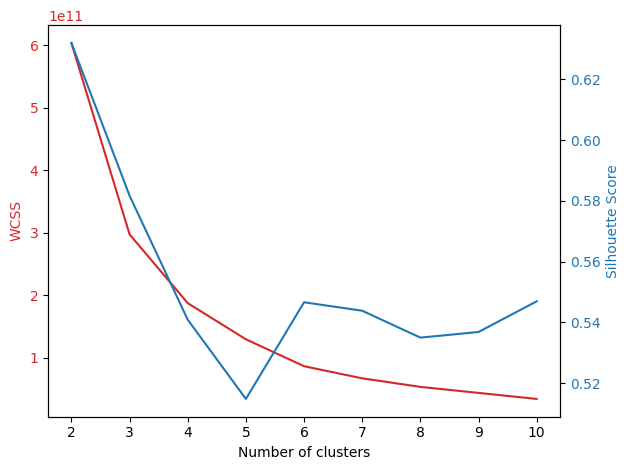

Optimal number of clusters: 2


In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
import numpy as np

# Choosing number of clusters using Elbow Method and silhouette score
wcss = []  # Within-Cluster Sum of Square
silhouette_scores = []  # Silhouette score
range_clusters = range(2, 11)  # Test from 2 to 10 clusters

for i in range_clusters:
    kmeans = KMeans(n_clusters=i, init='k-means++', max_iter=300, n_init=10, random_state=0)
    kmeans.fit(data_ML)
    wcss.append(kmeans.inertia_)
    silhouette_scores.append(silhouette_score(data_ML, kmeans.labels_))

# Plotting the results
fig, ax1 = plt.subplots()

color = 'tab:red'
ax1.set_xlabel('Number of clusters')
ax1.set_ylabel('WCSS', color=color)
ax1.plot(range_clusters, wcss, color=color)
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()
color = 'tab:blue'
ax2.set_ylabel('Silhouette Score', color=color)
ax2.plot(range_clusters, silhouette_scores, color=color)
ax2.tick_params(axis='y', labelcolor=color)

fig.tight_layout()
plt.show()

# Assuming the optimal number of clusters is where the maximum silhouette score is
optimal_clusters = np.argmax(silhouette_scores) + 2  # +2 because our range starts from 2
print(f"Optimal number of clusters: {optimal_clusters}")

# Now run K-Means with the optimal number of clusters
kmeans = KMeans(n_clusters=optimal_clusters, init='k-means++', max_iter=300, n_init=10, random_state=0)
pred_y = kmeans.fit_predict(data_ML)

# Add cluster labels to the original data
data_ML['Cluster'] = pred_y

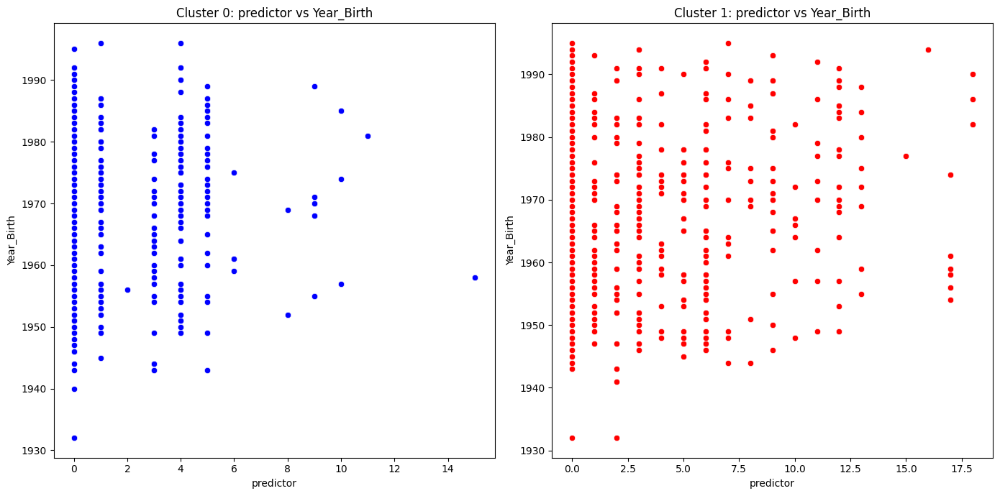

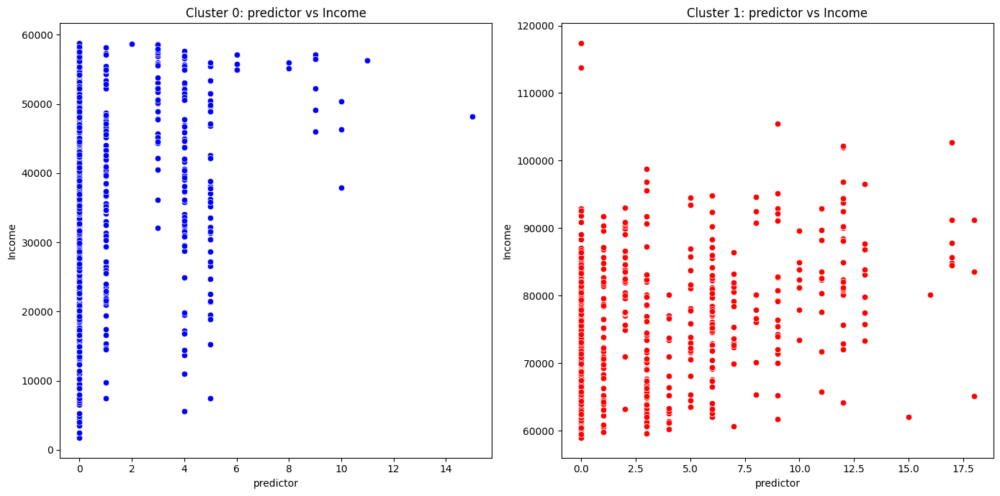

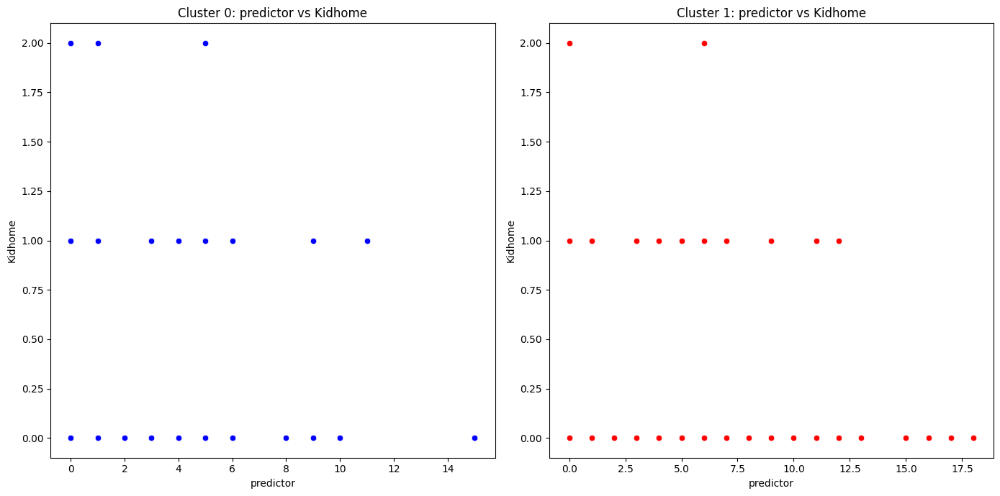

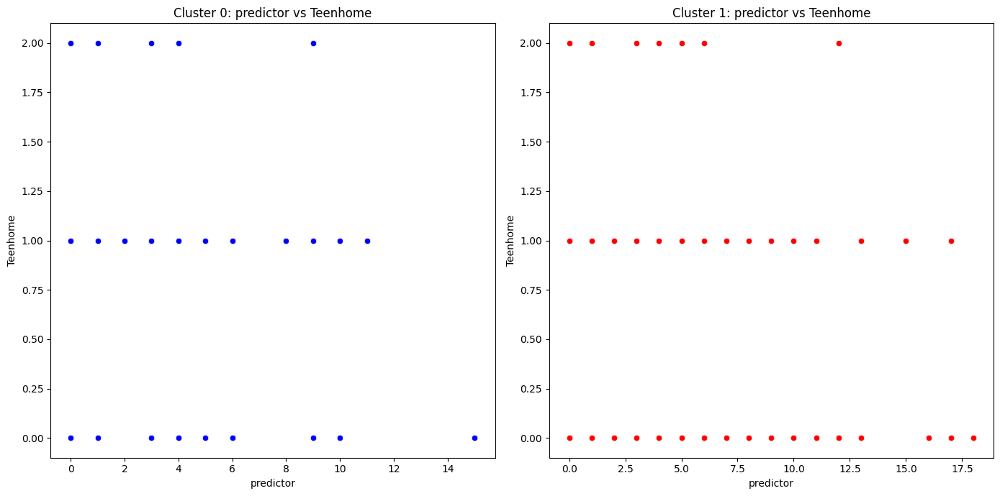

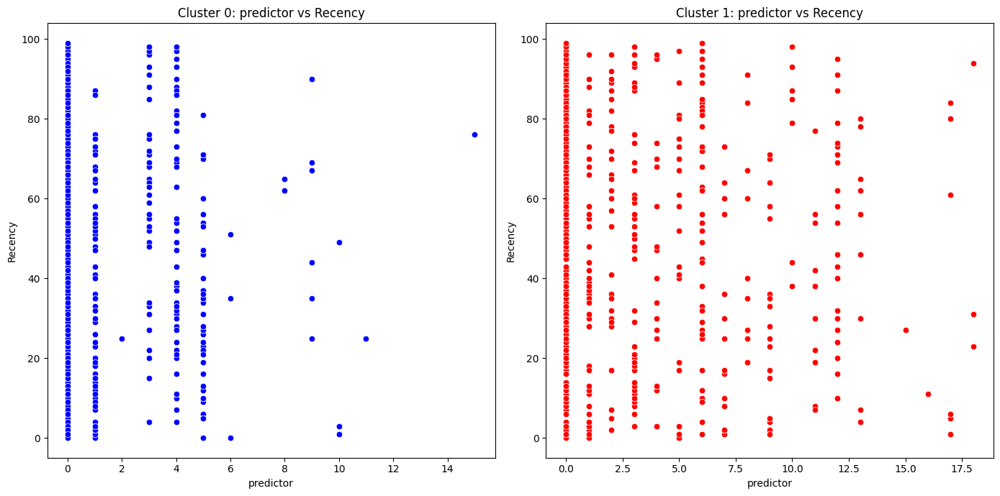

...

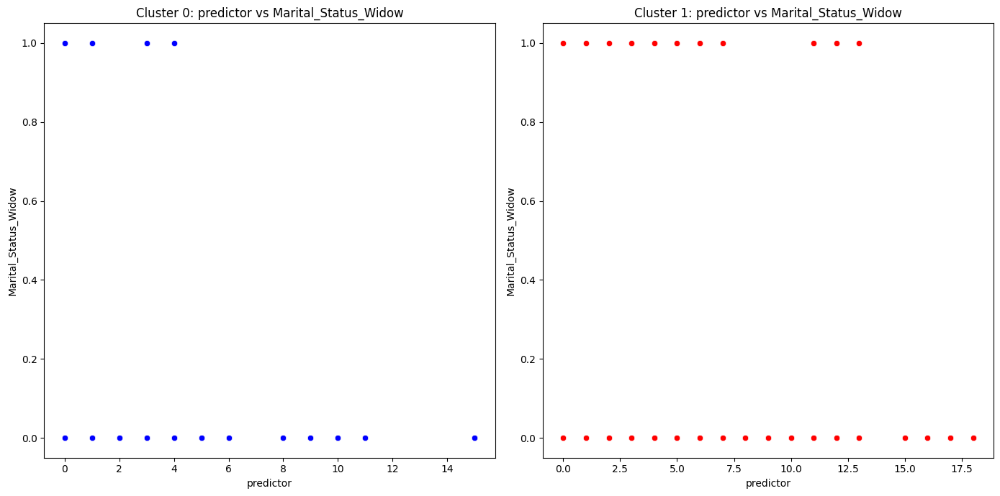

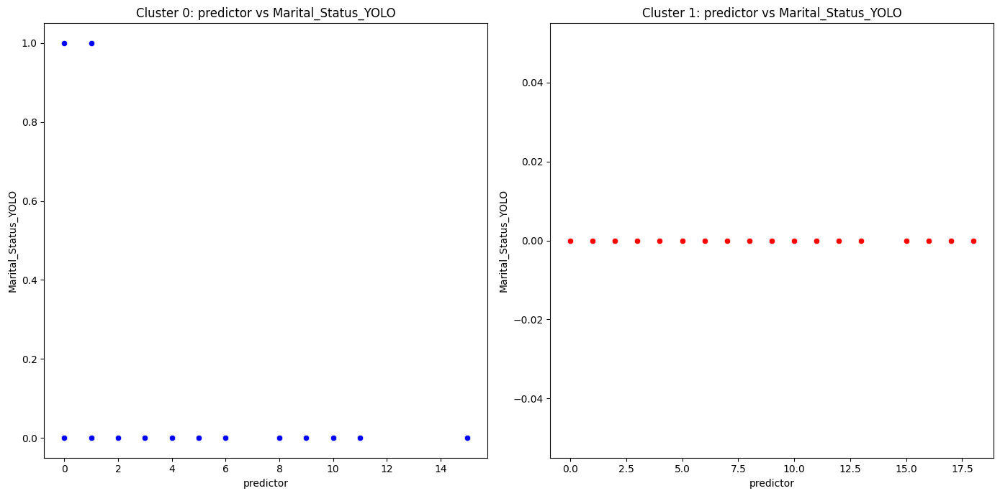

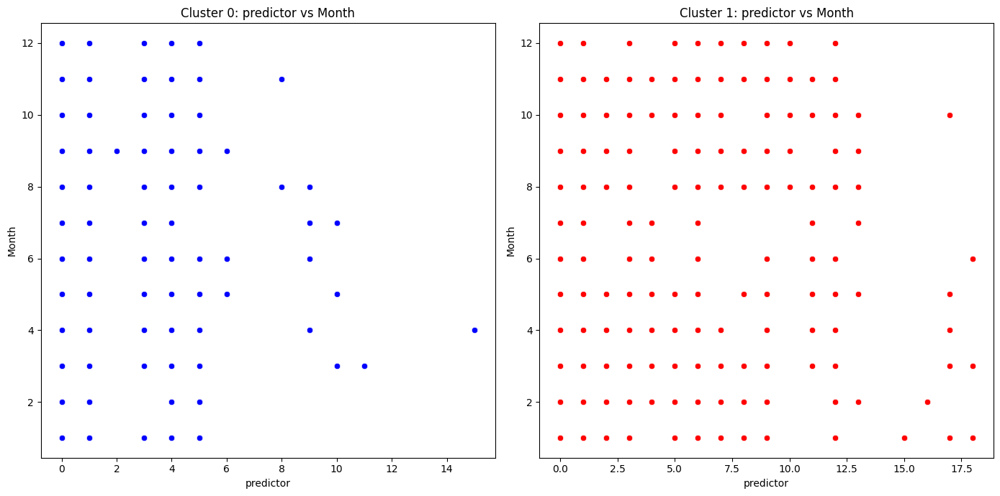

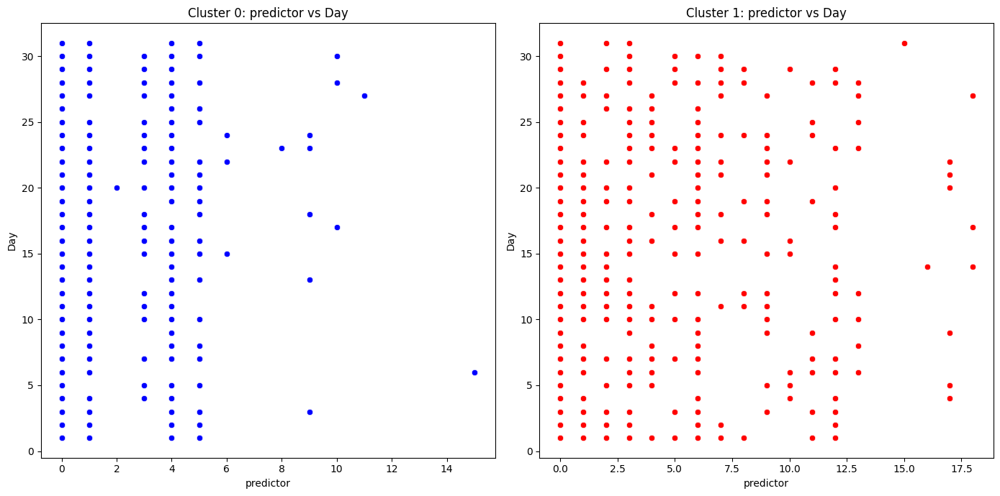

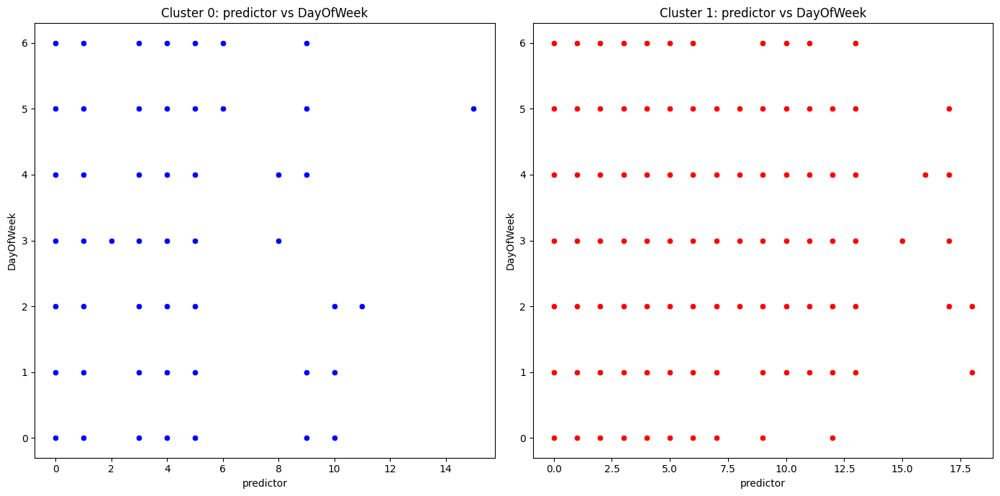

In [ ]:
import seaborn as sns

# Run K-Means with the optimal number of clusters
kmeans = KMeans(n_clusters=2, init='k-means++', max_iter=300, n_init=10, random_state=0)
pred_y = kmeans.fit_predict(data_ML)

# Add cluster labels to the original data
data_ML['Cluster'] = pred_y

# Split the data into two DataFrames based on the cluster labels
cluster_0 = data_ML[data_ML['Cluster'] == 0]
cluster_1 = data_ML[data_ML['Cluster'] == 1]

# Replace 'predictor' and 'other_variable' with your actual column names
for column in data_ML.columns:
    if column != 'Cluster' and column != 'predictor':
        plt.figure(figsize=(14, 7))

        # Plot for cluster 0
        plt.subplot(121)
        sns.scatterplot(x=cluster_0['predictor'], y=cluster_0[column], color='blue')
        plt.title(f'Cluster 0: predictor vs {column}')

        # Plot for cluster 1
        plt.subplot(122)
        sns.scatterplot(x=cluster_1['predictor'], y=cluster_1[column], color='red')
        plt.title(f'Cluster 1: predictor vs {column}')

        plt.tight_layout()
        plt.show()

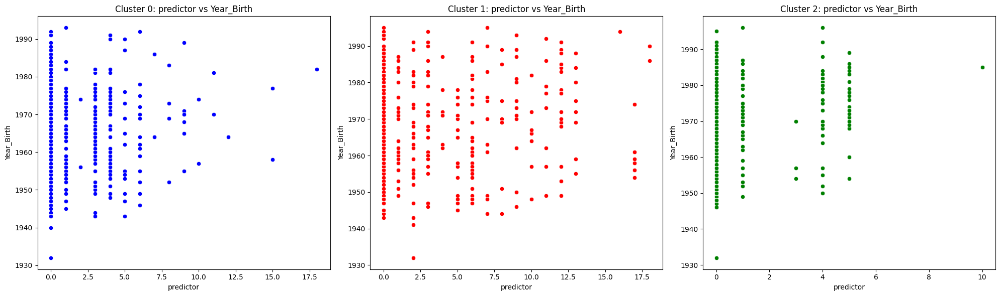

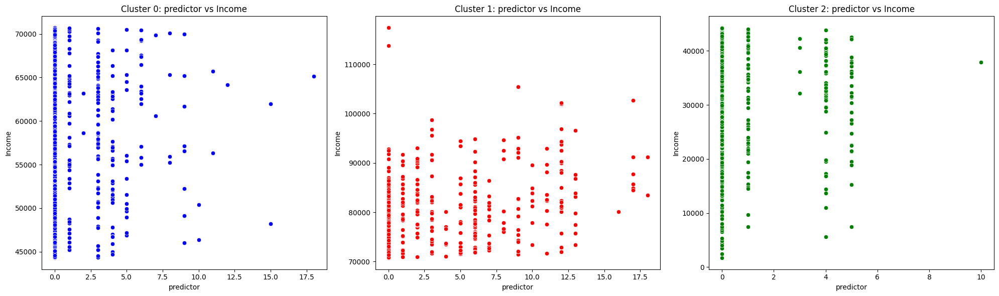

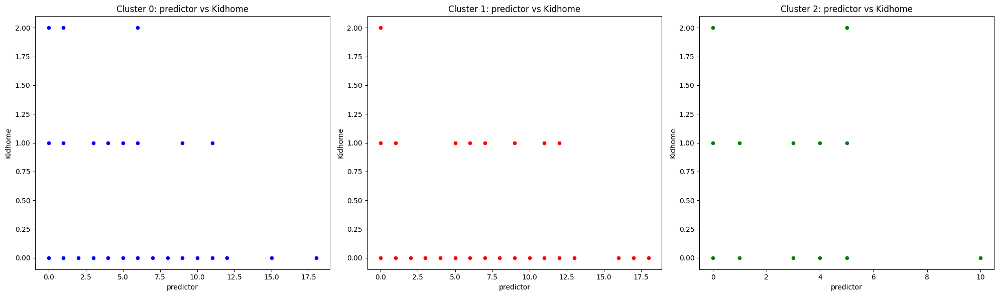

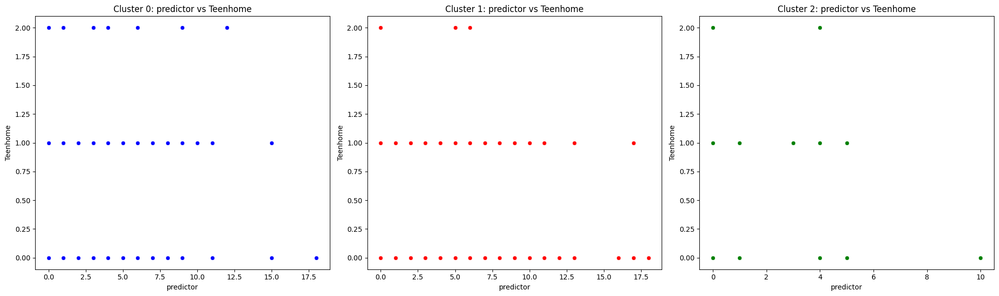

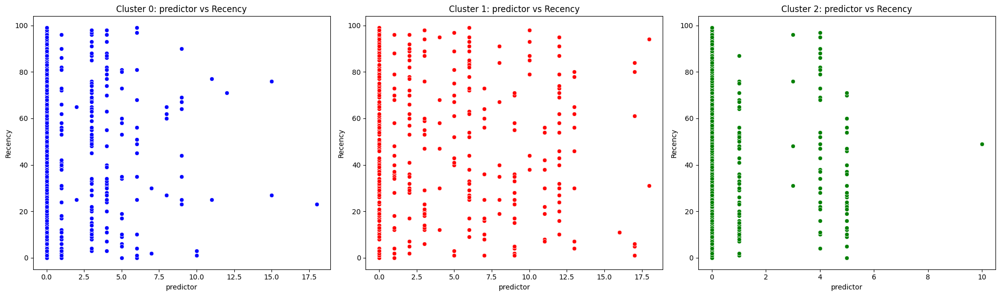

...

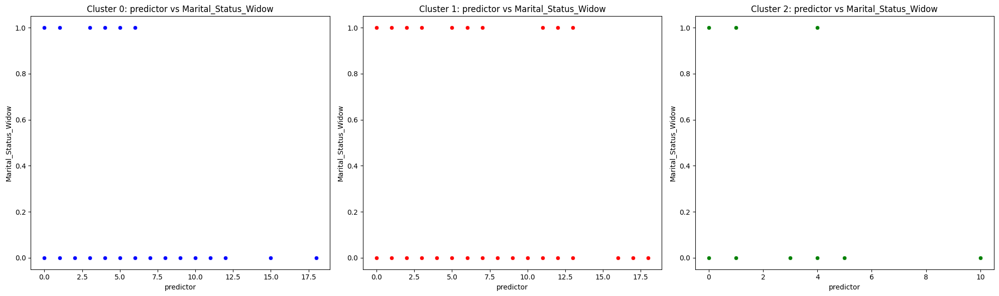

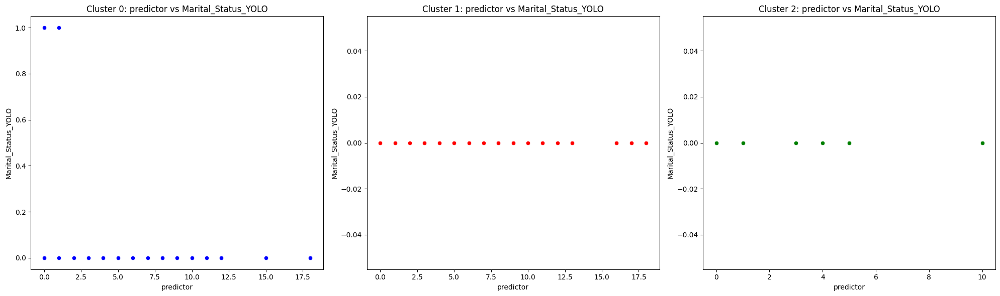

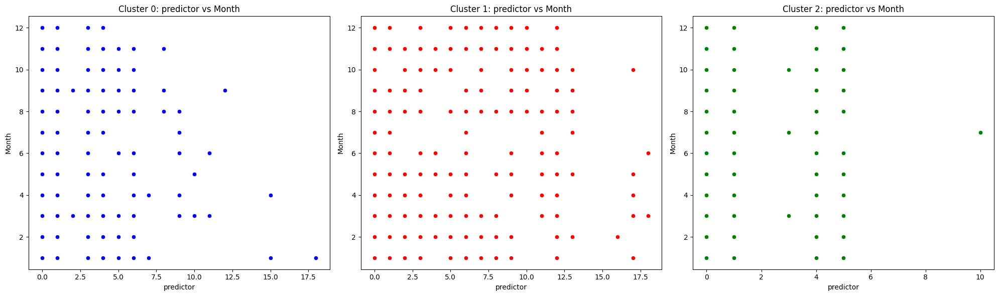

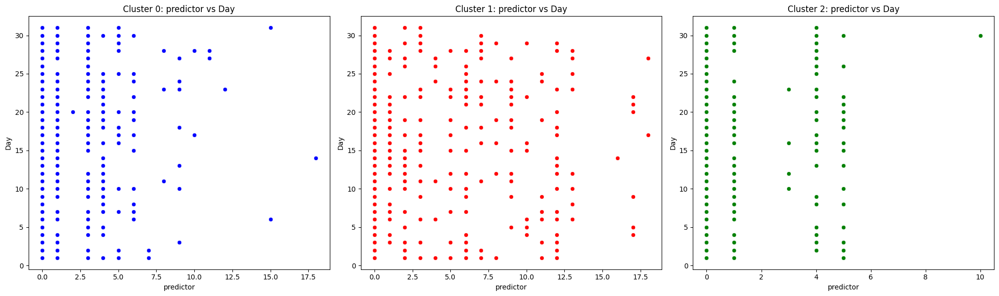

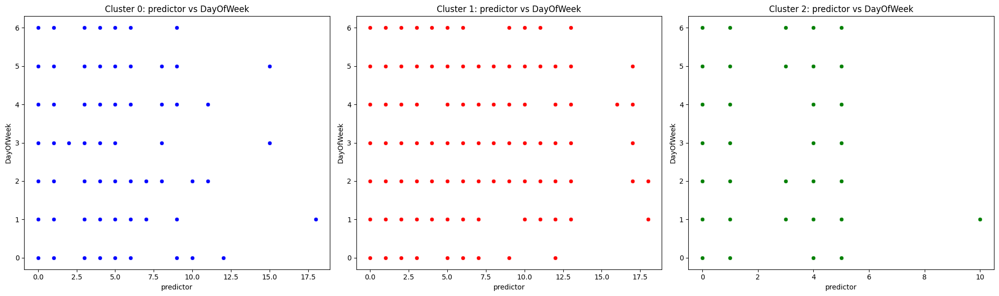

In [ ]:
# Run K-Means with 3 clusters
kmeans = KMeans(n_clusters=3, init='k-means++', max_iter=300, n_init=10, random_state=0)
pred_y = kmeans.fit_predict(data_ML)

# Add cluster labels to the original data
data_ML['Cluster'] = pred_y

# Split the data into three DataFrames based on the cluster labels
cluster_0 = data_ML[data_ML['Cluster'] == 0]
cluster_1 = data_ML[data_ML['Cluster'] == 1]
cluster_2 = data_ML[data_ML['Cluster'] == 2]

# Replace 'predictor' and 'other_variable' with your actual column names
for column in data_ML.columns:
    if column != 'Cluster' and column != 'predictor':
        plt.figure(figsize=(20, 6))

        # Plot for cluster 0
        plt.subplot(131)
        sns.scatterplot(x=cluster_0['predictor'], y=cluster_0[column], color='blue')
        plt.title(f'Cluster 0: predictor vs {column}')

        # Plot for cluster 1
        plt.subplot(132)
        sns.scatterplot(x=cluster_1['predictor'], y=cluster_1[column], color='red')
        plt.title(f'Cluster 1: predictor vs {column}')

        # Plot for cluster 2
        plt.subplot(133)
        sns.scatterplot(x=cluster_2['predictor'], y=cluster_2[column], color='green')
        plt.title(f'Cluster 2: predictor vs {column}')

        plt.tight_layout()
        plt.show()

# Random Forest Regressor

## Exploration (I want to try the model by feature engineering the education section)

In [ ]:
# Create a copy of original dataframe
train_data2 = train_data.copy()

# Create a dictionary mapping the old column names to the new ordinal values
education_mapping = {
    'Education_2n Cycle': 1,
    'Education_Basic': 0,
    'Education_Graduation': 2,
    'Education_Master': 3,
    'Education_PhD': 4
}

# Create a new column named 'Education_Level' in train_data2
train_data2.loc[:, 'Education_Level'] = train_data2[list(education_mapping.keys())].apply(lambda x: education_mapping[x.idxmax()], axis=1)

# Drop the old columns in train_data2
train_data2.drop(columns=list(education_mapping.keys()), inplace=True)

In [ ]:
# Create a copy of original dataframe
test_data2 = train_data.copy()

# Create a dictionary mapping the old column names to the new ordinal values
education_mapping = {
    'Education_2n Cycle': 1,
    'Education_Basic': 0,
    'Education_Graduation': 2,
    'Education_Master': 3,
    'Education_PhD': 4
}

# Create a new column named 'Education_Level' in train_data2
test_data2.loc[:, 'Education_Level'] = test_data2[list(education_mapping.keys())].apply(lambda x: education_mapping[x.idxmax()], axis=1)

# Drop the old columns in train_data2
test_data2.drop(columns=list(education_mapping.keys()), inplace=True)

Mean Squared Error (MSE): 0.16737501489459483
Root Mean Squared Error (RMSE): 0.4091149164899696
Mean Absolute Error (MAE): 0.20694736937196218
R-squared: 0.9947624014058186


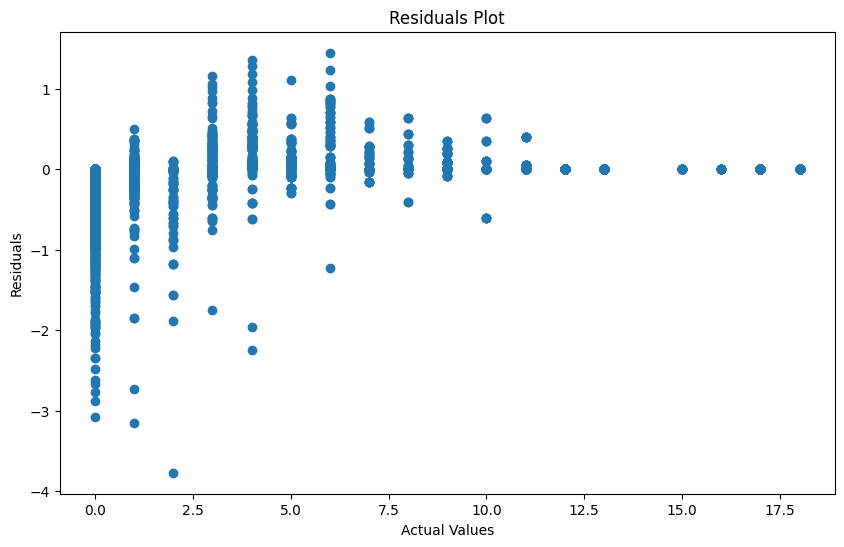


Feature Importances:
                    feature  importance
1                    Income    0.412340
5                  MntWines    0.251041
0                Year_Birth    0.033600
10             MntGoldProds    0.031940
13      NumCatalogPurchases    0.024225
8           MntFishProducts    0.024003
29                      Day    0.023039
4                   Recency    0.022994
9          MntSweetProducts    0.020192
15        NumWebVisitsMonth    0.018782
28                    Month    0.018341
27                     Year    0.018159
7           MntMeatProducts    0.016768
31          Education_Level    0.014146
14        NumStorePurchases    0.013926
6                 MntFruits    0.013665
12          NumWebPurchases    0.012056
30                DayOfWeek    0.007886
22   Marital_Status_Married    0.006115
11        NumDealsPurchases    0.006092
24  Marital_Status_Together    0.003044
23    Marital_Status_Single    0.001927
3                  Teenhome    0.001541
2                 

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import numpy as np
import matplotlib.pyplot as plt

# Define predictor and explanatory variables
X_train2 = train_data2.drop('predictor', axis=1)
y_train2 = train_data2['predictor']
X_test2 = test_data2.drop('predictor', axis=1)
y_test2 = test_data2['predictor']

# Initialize the RandomForestRegressor with default parameters
rf2 = RandomForestRegressor(random_state=42)

# Fit the model to the data
rf2.fit(X_train2, y_train2)

# Predict the target for the test data
y_pred2 = rf2.predict(X_test2)

# Evaluate the model
mse2 = mean_squared_error(y_test2, y_pred2)
mae2 = mean_absolute_error(y_test2, y_pred2)
rmse2 = np.sqrt(mse2)
r22 = r2_score(y_test2, y_pred2)

print(f"Mean Squared Error (MSE): {mse2}")
print(f"Root Mean Squared Error (RMSE): {rmse2}")
print(f"Mean Absolute Error (MAE): {mae2}")
print(f"R-squared: {r22}")

# Plot residuals
residuals2 = y_test2 - y_pred2
plt.figure(figsize=(10,6))
plt.scatter(y_test2, residuals2)
plt.title('Residuals Plot')
plt.xlabel('Actual Values')
plt.ylabel('Residuals')
plt.show()

# Get feature importances
importances2 = rf2.feature_importances_

# Create a DataFrame for visualization
importances_df2 = pd.DataFrame({'feature': X_train2.columns, 'importance': importances2})

# Sort the DataFrame by importance score
importances_df2 = importances_df2.sort_values('importance', ascending=False)

print("\nFeature Importances:")
print(importances_df2)

## using alternative data

Mean Squared Error (MSE): 1.0257884444681553
Root Mean Squared Error (RMSE): 1.0128121466827673
Mean Absolute Error (MAE): 0.5142323782356555
R-squared: 0.9685167277390752


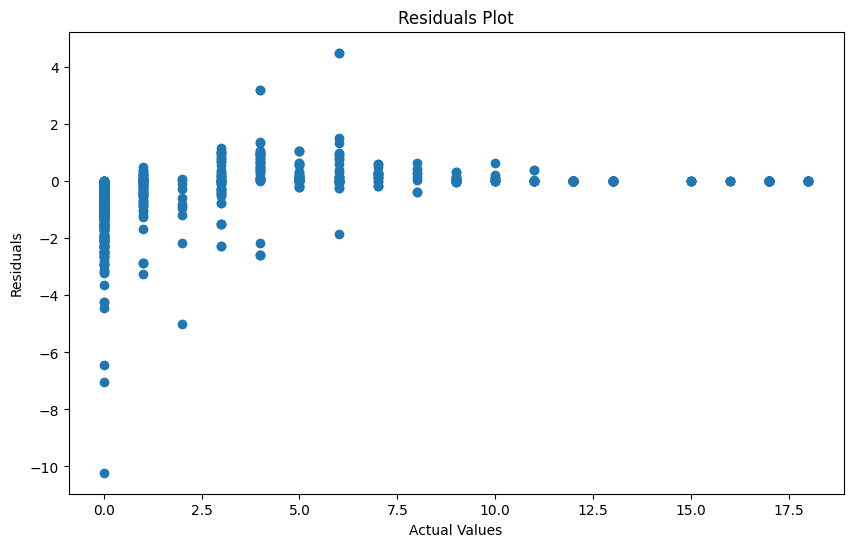


Feature Importances:
                    feature  importance
1                    Income    0.409675
5                  MntWines    0.251025
10             MntGoldProds    0.033421
0                Year_Birth    0.033374
8           MntFishProducts    0.026722
13      NumCatalogPurchases    0.025441
34                      Day    0.022208
4                   Recency    0.022191
15        NumWebVisitsMonth    0.019107
32                     Year    0.018301
9          MntSweetProducts    0.018145
33                    Month    0.018080
7           MntMeatProducts    0.016136
14        NumStorePurchases    0.013578
6                 MntFruits    0.012902
12          NumWebPurchases    0.011243
22         Education_Master    0.008488
21     Education_Graduation    0.007444
35                DayOfWeek    0.006995
11        NumDealsPurchases    0.006267
27   Marital_Status_Married    0.005845
29  Marital_Status_Together    0.003076
23            Education_PhD    0.001579
3                 

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import numpy as np
import matplotlib.pyplot as plt

# Define predictor and explanatory variables
X_train = train_data.drop('predictor', axis=1)
y_train = train_data['predictor']
X_test = test_data.drop('predictor', axis=1)
y_test = test_data['predictor']

# Initialize the RandomForestRegressor with default parameters
rf = RandomForestRegressor(random_state=42)

# Fit the model to the data
rf.fit(X_train, y_train)

# Predict the target for the test data
y_pred = rf.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"Mean Absolute Error (MAE): {mae}")
print(f"R-squared: {r2}")

# Plot residuals
residuals = y_test - y_pred
plt.figure(figsize=(10,6))
plt.scatter(y_test, residuals)
plt.title('Residuals Plot')
plt.xlabel('Actual Values')
plt.ylabel('Residuals')
plt.show()

# Get feature importances
importances = rf.feature_importances_

# Create a DataFrame for visualization
importances_df = pd.DataFrame({'feature': X_train.columns, 'importance': importances})

# Sort the DataFrame by importance score
importances_df = importances_df.sort_values('importance', ascending=False)

print("\nFeature Importances:")
print(importances_df)



---



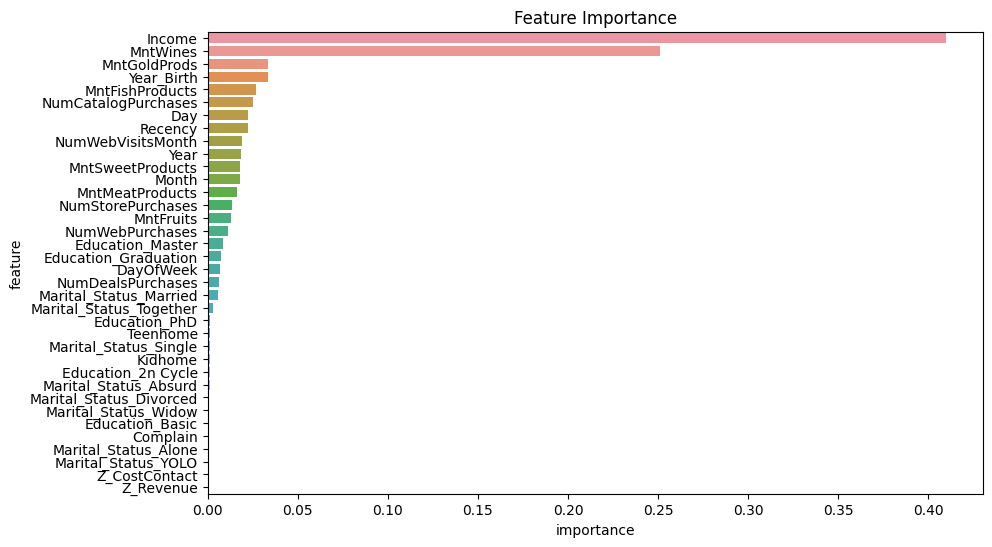

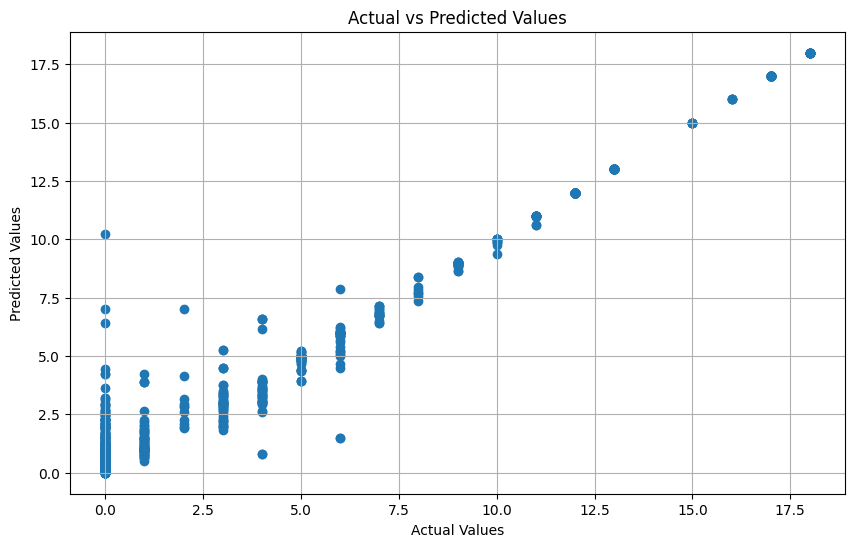

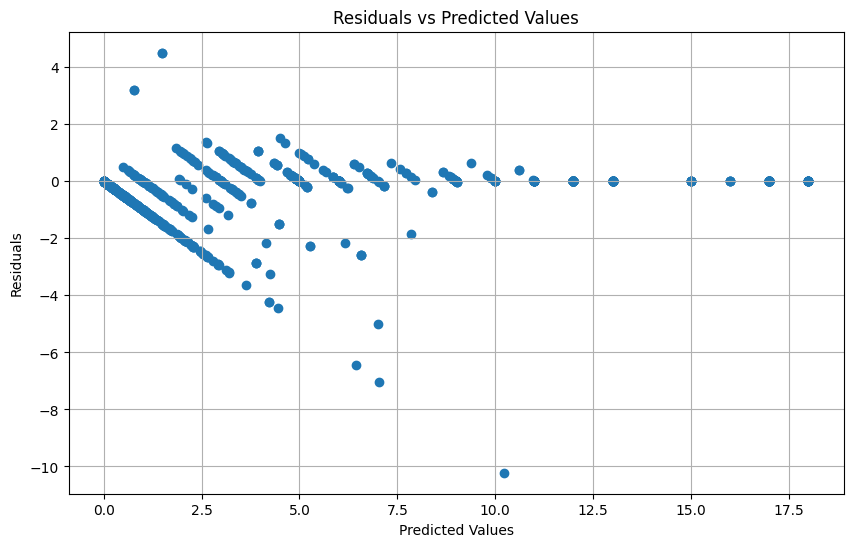

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Feature Importance Plot
plt.figure(figsize=(10,6))
sns.barplot(x='importance', y='feature', data=importances_df)
plt.title('Feature Importance')
plt.show()

# Predicted vs Actual Values Plot
plt.figure(figsize=(10,6))
plt.scatter(y_test, y_pred)
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Actual vs Predicted Values')
plt.grid(True)
plt.show()

# Residuals Plot
residuals = y_test - y_pred
plt.figure(figsize=(10,6))
plt.scatter(y_pred, residuals)
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.title('Residuals vs Predicted Values')
plt.grid(True)
plt.show()

      Actual  Predicted
ID                     
1012       0      0.800
7962       9      9.030
9701       0      1.150
2945       9      9.000
5868       0      0.050
...      ...        ...
1859       1      1.190
6941       0      1.135
5386      12     12.000
5031       3      4.390
6263       0      0.070

[884 rows x 2 columns]


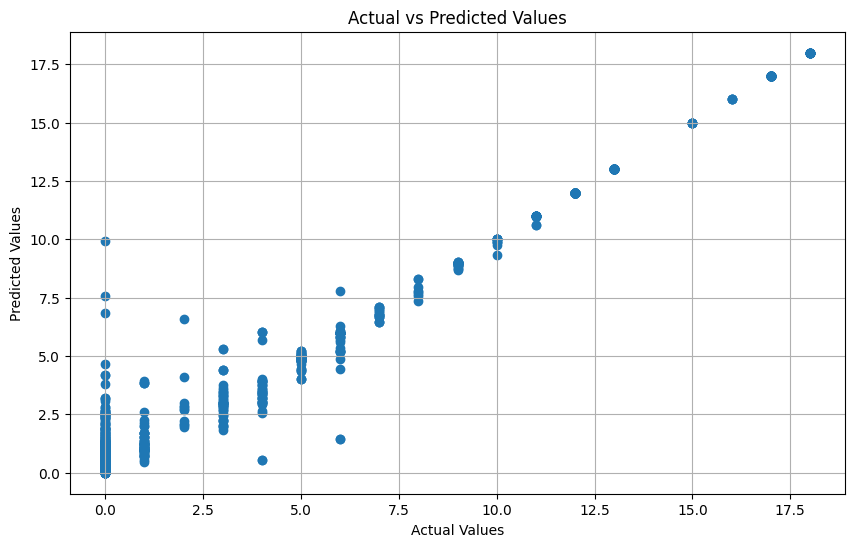

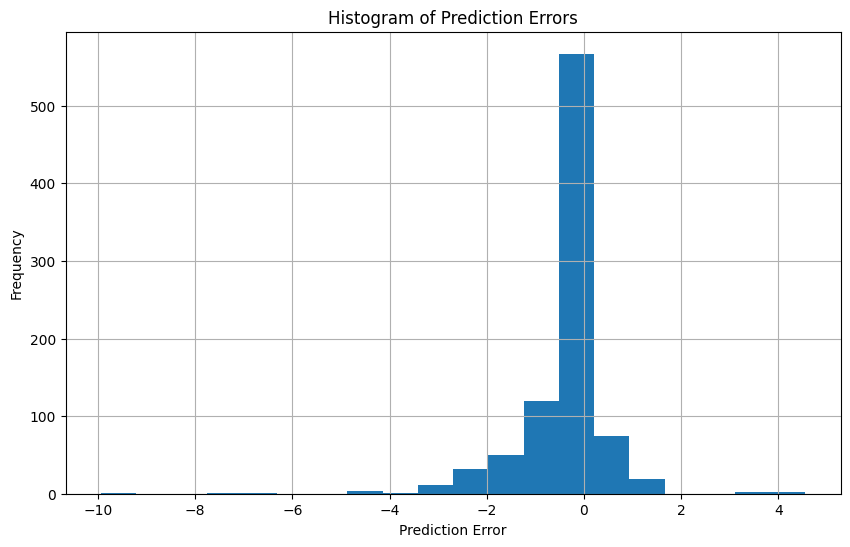

In [ ]:
# Define predictor and explanatory variables for test data
X_test_data = test_data.drop('predictor', axis=1)
y_test_data = test_data['predictor']

# Use the trained model to make predictions on the test_data
y_pred_test_data = rf.predict(X_test_data)

# Create a DataFrame to compare the actual and predicted values
comparison_df = pd.DataFrame({'Actual': y_test_data, 'Predicted': y_pred_test_data})

print(comparison_df)

# Scatter plot of Actual vs Predicted values
plt.figure(figsize=(10,6))
plt.scatter(y_test_data, y_pred_test_data)
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Actual vs Predicted Values')
plt.grid(True)
plt.show()

# Histogram of the prediction errors
errors = y_test_data - y_pred_test_data
plt.figure(figsize=(10,6))
plt.hist(errors, bins=20)
plt.xlabel('Prediction Error')
plt.ylabel('Frequency')
plt.title('Histogram of Prediction Errors')
plt.grid(True)
plt.show()

# Polynomial Regression

In [ ]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import make_pipeline

# Define predictor and explanatory variables for train and test data
X_train = train_data.drop('predictor', axis=1)
y_train = train_data['predictor']
X_test = test_data.drop('predictor', axis=1)
y_test = test_data['predictor']

# Define the degree of the polynomial you want to fit
# Start with a low number like 2 and increase if necessary
degree = 2

# Create a pipeline that first creates polynomial features and then fits a linear regression model
model = make_pipeline(PolynomialFeatures(degree), LinearRegression())

# Train the model
model.fit(X_train, y_train)

# Make predictions
y_pred = model.predict(X_test)

# Print the R-squared score
print("R-squared score: ", model.score(X_test, y_test))

R-squared score:  0.8033855430202141


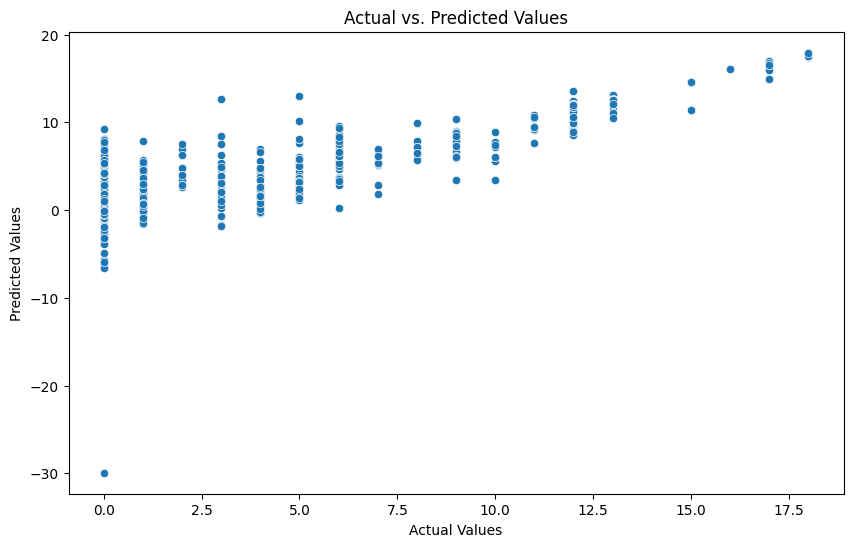

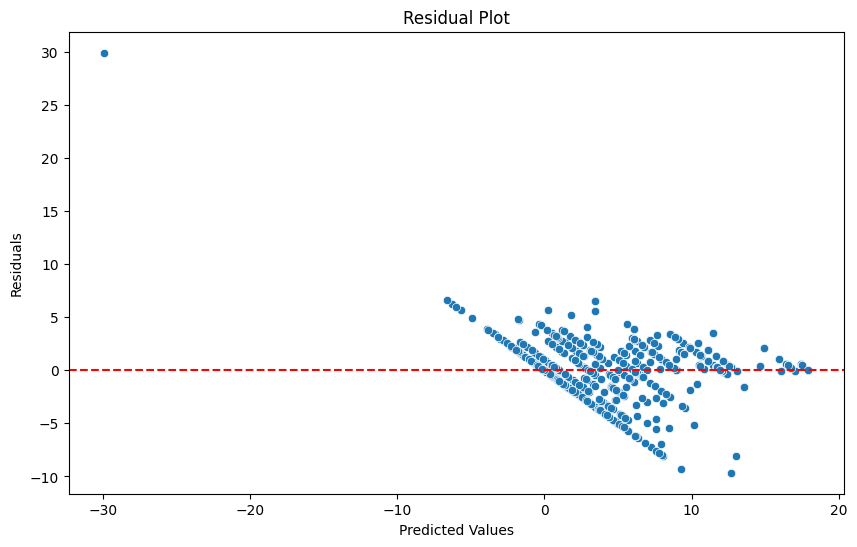

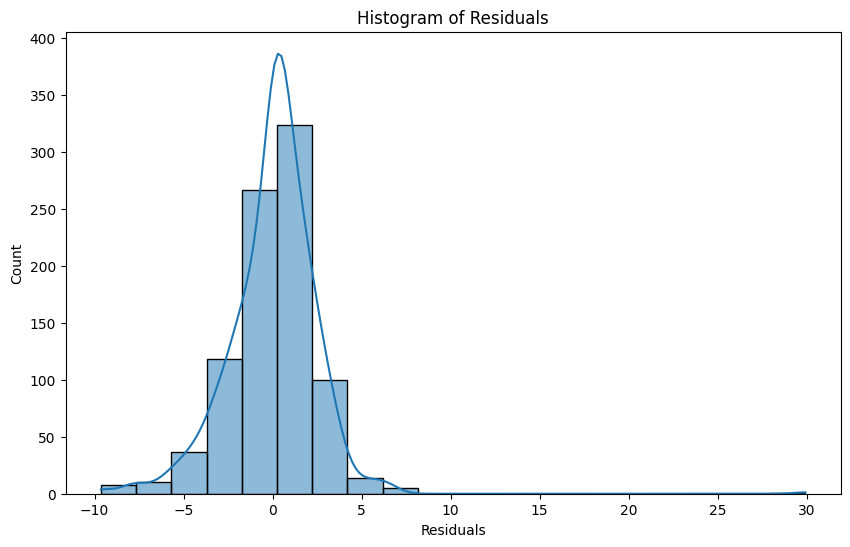

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Scatter plot of actual vs. predicted values
plt.figure(figsize=(10, 6))
sns.scatterplot(x=y_test, y=y_pred)
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Actual vs. Predicted Values')
plt.show()

# Residual plot
residuals = y_test - y_pred
plt.figure(figsize=(10, 6))
sns.scatterplot(x=y_pred, y=residuals)
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.title('Residual Plot')
plt.show()

# Histogram of residuals
plt.figure(figsize=(10, 6))
sns.histplot(residuals, bins=20, kde=True)
plt.xlabel('Residuals')
plt.title('Histogram of Residuals')
plt.show()

In [ ]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
import statsmodels.api as sm

# Create polynomial features
poly_features = PolynomialFeatures(degree=2)
X_train_poly = poly_features.fit_transform(X_train)

# Fit the model using sklearn
model_sklearn = LinearRegression()
model_sklearn.fit(X_train_poly, y_train)

# Add a constant for statsmodels
X_train_poly_sm = sm.add_constant(X_train_poly)

# Fit the model using statsmodels
model_sm = sm.OLS(y_train, X_train_poly_sm)
results = model_sm.fit()

# Print out the statistics
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:              predictor   R-squared:                       0.868
Model:                            OLS   Adj. R-squared:                  0.850
Method:                 Least Squares   F-statistic:                     47.09
Date:                Fri, 21 Jul 2023   Prob (F-statistic):               0.00
Time:                        03:31:08   Log-Likelihood:                -7552.3
No. Observations:                3532   AIC:                         1.597e+04
Df Residuals:                    3098   BIC:                         1.865e+04
Df Model:                         433                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         37.6420     44.740      0.841      0.4

# Simple Linear Regression

Results for column 'Year_Birth':
                            OLS Regression Results                            
Dep. Variable:             Year_Birth   R-squared:                       0.004
Model:                            OLS   Adj. R-squared:                  0.004
Method:                 Least Squares   F-statistic:                     14.32
Date:                Fri, 21 Jul 2023   Prob (F-statistic):           0.000157
Time:                        03:31:08   Log-Likelihood:                -13863.
No. Observations:                3532   AIC:                         2.773e+04
Df Residuals:                    3530   BIC:                         2.774e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       1968.33

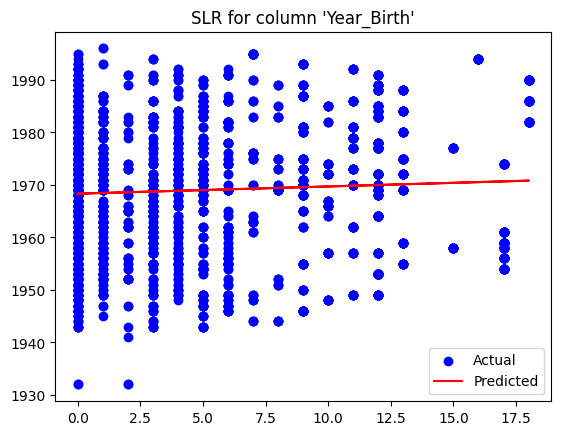

Results for column 'Income':
                            OLS Regression Results                            
Dep. Variable:                 Income   R-squared:                       0.359
Model:                            OLS   Adj. R-squared:                  0.359
Method:                 Least Squares   F-statistic:                     1975.
Date:                Fri, 21 Jul 2023   Prob (F-statistic):               0.00
Time:                        03:31:08   Log-Likelihood:                -39675.
No. Observations:                3532   AIC:                         7.935e+04
Df Residuals:                    3530   BIC:                         7.937e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       4.941e+04  

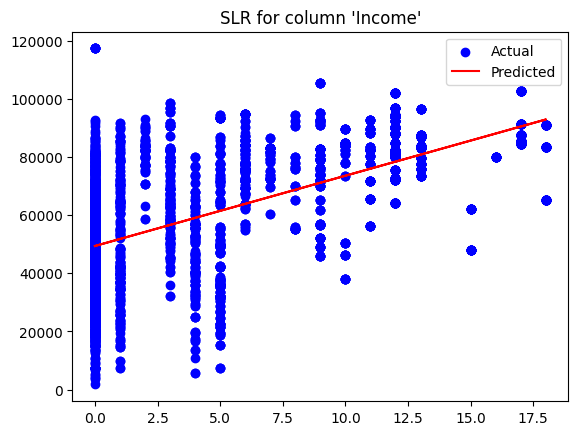

Results for column 'Kidhome':
                            OLS Regression Results                            
Dep. Variable:                Kidhome   R-squared:                       0.137
Model:                            OLS   Adj. R-squared:                  0.137
Method:                 Least Squares   F-statistic:                     561.0
Date:                Fri, 21 Jul 2023   Prob (F-statistic):          3.14e-115
Time:                        03:31:09   Log-Likelihood:                -2463.0
No. Observations:                3532   AIC:                             4930.
Df Residuals:                    3530   BIC:                             4942.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.5129 

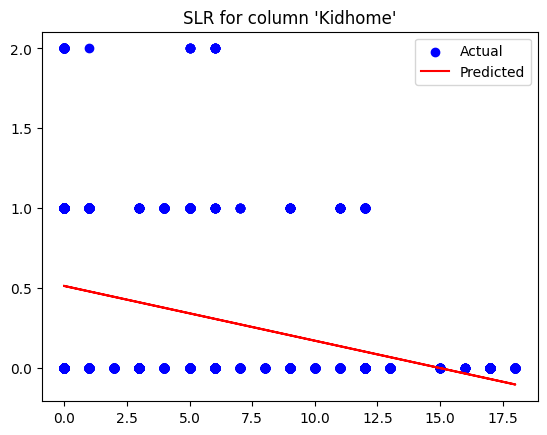

Results for column 'Teenhome':
                            OLS Regression Results                            
Dep. Variable:               Teenhome   R-squared:                       0.062
Model:                            OLS   Adj. R-squared:                  0.062
Method:                 Least Squares   F-statistic:                     233.1
Date:                Fri, 21 Jul 2023   Prob (F-statistic):           5.26e-51
Time:                        03:31:09   Log-Likelihood:                -2893.0
No. Observations:                3532   AIC:                             5790.
Df Residuals:                    3530   BIC:                             5802.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.5467

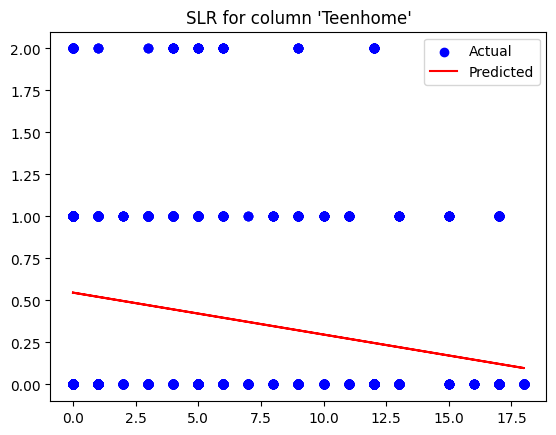

Results for column 'Recency':
                            OLS Regression Results                            
Dep. Variable:                Recency   R-squared:                       0.002
Model:                            OLS   Adj. R-squared:                  0.002
Method:                 Least Squares   F-statistic:                     7.937
Date:                Fri, 21 Jul 2023   Prob (F-statistic):            0.00487
Time:                        03:31:09   Log-Likelihood:                -16916.
No. Observations:                3532   AIC:                         3.384e+04
Df Residuals:                    3530   BIC:                         3.385e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         48.6084 

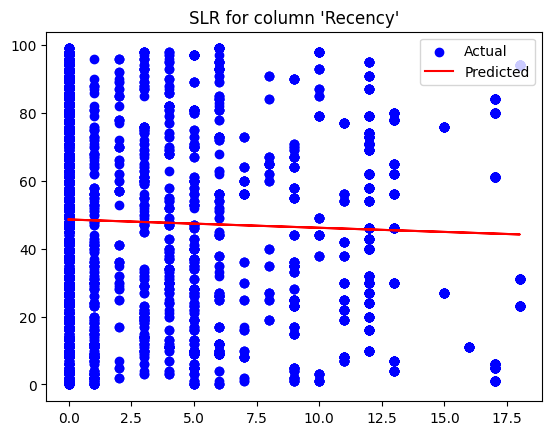

Results for column 'MntWines':
                            OLS Regression Results                            
Dep. Variable:               MntWines   R-squared:                       0.361
Model:                            OLS   Adj. R-squared:                  0.361
Method:                 Least Squares   F-statistic:                     1992.
Date:                Fri, 21 Jul 2023   Prob (F-statistic):               0.00
Time:                        03:31:10   Log-Likelihood:                -25609.
No. Observations:                3532   AIC:                         5.122e+04
Df Residuals:                    3530   BIC:                         5.123e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        270.3945

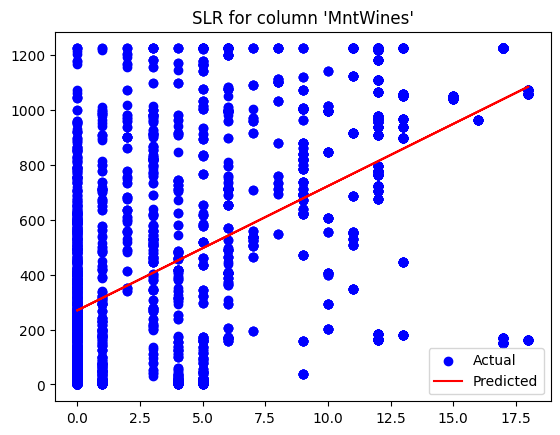

Results for column 'MntFruits':
                            OLS Regression Results                            
Dep. Variable:              MntFruits   R-squared:                       0.056
Model:                            OLS   Adj. R-squared:                  0.056
Method:                 Least Squares   F-statistic:                     209.9
Date:                Fri, 21 Jul 2023   Prob (F-statistic):           2.94e-46
Time:                        03:31:10   Log-Likelihood:                -16704.
No. Observations:                3532   AIC:                         3.341e+04
Df Residuals:                    3530   BIC:                         3.342e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         20.870

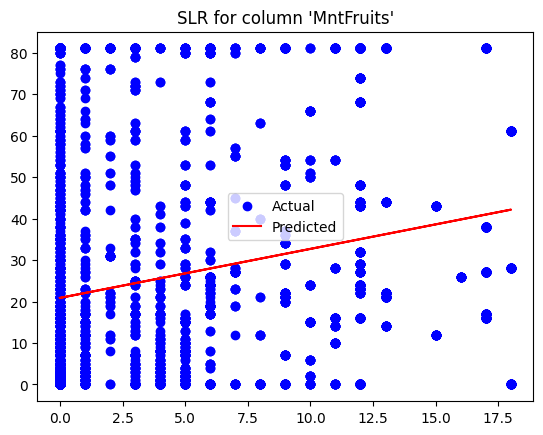

Results for column 'MntMeatProducts':
                            OLS Regression Results                            
Dep. Variable:        MntMeatProducts   R-squared:                       0.189
Model:                            OLS   Adj. R-squared:                  0.189
Method:                 Least Squares   F-statistic:                     823.9
Date:                Fri, 21 Jul 2023   Prob (F-statistic):          4.98e-163
Time:                        03:31:11   Log-Likelihood:                -5155.8
No. Observations:                3532   AIC:                         1.032e+04
Df Residuals:                    3530   BIC:                         1.033e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         

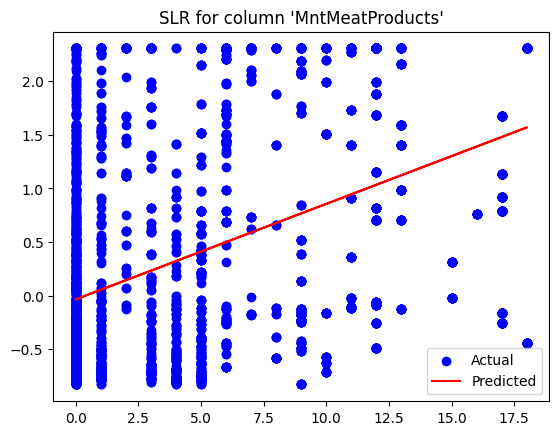

Results for column 'MntFishProducts':
                            OLS Regression Results                            
Dep. Variable:        MntFishProducts   R-squared:                       0.075
Model:                            OLS   Adj. R-squared:                  0.075
Method:                 Least Squares   F-statistic:                     287.7
Date:                Fri, 21 Jul 2023   Prob (F-statistic):           4.19e-62
Time:                        03:31:11   Log-Likelihood:                -5158.5
No. Observations:                3532   AIC:                         1.032e+04
Df Residuals:                    3530   BIC:                         1.033e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         

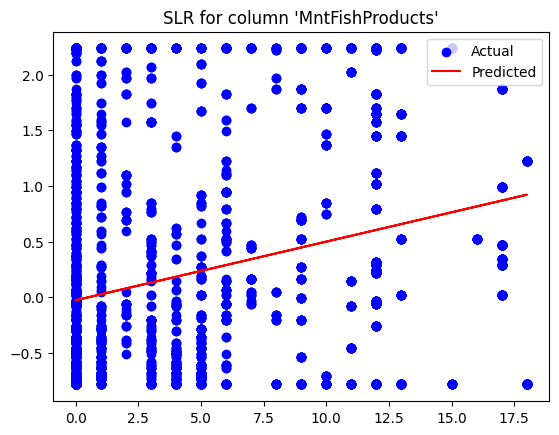

Results for column 'MntSweetProducts':
                            OLS Regression Results                            
Dep. Variable:       MntSweetProducts   R-squared:                       0.124
Model:                            OLS   Adj. R-squared:                  0.123
Method:                 Least Squares   F-statistic:                     498.2
Date:                Fri, 21 Jul 2023   Prob (F-statistic):          2.43e-103
Time:                        03:31:12   Log-Likelihood:                -5128.7
No. Observations:                3532   AIC:                         1.026e+04
Df Residuals:                    3530   BIC:                         1.027e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        

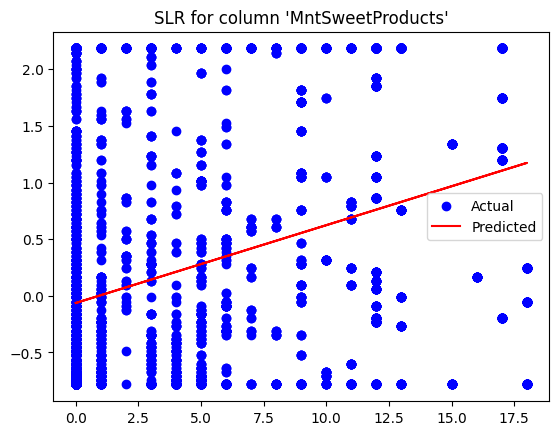

Results for column 'MntGoldProds':
                            OLS Regression Results                            
Dep. Variable:           MntGoldProds   R-squared:                       0.084
Model:                            OLS   Adj. R-squared:                  0.084
Method:                 Least Squares   F-statistic:                     324.9
Date:                Fri, 21 Jul 2023   Prob (F-statistic):           1.51e-69
Time:                        03:31:12   Log-Likelihood:                -5108.9
No. Observations:                3532   AIC:                         1.022e+04
Df Residuals:                    3530   BIC:                         1.023e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.

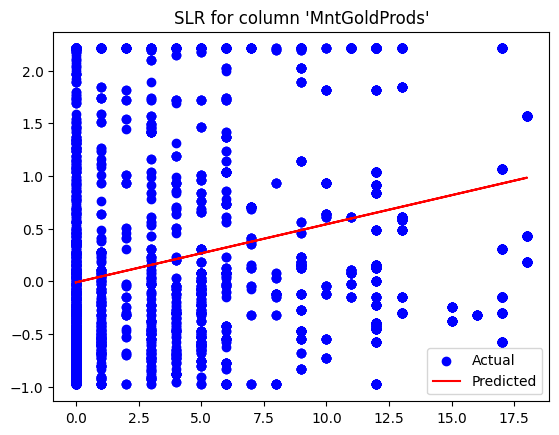

Results for column 'NumDealsPurchases':
                            OLS Regression Results                            
Dep. Variable:      NumDealsPurchases   R-squared:                       0.104
Model:                            OLS   Adj. R-squared:                  0.103
Method:                 Least Squares   F-statistic:                     408.2
Date:                Fri, 21 Jul 2023   Prob (F-statistic):           5.61e-86
Time:                        03:31:12   Log-Likelihood:                -6388.4
No. Observations:                3532   AIC:                         1.278e+04
Df Residuals:                    3530   BIC:                         1.279e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       

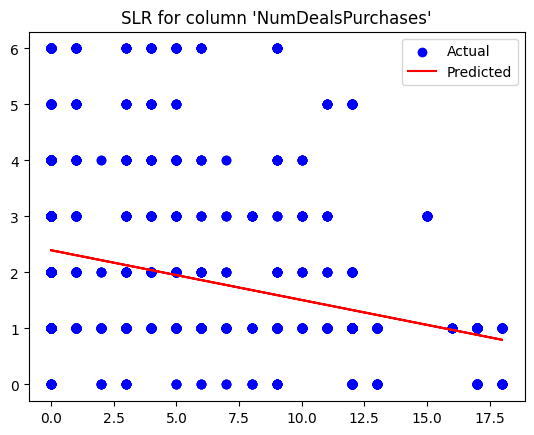

Results for column 'NumWebPurchases':
                            OLS Regression Results                            
Dep. Variable:        NumWebPurchases   R-squared:                       0.063
Model:                            OLS   Adj. R-squared:                  0.062
Method:                 Least Squares   F-statistic:                     236.1
Date:                Fri, 21 Jul 2023   Prob (F-statistic):           1.24e-51
Time:                        03:31:13   Log-Likelihood:                -8315.4
No. Observations:                3532   AIC:                         1.663e+04
Df Residuals:                    3530   BIC:                         1.665e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         

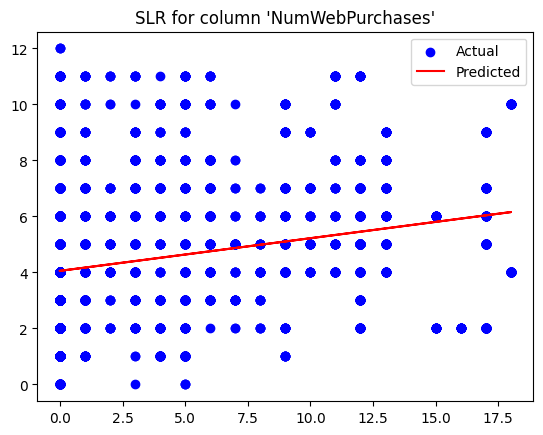

Results for column 'NumCatalogPurchases':
                             OLS Regression Results                            
Dep. Variable:     NumCatalogPurchases   R-squared:                       0.317
Model:                             OLS   Adj. R-squared:                  0.317
Method:                  Least Squares   F-statistic:                     1638.
Date:                 Fri, 21 Jul 2023   Prob (F-statistic):          1.77e-294
Time:                         03:31:13   Log-Likelihood:                -8358.9
No. Observations:                 3532   AIC:                         1.672e+04
Df Residuals:                     3530   BIC:                         1.673e+04
Df Model:                            1                                         
Covariance Type:             nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------


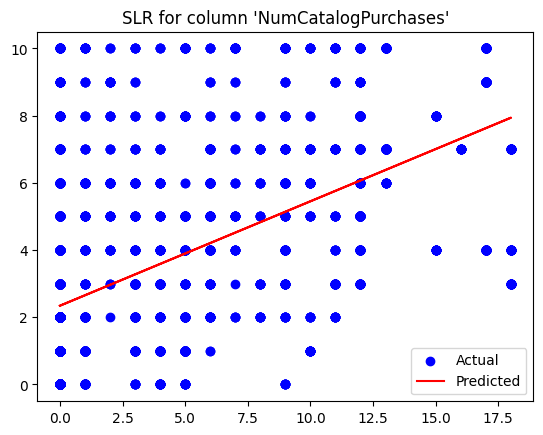

Results for column 'NumStorePurchases':
                            OLS Regression Results                            
Dep. Variable:      NumStorePurchases   R-squared:                       0.098
Model:                            OLS   Adj. R-squared:                  0.098
Method:                 Least Squares   F-statistic:                     382.6
Date:                Fri, 21 Jul 2023   Prob (F-statistic):           5.59e-81
Time:                        03:31:13   Log-Likelihood:                -9004.9
No. Observations:                3532   AIC:                         1.801e+04
Df Residuals:                    3530   BIC:                         1.803e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       

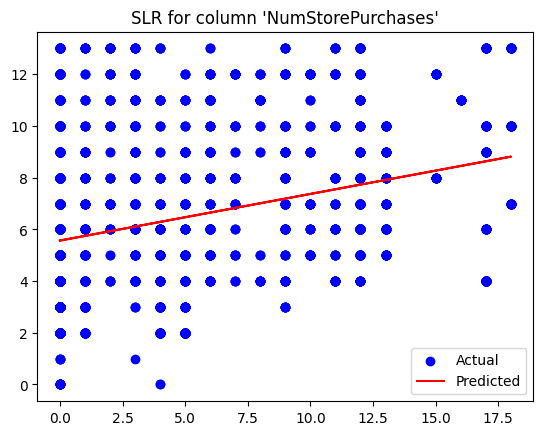

Results for column 'NumWebVisitsMonth':
                            OLS Regression Results                            
Dep. Variable:      NumWebVisitsMonth   R-squared:                       0.087
Model:                            OLS   Adj. R-squared:                  0.086
Method:                 Least Squares   F-statistic:                     334.4
Date:                Fri, 21 Jul 2023   Prob (F-statistic):           1.95e-71
Time:                        03:31:14   Log-Likelihood:                -7965.0
No. Observations:                3532   AIC:                         1.593e+04
Df Residuals:                    3530   BIC:                         1.595e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       

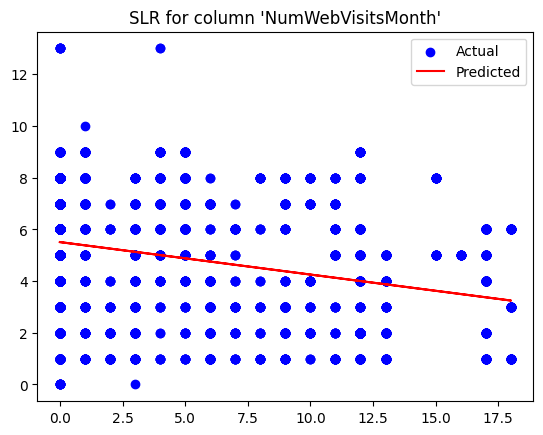

Results for column 'Complain':
                            OLS Regression Results                            
Dep. Variable:               Complain   R-squared:                       0.002
Model:                            OLS   Adj. R-squared:                  0.002
Method:                 Least Squares   F-statistic:                     8.230
Date:                Fri, 21 Jul 2023   Prob (F-statistic):            0.00415
Time:                        03:31:14   Log-Likelihood:                 2536.5
No. Observations:                3532   AIC:                            -5069.
Df Residuals:                    3530   BIC:                            -5057.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0191

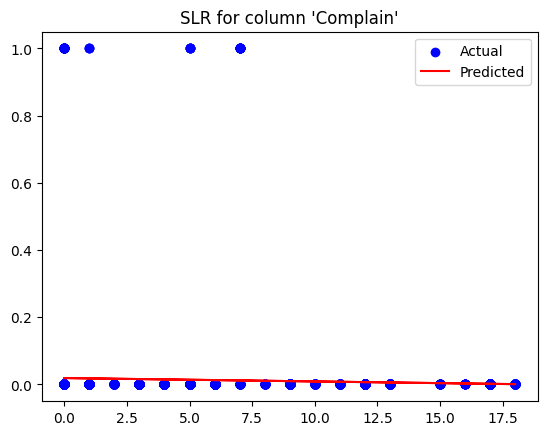

Results for column 'Z_CostContact':
                            OLS Regression Results                            
Dep. Variable:          Z_CostContact   R-squared:                        -inf
Model:                            OLS   Adj. R-squared:                   -inf
Method:                 Least Squares   F-statistic:                    -3530.
Date:                Fri, 21 Jul 2023   Prob (F-statistic):               1.00
Time:                        03:31:14   Log-Likelihood:             1.0767e+05
No. Observations:                3532   AIC:                        -2.153e+05
Df Residuals:                    3530   BIC:                        -2.153e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          3

/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear_model.py:1752: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.ssr/self.centered_tss


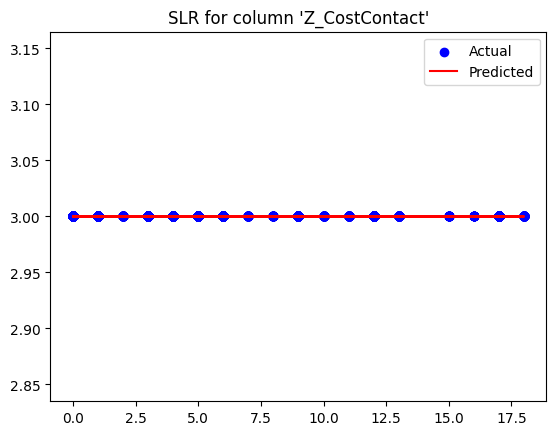

Results for column 'Z_Revenue':
                            OLS Regression Results                            
Dep. Variable:              Z_Revenue   R-squared:                        -inf
Model:                            OLS   Adj. R-squared:                   -inf
Method:                 Least Squares   F-statistic:                    -3530.
Date:                Fri, 21 Jul 2023   Prob (F-statistic):               1.00
Time:                        03:31:15   Log-Likelihood:             1.0437e+05
No. Observations:                3532   AIC:                        -2.087e+05
Df Residuals:                    3530   BIC:                        -2.087e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         11.000

/usr/local/lib/python3.10/dist-packages/statsmodels/stats/stattools.py:125: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  skew = stats.skew(resids, axis=axis)
/usr/local/lib/python3.10/dist-packages/statsmodels/stats/stattools.py:126: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurtosis = 3 + stats.kurtosis(resids, axis=axis)
/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:1633: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  b2 = skew(a, axis)
/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:1738: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic 

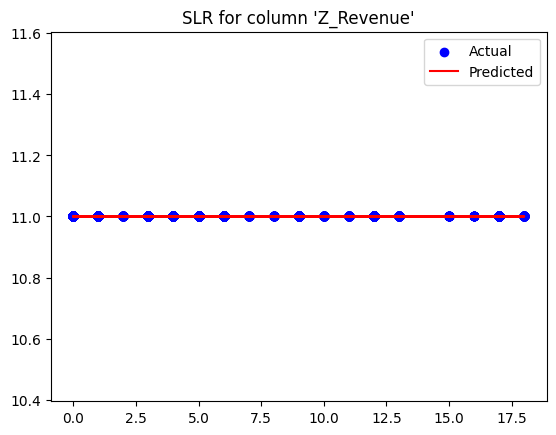

Results for column 'Year':
                            OLS Regression Results                            
Dep. Variable:                   Year   R-squared:                       0.005
Model:                            OLS   Adj. R-squared:                  0.004
Method:                 Least Squares   F-statistic:                     16.95
Date:                Fri, 21 Jul 2023   Prob (F-statistic):           3.92e-05
Time:                        03:31:15   Log-Likelihood:                -3647.0
No. Observations:                3532   AIC:                             7298.
Df Residuals:                    3530   BIC:                             7310.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       2012.9688    

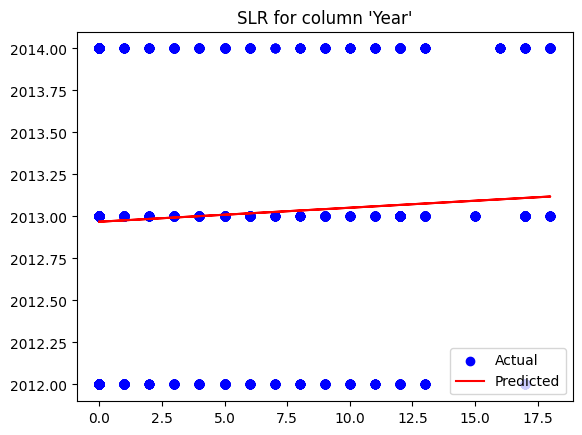

Results for column 'Education_2n Cycle':
                            OLS Regression Results                            
Dep. Variable:     Education_2n Cycle   R-squared:                       0.002
Model:                            OLS   Adj. R-squared:                  0.002
Method:                 Least Squares   F-statistic:                     7.972
Date:                Fri, 21 Jul 2023   Prob (F-statistic):            0.00478
Time:                        03:31:15   Log-Likelihood:                -441.87
No. Observations:                3532   AIC:                             887.7
Df Residuals:                    3530   BIC:                             900.1
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const      

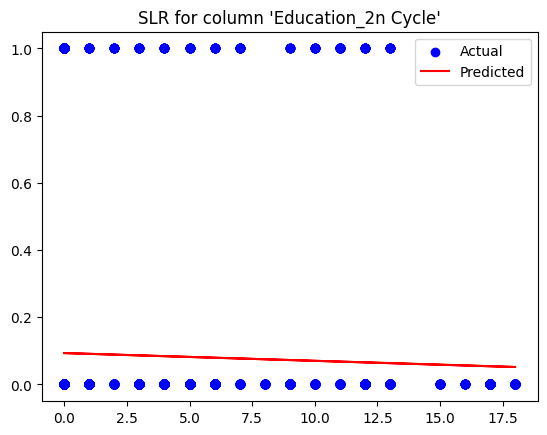

Results for column 'Education_Basic':
                            OLS Regression Results                            
Dep. Variable:        Education_Basic   R-squared:                       0.007
Model:                            OLS   Adj. R-squared:                  0.007
Method:                 Least Squares   F-statistic:                     25.51
Date:                Fri, 21 Jul 2023   Prob (F-statistic):           4.62e-07
Time:                        03:31:16   Log-Likelihood:                 2580.3
No. Observations:                3532   AIC:                            -5157.
Df Residuals:                    3530   BIC:                            -5144.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         

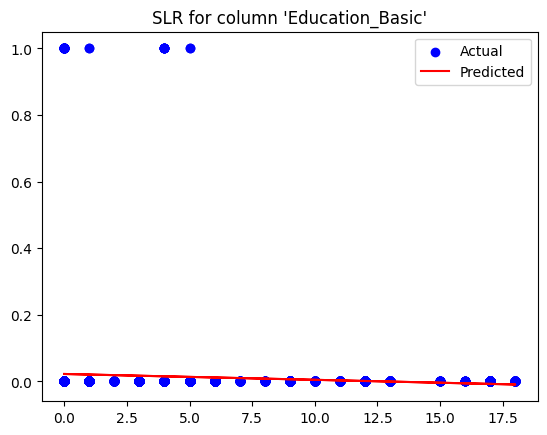

Results for column 'Education_Graduation':
                             OLS Regression Results                             
Dep. Variable:     Education_Graduation   R-squared:                       0.006
Model:                              OLS   Adj. R-squared:                  0.005
Method:                   Least Squares   F-statistic:                     20.43
Date:                  Fri, 21 Jul 2023   Prob (F-statistic):           6.38e-06
Time:                          03:31:16   Log-Likelihood:                -2552.9
No. Observations:                  3532   AIC:                             5110.
Df Residuals:                      3530   BIC:                             5122.
Df Model:                             1                                         
Covariance Type:              nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------

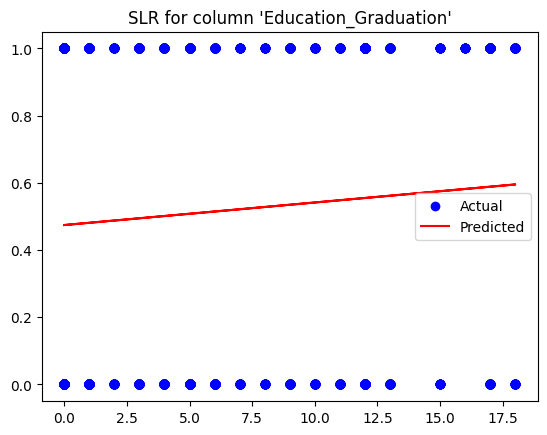

Results for column 'Education_Master':
                            OLS Regression Results                            
Dep. Variable:       Education_Master   R-squared:                       0.004
Model:                            OLS   Adj. R-squared:                  0.003
Method:                 Least Squares   F-statistic:                     13.10
Date:                Fri, 21 Jul 2023   Prob (F-statistic):           0.000299
Time:                        03:31:17   Log-Likelihood:                -1442.7
No. Observations:                3532   AIC:                             2889.
Df Residuals:                    3530   BIC:                             2902.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        

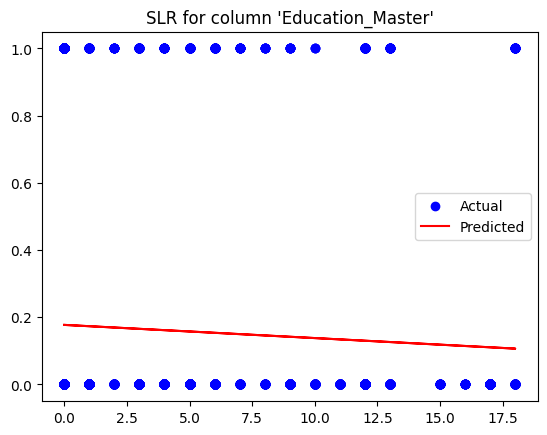

Results for column 'Education_PhD':
                            OLS Regression Results                            
Dep. Variable:          Education_PhD   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                     1.006
Date:                Fri, 21 Jul 2023   Prob (F-statistic):              0.316
Time:                        03:31:17   Log-Likelihood:                -1998.1
No. Observations:                3532   AIC:                             4000.
Df Residuals:                    3530   BIC:                             4013.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0

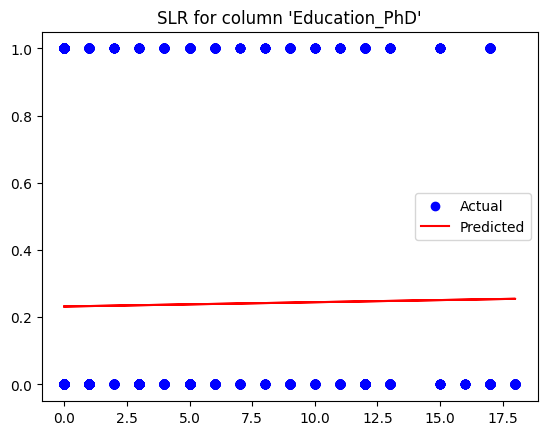

Results for column 'Marital_Status_Absurd':
                              OLS Regression Results                             
Dep. Variable:     Marital_Status_Absurd   R-squared:                       0.001
Model:                               OLS   Adj. R-squared:                  0.000
Method:                    Least Squares   F-statistic:                     2.169
Date:                   Fri, 21 Jul 2023   Prob (F-statistic):              0.141
Time:                           03:31:18   Log-Likelihood:                 5748.7
No. Observations:                   3532   AIC:                        -1.149e+04
Df Residuals:                       3530   BIC:                        -1.148e+04
Df Model:                              1                                         
Covariance Type:               nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------

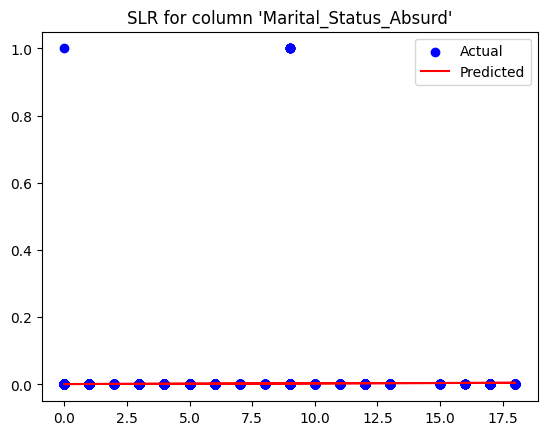

Results for column 'Marital_Status_Alone':
                             OLS Regression Results                             
Dep. Variable:     Marital_Status_Alone   R-squared:                       0.000
Model:                              OLS   Adj. R-squared:                 -0.000
Method:                   Least Squares   F-statistic:                    0.4824
Date:                  Fri, 21 Jul 2023   Prob (F-statistic):              0.487
Time:                          03:31:18   Log-Likelihood:                 6254.9
No. Observations:                  3532   AIC:                        -1.251e+04
Df Residuals:                      3530   BIC:                        -1.249e+04
Df Model:                             1                                         
Covariance Type:              nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------

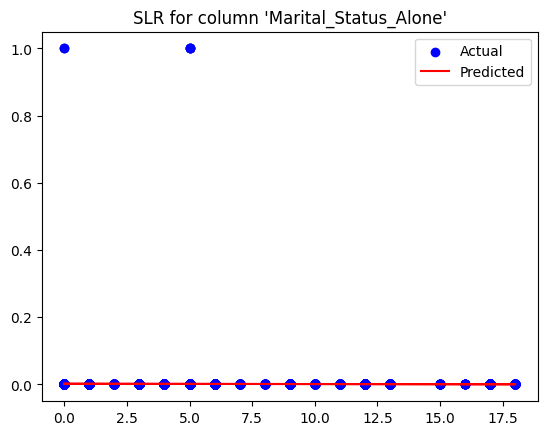

Results for column 'Marital_Status_Divorced':
                               OLS Regression Results                              
Dep. Variable:     Marital_Status_Divorced   R-squared:                       0.004
Model:                                 OLS   Adj. R-squared:                  0.004
Method:                      Least Squares   F-statistic:                     14.76
Date:                     Fri, 21 Jul 2023   Prob (F-statistic):           0.000124
Time:                             03:31:19   Log-Likelihood:                -972.13
No. Observations:                     3532   AIC:                             1948.
Df Residuals:                         3530   BIC:                             1961.
Df Model:                                1                                         
Covariance Type:                 nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------

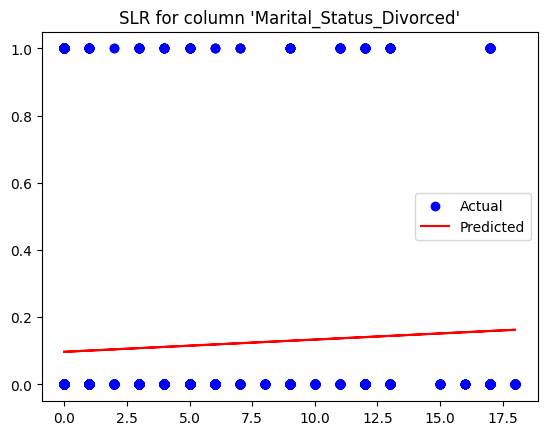

Results for column 'Marital_Status_Married':
                              OLS Regression Results                              
Dep. Variable:     Marital_Status_Married   R-squared:                       0.002
Model:                                OLS   Adj. R-squared:                  0.001
Method:                     Least Squares   F-statistic:                     5.365
Date:                    Fri, 21 Jul 2023   Prob (F-statistic):             0.0206
Time:                            03:31:19   Log-Likelihood:                -2440.6
No. Observations:                    3532   AIC:                             4885.
Df Residuals:                        3530   BIC:                             4898.
Df Model:                               1                                         
Covariance Type:                nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------

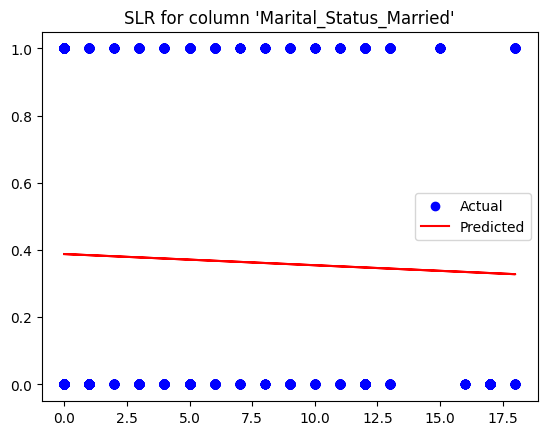

Results for column 'Marital_Status_Single':
                              OLS Regression Results                             
Dep. Variable:     Marital_Status_Single   R-squared:                       0.000
Model:                               OLS   Adj. R-squared:                 -0.000
Method:                    Least Squares   F-statistic:                    0.5376
Date:                   Fri, 21 Jul 2023   Prob (F-statistic):              0.463
Time:                           03:31:20   Log-Likelihood:                -1955.4
No. Observations:                   3532   AIC:                             3915.
Df Residuals:                       3530   BIC:                             3927.
Df Model:                              1                                         
Covariance Type:               nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------

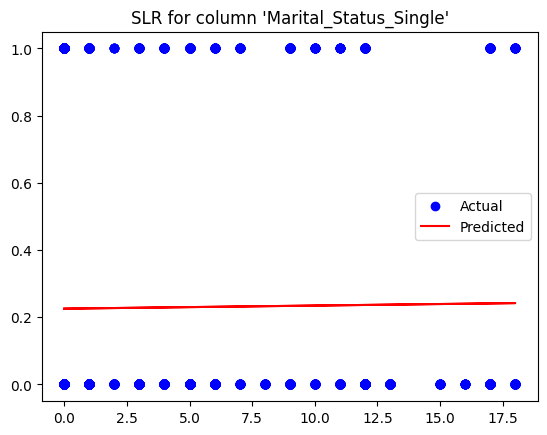

Results for column 'Marital_Status_Together':
                               OLS Regression Results                              
Dep. Variable:     Marital_Status_Together   R-squared:                       0.000
Model:                                 OLS   Adj. R-squared:                 -0.000
Method:                      Least Squares   F-statistic:                    0.7251
Date:                     Fri, 21 Jul 2023   Prob (F-statistic):              0.395
Time:                             03:31:20   Log-Likelihood:                -2016.7
No. Observations:                     3532   AIC:                             4037.
Df Residuals:                         3530   BIC:                             4050.
Df Model:                                1                                         
Covariance Type:                 nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------

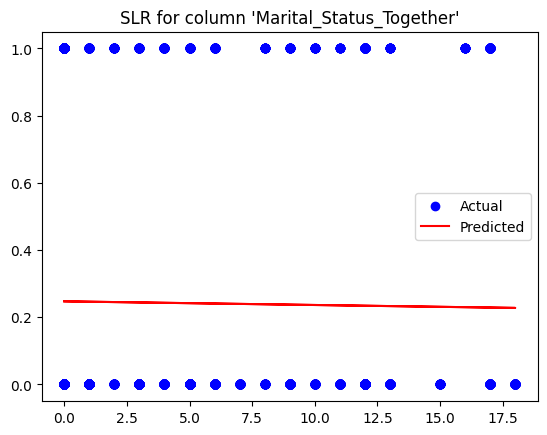

Results for column 'Marital_Status_Widow':
                             OLS Regression Results                             
Dep. Variable:     Marital_Status_Widow   R-squared:                       0.000
Model:                              OLS   Adj. R-squared:                 -0.000
Method:                   Least Squares   F-statistic:                    0.1194
Date:                  Fri, 21 Jul 2023   Prob (F-statistic):              0.730
Time:                          03:31:20   Log-Likelihood:                 912.42
No. Observations:                  3532   AIC:                            -1821.
Df Residuals:                      3530   BIC:                            -1809.
Df Model:                             1                                         
Covariance Type:              nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------

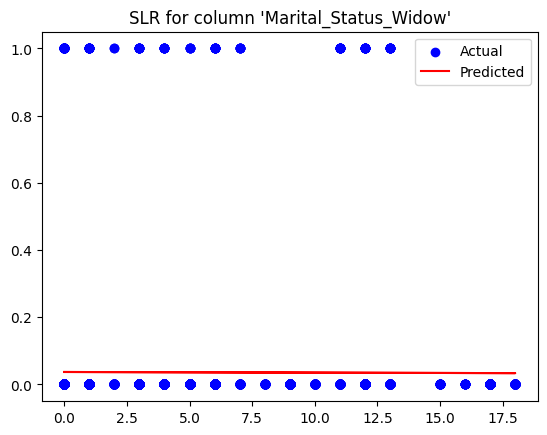

Results for column 'Marital_Status_YOLO':
                             OLS Regression Results                            
Dep. Variable:     Marital_Status_YOLO   R-squared:                       0.000
Model:                             OLS   Adj. R-squared:                  0.000
Method:                  Least Squares   F-statistic:                     1.232
Date:                 Fri, 21 Jul 2023   Prob (F-statistic):              0.267
Time:                         03:31:21   Log-Likelihood:                 8193.4
No. Observations:                 3532   AIC:                        -1.638e+04
Df Residuals:                     3530   BIC:                        -1.637e+04
Df Model:                            1                                         
Covariance Type:             nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------


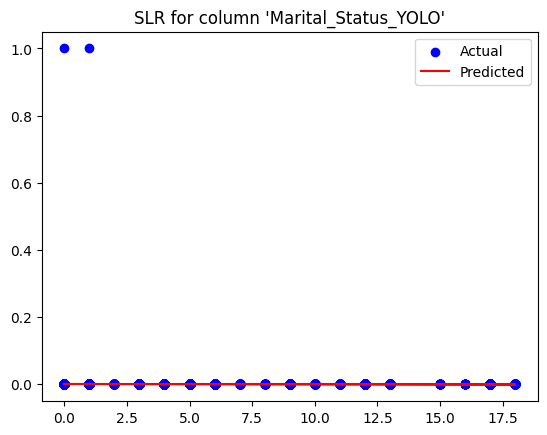

Results for column 'Month':
                            OLS Regression Results                            
Dep. Variable:                  Month   R-squared:                       0.014
Model:                            OLS   Adj. R-squared:                  0.014
Method:                 Least Squares   F-statistic:                     51.14
Date:                Fri, 21 Jul 2023   Prob (F-statistic):           1.04e-12
Time:                        03:31:21   Log-Likelihood:                -9360.3
No. Observations:                3532   AIC:                         1.872e+04
Df Residuals:                    3530   BIC:                         1.874e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          6.7093   

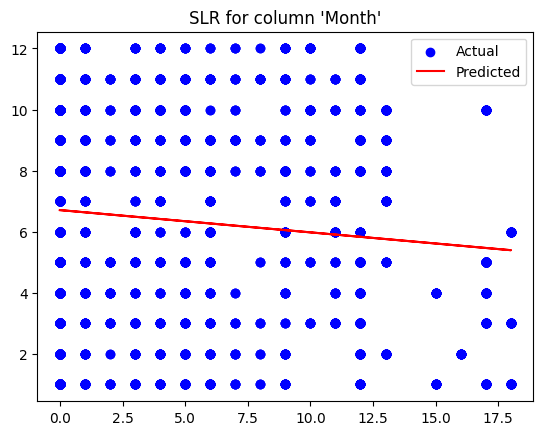

Results for column 'Day':
                            OLS Regression Results                            
Dep. Variable:                    Day   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                 -0.000
Method:                 Least Squares   F-statistic:                    0.6711
Date:                Fri, 21 Jul 2023   Prob (F-statistic):              0.413
Time:                        03:31:21   Log-Likelihood:                -12672.
No. Observations:                3532   AIC:                         2.535e+04
Df Residuals:                    3530   BIC:                         2.536e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         15.3904     

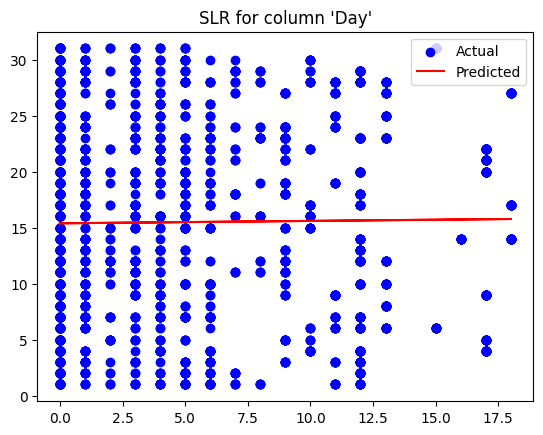

Results for column 'DayOfWeek':
                            OLS Regression Results                            
Dep. Variable:              DayOfWeek   R-squared:                       0.008
Model:                            OLS   Adj. R-squared:                  0.008
Method:                 Least Squares   F-statistic:                     30.20
Date:                Fri, 21 Jul 2023   Prob (F-statistic):           4.17e-08
Time:                        03:31:22   Log-Likelihood:                -7374.1
No. Observations:                3532   AIC:                         1.475e+04
Df Residuals:                    3530   BIC:                         1.476e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          2.961

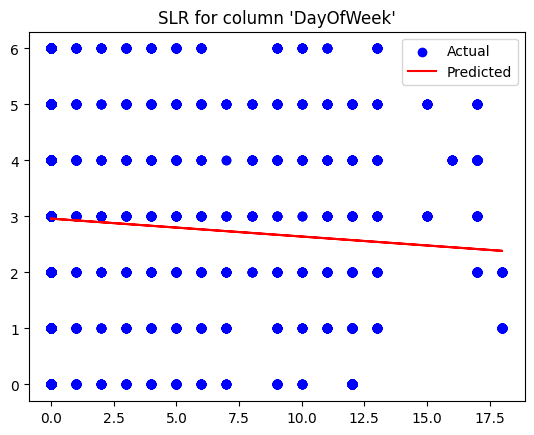

In [ ]:
import statsmodels.api as sm
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression

# Define predictor and target variables
X_train = train_data['predictor'].values
y_train = train_data.drop('predictor', axis=1)

# Initialize the linear regression model
model_sklearn = LinearRegression()

for column in y_train.columns:
    # Select target variable
    y = y_train[column]

    # Add a constant for statsmodels
    X_train_sm = sm.add_constant(X_train)

    # Fit the model using statsmodels
    model_sm = sm.OLS(y, X_train_sm)
    results_sm = model_sm.fit()

    # Print out the statistics
    print(f"Results for column '{column}':")
    print(results_sm.summary())

    # Fit the model using sklearn
    model_sklearn.fit(X_train.reshape(-1, 1), y)

    # Print the coefficient and intercept
    print('Coefficient: ', model_sklearn.coef_)
    print('Intercept: ', model_sklearn.intercept_)

    # Make predictions with the sklearn model
    y_pred = model_sklearn.predict(X_train.reshape(-1, 1))

    # Plot the results
    plt.scatter(X_train, y, color='blue', label='Actual')
    plt.plot(X_train, y_pred, color='red', label='Predicted')
    plt.title(f"SLR for column '{column}'")
    plt.legend()
    plt.show()

In [ ]:
import sklearn
print(sklearn.__version__)

1.2.2


In [ ]:
from sklearn.metrics import roc_auc_score

# Random Forest Classifier

## With alternative data (feature engineering education level -> similar to that with the rf regression)

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix
import pandas as pd

# Define predictor and explanatory variables
X_train2 = train_data2.drop('predictor', axis=1)
y_train2 = train_data2['predictor']
X_test2 = test_data2.drop('predictor', axis=1)
y_test2 = test_data2['predictor']

# Initialize the RandomForestClassifier with default parameters
rf = RandomForestClassifier(random_state=42)

# Fit the model to the data
rf.fit(X_train2, y_train2)

# Predict the target for the test data
y_pred = rf.predict(X_test2)

# Evaluate the model
accuracy = accuracy_score(y_test2, y_pred)

print(f"Accuracy: {accuracy}")

# Print the confusion matrix
cm = confusion_matrix(y_test2, y_pred)
print(f"Confusion Matrix: \n{cm}")

# Get feature importances
importances = rf.feature_importances_

# Create a DataFrame for visualization
importances_df = pd.DataFrame({'feature': X_train2.columns, 'importance': importances})

# Sort the DataFrame by importance score
importances_df = importances_df.sort_values('importance', ascending=False)

print("\nFeature Importances:")
print(importances_df)

Accuracy: 0.9937712344280861
Confusion Matrix: 
[[1386    5    0    0    0    0    0    0    0    0    0    0    0    0
     0    0    0    0]
 [   2  233    0    0    0    0    0    0    0    0    0    0    0    0
     0    0    0    0]
 [   0    0   64    1    0    0    0    0    0    0    0    0    0    0
     0    0    0    0]
 [   0    0    0  179    5    0    0    0    0    0    0    0    0    0
     0    0    0    0]
 [   0    0    0    0  159    2    0    0    0    0    0    0    0    0
     0    0    0    0]
 [   0    0    0    0    3  226    0    0    0    0    0    0    0    0
     0    0    0    0]
 [   0    0    0    0    0    0  164    0    0    0    0    0    0    0
     0    0    0    0]
 [   0    0    0    0    0    0    0   58    0    0    0    0    0    0
     0    0    0    0]
 [   0    0    0    0    0    0    0    0   40    0    0    0    0    0
     0    0    0    0]
 [   0    0    0    0    0    0    0    0    0  145    0    0    0    0
     0    0    0    0]
 [

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix
import pandas as pd

# Define predictor and explanatory variables
X_train = train_data.drop('predictor', axis=1)
y_train = train_data['predictor']
X_test = test_data.drop('predictor', axis=1)
y_test = test_data['predictor']

# Initialize the RandomForestClassifier with default parameters
rf = RandomForestClassifier(random_state=42)

# Fit the model to the data
rf.fit(X_train, y_train)

# Predict the target for the test data
y_pred = rf.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)

print(f"Accuracy: {accuracy}")

# Print the confusion matrix
cm = confusion_matrix(y_test, y_pred)
print(f"Confusion Matrix: \n{cm}")

# Get feature importances
importances = rf.feature_importances_

# Create a DataFrame for visualization
importances_df = pd.DataFrame({'feature': X_train.columns, 'importance': importances})

# Sort the DataFrame by importance score
importances_df = importances_df.sort_values('importance', ascending=False)

print("\nFeature Importances:")
print(importances_df)

Accuracy: 0.9739819004524887
Confusion Matrix: 
[[338   6   0   0   0   0   0   0   0   0   0   0   1   0   0   0   0   0]
 [  7  54   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0   0  10   1   0   0   0   0   0   0   0   0   0   0   0   0   0   0]
 [  2   0   0  43   1   0   0   0   0   0   0   0   0   0   0   0   0   0]
 [  2   0   0   0  39   0   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0   0   0   0   1  50   0   0   0   0   0   0   0   0   0   0   0   0]
 [  2   0   0   0   0   0  42   0   0   0   0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0  18   0   0   0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0   8   0   0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0   0  35   0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0   0   0  11   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0   0   0   0  18   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0   0   0   0   0  7

In [ ]:
X_train

,Year_Birth,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,Complain,Z_CostContact,Z_Revenue,Education_2n Cycle,Education_Basic,Education_Graduation,Education_Master,Education_PhD,Marital_Status_Absurd,Marital_Status_Alone,Marital_Status_Divorced,Marital_Status_Married,Marital_Status_Single,Marital_Status_Together,Marital_Status_Widow,Marital_Status_YOLO,Year,Month,Day,DayOfWeek
ID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
10258,1965,35791.0,2.0,1.0,94,27,0,-0.805530,-0.783417,-0.782891,-0.903209,2,1,0,3.0,8,0,3,11,0,0,0,1,0,0,0,0,0,1,0,0,0,2013,5,6,0
10598,1967,27943.0,1.0,1.0,89,12,1,-0.743433,-0.683207,-0.746263,-0.903209,3,2,0,3.0,8,0,3,11,0,0,1,0,0,0,0,0,0,0,1,0,0,2013,4,15,0
2176,1972,80134.0,1.0,0.0,40,1218,16,0.701731,1.822050,-0.782891,1.037397,2,5,3,6.0,6,0,3,11,0,0,1,0,0,0,0,0,1,0,0,0,0,2013,5,20,0
1212,1973,52845.0,1.0,0.0,7,384,25,0.814635,2.235417,0.718870,0.634154,3,8,8,6.0,6,0,3,11,0,0,1,0,0,0,0,0,1,0,0,0,0,2013,8,13,1
1324,1988,38872.0,1.0,0.0,93,23,3,-0.715207,-0.708260,-0.086953,-0.424358,2,3,0,3.0,8,0,3,11,0,0,1,0,0,0,0,0,1,0,0,0,0,2013,5,30,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10164,1958,94472.0,0.0,1.0,75,1017,33,1.520281,1.922260,2.184002,-0.575574,1,5,5,5.0,5,0,3,11,0,0,1,0,0,0,0,0,0,1,0,0,0,2014,4,3,3
9167,1956,67131.0,0.0,1.0,72,465,71,0.577537,1.546471,0.499100,0.583749,3,9,2,12.0,6,0,3,11,0,0,1,0,0,0,0,0,1,0,0,0,0,2013,3,26,1
9984,1981,56337.0,1.0,1.0,25,349,16,-0.020851,-0.081945,-0.599749,2.209321,5,8,5,4.0,8,0,3,11,1,0,0,0,0,0,0,0,1,0,0,0,0,2013,3,27,2


In [ ]:
y_train

ID
10258     0
10598     0
2176     12
1212      4
1324      0
         ..
10164     5
9167      0
9984     11
3220      0
6233      0
Name: predictor, Length: 3532, dtype: int64

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix
import pandas as pd

# Define predictor and explanatory variables
X_train = train_data.drop('predictor', axis=1)
y_train = train_data['predictor']
X_test = test_data.drop('predictor', axis=1)
y_test = test_data['predictor']


# Initialize the RandomForestClassifier with default parameters
rf = RandomForestClassifier(random_state=42)

# Fit the model to the data
rf.fit(X_train, y_train)

# Predict the target for the test data
y_pred = rf.predict(X_test)

#### **Step 4. Evaluation**
In this step, you will evaluate the performance of the models using various metrics and techniques, such as accuracy, precision, recall, F1-score, confusion matrix, ROC curve, etc. You will also compare the results of different models and select the best one.


> Q4a. Evaluate the models accuracy by calculating / plotting the following
1. Confusion Matrix
2. Accuracy Score, Recall Score, Precision Score, AUC Score & F1 Score
3. Plot the ROC Curve

# K-mean clustering

The model has a silhouette score of 0.6319 which indicates that when clustered by taking all the columns as dimensions. The two clusters are close to each other and far from points in other clusters. The Davies-Bouldin score of 0.49 indicate that the clusters are moderately dissimilar to one another. However this clustering was obtained when the data was analyzed along all 36 dimensions. This makes it difficult to view this clustered seperation especially when the two clusters are viewed side by side in 2 dimensions (except in a few cases i.e. kidInHome). However, as no large scale distinctions are not visble no useful output can be gauged from the data from this clustering based approach.

In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, davies_bouldin_score
import matplotlib.pyplot as plt
import numpy as np

# Set the number of clusters
n_clusters = 2

# Apply K-Means with the fixed number of clusters
kmeans = KMeans(n_clusters=n_clusters, init='k-means++', max_iter=300, n_init=10, random_state=0)
pred_y = kmeans.fit_predict(data_ML)

# Calculate metrics
silhouette = silhouette_score(data_ML, pred_y)
db_score = davies_bouldin_score(data_ML, pred_y)

# Print metrics
print(f'Silhouette Score: {silhouette}')
print(f'Davies-Bouldin Score: {db_score}')

# Add cluster labels to the original data
data_ML['Cluster'] = pred_y

Silhouette Score: 0.631945594568977
Davies-Bouldin Score: 0.49297803626835024


# Random Forest Classifier

We acessed the confusion matrix for RF clustering and feature importance

In [ ]:
accuracy = accuracy_score(y_test, y_pred)

print(f"Accuracy: {accuracy}")

# Print the confusion matrix
cm = confusion_matrix(y_test, y_pred)
print(f"Confusion Matrix: \n{cm}")

# Get feature importances
importances = rf.feature_importances_

# Create a DataFrame for visualization
importances_df = pd.DataFrame({'feature': X_train.columns, 'importance': importances})

# Sort the DataFrame by importance score
importances_df = importances_df.sort_values('importance', ascending=False)

print("\nFeature Importances:")
print(importances_df)

Accuracy: 0.9739819004524887
Confusion Matrix: 
[[338   5   0   1   0   0   0   0   0   0   0   0   1   0   0   0   0   0]
 [  7  54   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0   0  10   1   0   0   0   0   0   0   0   0   0   0   0   0   0   0]
 [  2   0   0  43   1   0   0   0   0   0   0   0   0   0   0   0   0   0]
 [  2   0   0   0  39   0   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0   0   0   0   1  50   0   0   0   0   0   0   0   0   0   0   0   0]
 [  2   0   0   0   0   0  42   0   0   0   0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0  18   0   0   0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0   8   0   0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0   0  35   0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0   0   0  11   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0   0   0   0  18   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0   0   0   0   0  7

Accuracy: 0.9739819004524887
Recall: 0.9739819004524887
Precision: 0.9740832445583578
F1 Score: 0.9739131825989615


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_ranking.py:1029: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(


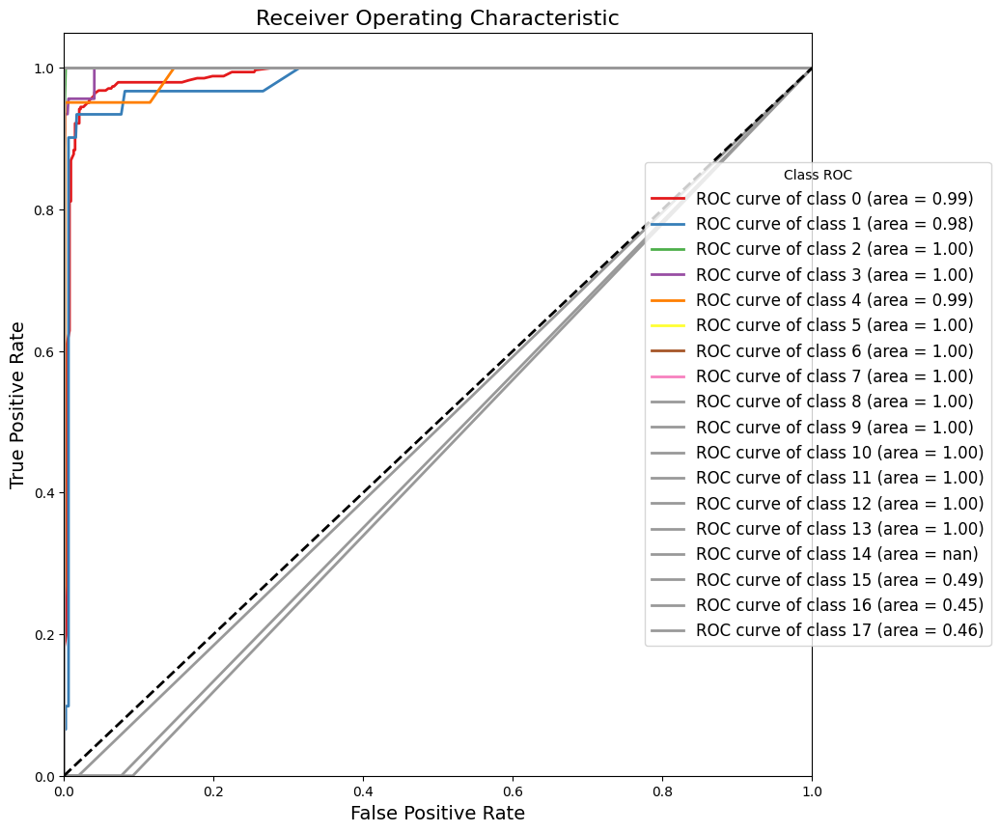

In [ ]:
from sklearn.metrics import auc

# Calculate Accuracy, Recall, Precision, AUC, and F1 scores
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='weighted')  # or 'macro' or 'weighted'
precision = precision_score(y_test, y_pred, average='weighted')  # or 'macro' or 'weighted'
f1 = f1_score(y_test, y_pred, average='weighted')  # or 'macro' or 'weighted'

print(f"Accuracy: {accuracy}")
print(f"Recall: {recall}")
print(f"Precision: {precision}")
print(f"F1 Score: {f1}")

# Calculate probabilities for each class
y_probs = rfc.predict_proba(X_test)

import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

n_classes = len(np.unique(y_test))

fpr = dict()
tpr = dict()
roc_auc = dict()

# Choose a color palette with seaborn.
num_classes = len(np.unique(y_test))
palette = plt.get_cmap('Set1')

plt.figure(figsize=(10, 10))
for i, color in zip(range(n_classes), palette(np.arange(num_classes).tolist())):
    fpr[i], tpr[i], _ = roc_curve(y_test == i, y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate', fontsize=14)
plt.ylabel('True Positive Rate', fontsize=14)
plt.title('Receiver Operating Characteristic', fontsize=16)
plt.legend(loc="center right", bbox_to_anchor=(1.25, 0.5), title='Class ROC', fontsize=12)

plt.show()

# Simple Linear Regression

Variables Income, KidHome, Teenhome, some points of purchase and some products appear to have strong correlation with the predictor. These can be isolted to possibly create a stronger linear regresison model.

Results for column 'Year_Birth':
                            OLS Regression Results                            
Dep. Variable:             Year_Birth   R-squared:                       0.004
Model:                            OLS   Adj. R-squared:                  0.004
Method:                 Least Squares   F-statistic:                     14.32
Date:                Fri, 21 Jul 2023   Prob (F-statistic):           0.000157
Time:                        22:54:14   Log-Likelihood:                -13863.
No. Observations:                3532   AIC:                         2.773e+04
Df Residuals:                    3530   BIC:                         2.774e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       1968.33

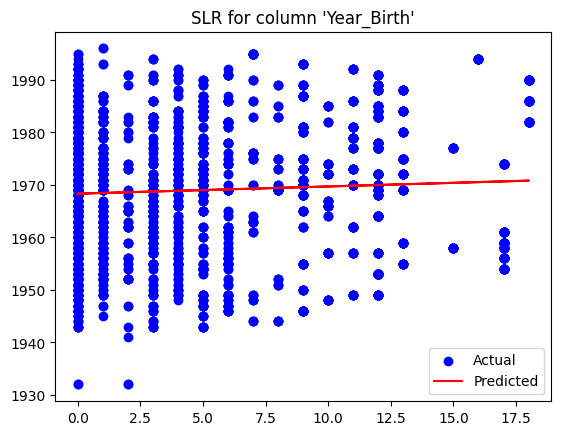

Results for column 'Income':
                            OLS Regression Results                            
Dep. Variable:                 Income   R-squared:                       0.359
Model:                            OLS   Adj. R-squared:                  0.359
Method:                 Least Squares   F-statistic:                     1975.
Date:                Fri, 21 Jul 2023   Prob (F-statistic):               0.00
Time:                        22:54:15   Log-Likelihood:                -39675.
No. Observations:                3532   AIC:                         7.935e+04
Df Residuals:                    3530   BIC:                         7.937e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       4.941e+04  

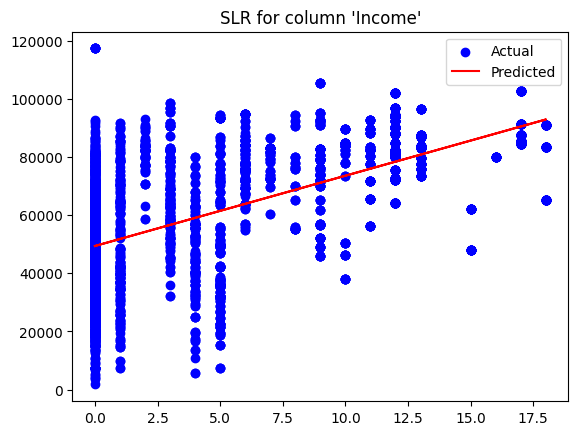

Results for column 'Kidhome':
                            OLS Regression Results                            
Dep. Variable:                Kidhome   R-squared:                       0.137
Model:                            OLS   Adj. R-squared:                  0.137
Method:                 Least Squares   F-statistic:                     561.0
Date:                Fri, 21 Jul 2023   Prob (F-statistic):          3.14e-115
Time:                        22:54:15   Log-Likelihood:                -2463.0
No. Observations:                3532   AIC:                             4930.
Df Residuals:                    3530   BIC:                             4942.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.5129 

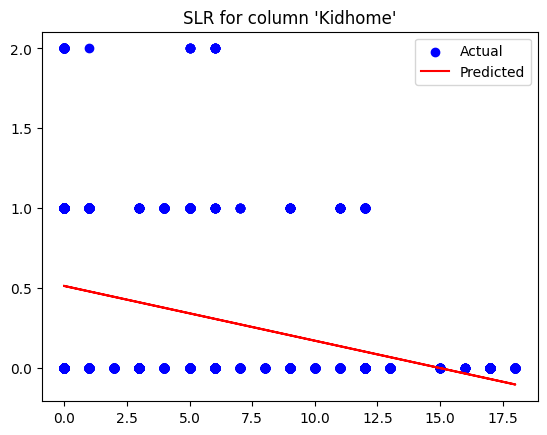

Results for column 'Teenhome':
                            OLS Regression Results                            
Dep. Variable:               Teenhome   R-squared:                       0.062
Model:                            OLS   Adj. R-squared:                  0.062
Method:                 Least Squares   F-statistic:                     233.1
Date:                Fri, 21 Jul 2023   Prob (F-statistic):           5.26e-51
Time:                        22:54:17   Log-Likelihood:                -2893.0
No. Observations:                3532   AIC:                             5790.
Df Residuals:                    3530   BIC:                             5802.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.5467

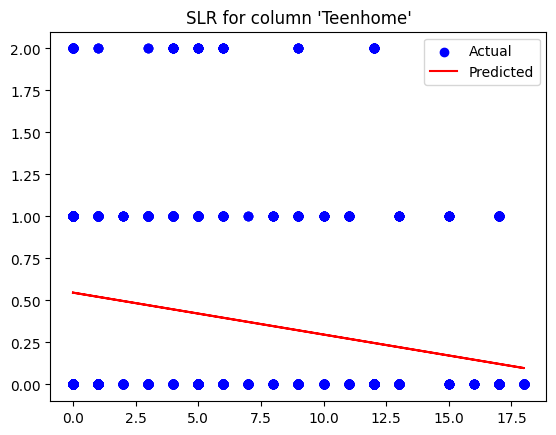

Results for column 'Recency':
                            OLS Regression Results                            
Dep. Variable:                Recency   R-squared:                       0.002
Model:                            OLS   Adj. R-squared:                  0.002
Method:                 Least Squares   F-statistic:                     7.937
Date:                Fri, 21 Jul 2023   Prob (F-statistic):            0.00487
Time:                        22:54:18   Log-Likelihood:                -16916.
No. Observations:                3532   AIC:                         3.384e+04
Df Residuals:                    3530   BIC:                         3.385e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         48.6084 

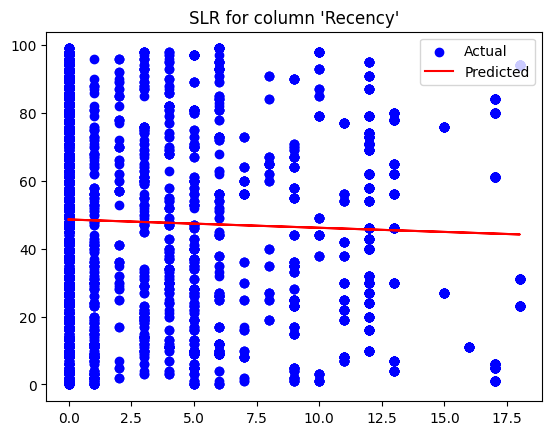

Results for column 'MntWines':
                            OLS Regression Results                            
Dep. Variable:               MntWines   R-squared:                       0.361
Model:                            OLS   Adj. R-squared:                  0.361
Method:                 Least Squares   F-statistic:                     1992.
Date:                Fri, 21 Jul 2023   Prob (F-statistic):               0.00
Time:                        22:54:20   Log-Likelihood:                -25609.
No. Observations:                3532   AIC:                         5.122e+04
Df Residuals:                    3530   BIC:                         5.123e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        270.3945

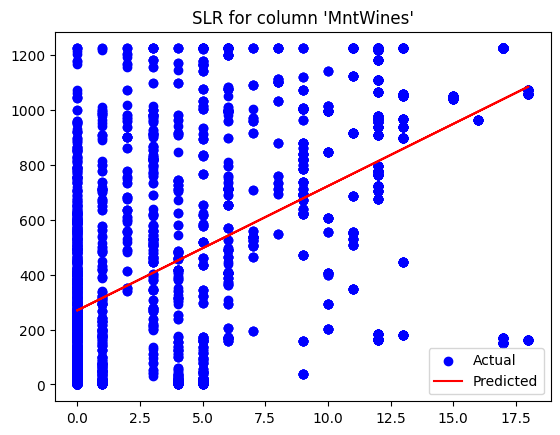

Results for column 'MntFruits':
                            OLS Regression Results                            
Dep. Variable:              MntFruits   R-squared:                       0.056
Model:                            OLS   Adj. R-squared:                  0.056
Method:                 Least Squares   F-statistic:                     209.9
Date:                Fri, 21 Jul 2023   Prob (F-statistic):           2.94e-46
Time:                        22:54:21   Log-Likelihood:                -16704.
No. Observations:                3532   AIC:                         3.341e+04
Df Residuals:                    3530   BIC:                         3.342e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         20.870

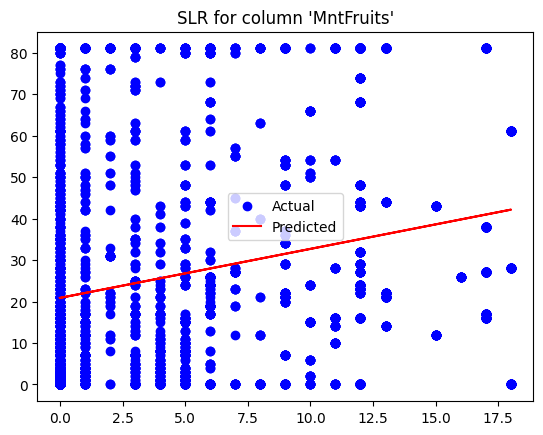

Results for column 'MntMeatProducts':
                            OLS Regression Results                            
Dep. Variable:        MntMeatProducts   R-squared:                       0.189
Model:                            OLS   Adj. R-squared:                  0.189
Method:                 Least Squares   F-statistic:                     823.9
Date:                Fri, 21 Jul 2023   Prob (F-statistic):          4.98e-163
Time:                        22:54:21   Log-Likelihood:                -5155.8
No. Observations:                3532   AIC:                         1.032e+04
Df Residuals:                    3530   BIC:                         1.033e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         

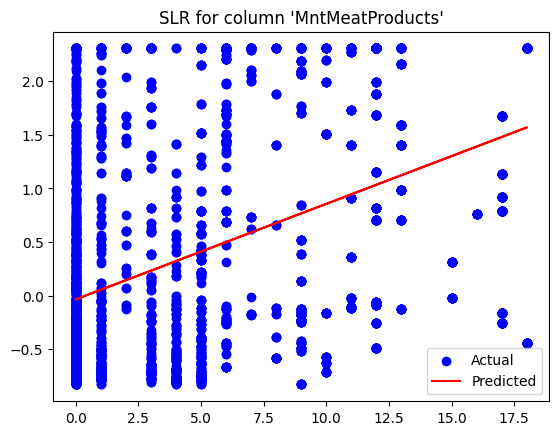

Results for column 'MntFishProducts':
                            OLS Regression Results                            
Dep. Variable:        MntFishProducts   R-squared:                       0.075
Model:                            OLS   Adj. R-squared:                  0.075
Method:                 Least Squares   F-statistic:                     287.7
Date:                Fri, 21 Jul 2023   Prob (F-statistic):           4.19e-62
Time:                        22:54:22   Log-Likelihood:                -5158.5
No. Observations:                3532   AIC:                         1.032e+04
Df Residuals:                    3530   BIC:                         1.033e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         

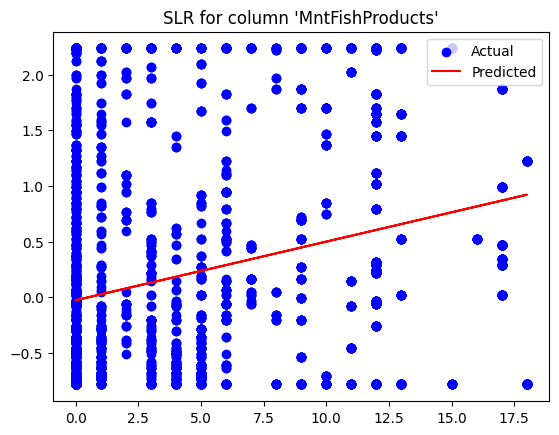

Results for column 'MntSweetProducts':
                            OLS Regression Results                            
Dep. Variable:       MntSweetProducts   R-squared:                       0.124
Model:                            OLS   Adj. R-squared:                  0.123
Method:                 Least Squares   F-statistic:                     498.2
Date:                Fri, 21 Jul 2023   Prob (F-statistic):          2.43e-103
Time:                        22:54:24   Log-Likelihood:                -5128.7
No. Observations:                3532   AIC:                         1.026e+04
Df Residuals:                    3530   BIC:                         1.027e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        

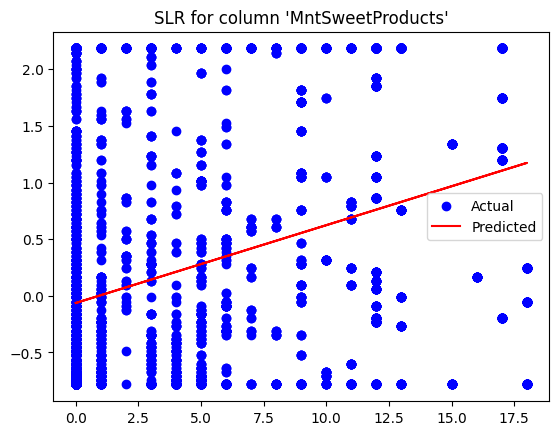

Results for column 'MntGoldProds':
                            OLS Regression Results                            
Dep. Variable:           MntGoldProds   R-squared:                       0.084
Model:                            OLS   Adj. R-squared:                  0.084
Method:                 Least Squares   F-statistic:                     324.9
Date:                Fri, 21 Jul 2023   Prob (F-statistic):           1.51e-69
Time:                        22:54:24   Log-Likelihood:                -5108.9
No. Observations:                3532   AIC:                         1.022e+04
Df Residuals:                    3530   BIC:                         1.023e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.

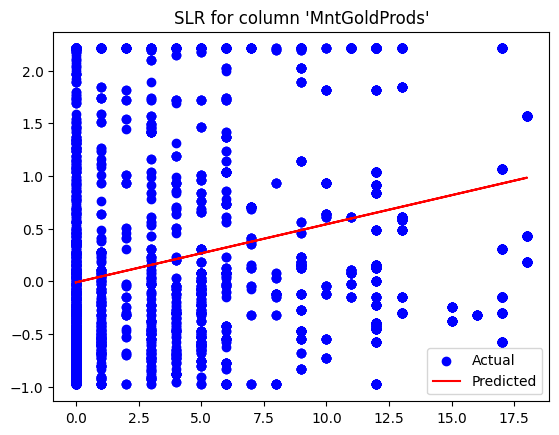

Results for column 'NumDealsPurchases':
                            OLS Regression Results                            
Dep. Variable:      NumDealsPurchases   R-squared:                       0.104
Model:                            OLS   Adj. R-squared:                  0.103
Method:                 Least Squares   F-statistic:                     408.2
Date:                Fri, 21 Jul 2023   Prob (F-statistic):           5.61e-86
Time:                        22:54:24   Log-Likelihood:                -6388.4
No. Observations:                3532   AIC:                         1.278e+04
Df Residuals:                    3530   BIC:                         1.279e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       

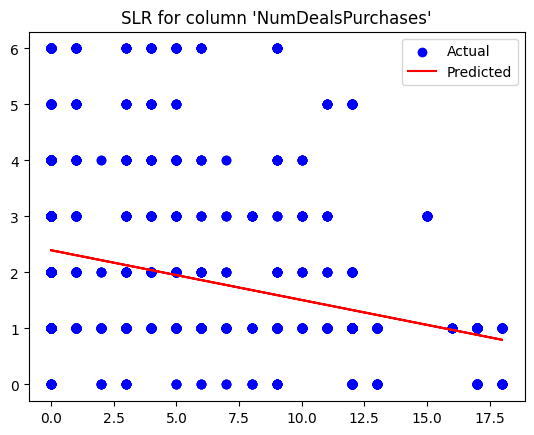

Results for column 'NumWebPurchases':
                            OLS Regression Results                            
Dep. Variable:        NumWebPurchases   R-squared:                       0.063
Model:                            OLS   Adj. R-squared:                  0.062
Method:                 Least Squares   F-statistic:                     236.1
Date:                Fri, 21 Jul 2023   Prob (F-statistic):           1.24e-51
Time:                        22:54:25   Log-Likelihood:                -8315.4
No. Observations:                3532   AIC:                         1.663e+04
Df Residuals:                    3530   BIC:                         1.665e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         

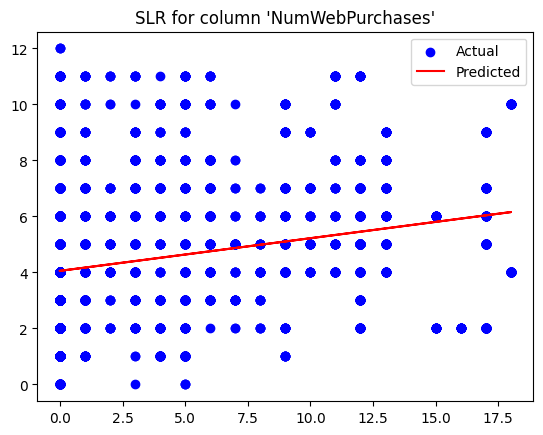

Results for column 'NumCatalogPurchases':
                             OLS Regression Results                            
Dep. Variable:     NumCatalogPurchases   R-squared:                       0.317
Model:                             OLS   Adj. R-squared:                  0.317
Method:                  Least Squares   F-statistic:                     1638.
Date:                 Fri, 21 Jul 2023   Prob (F-statistic):          1.77e-294
Time:                         22:54:25   Log-Likelihood:                -8358.9
No. Observations:                 3532   AIC:                         1.672e+04
Df Residuals:                     3530   BIC:                         1.673e+04
Df Model:                            1                                         
Covariance Type:             nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------


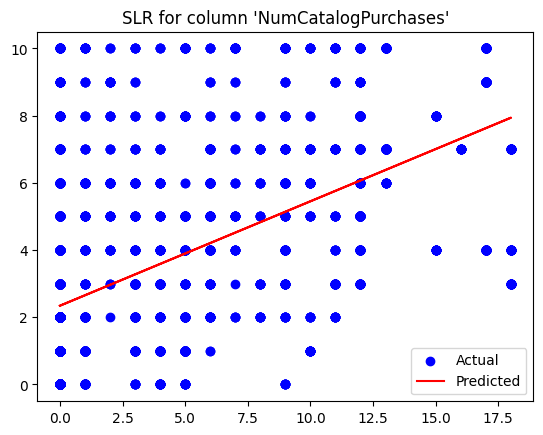

Results for column 'NumStorePurchases':
                            OLS Regression Results                            
Dep. Variable:      NumStorePurchases   R-squared:                       0.098
Model:                            OLS   Adj. R-squared:                  0.098
Method:                 Least Squares   F-statistic:                     382.6
Date:                Fri, 21 Jul 2023   Prob (F-statistic):           5.59e-81
Time:                        22:54:25   Log-Likelihood:                -9004.9
No. Observations:                3532   AIC:                         1.801e+04
Df Residuals:                    3530   BIC:                         1.803e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       

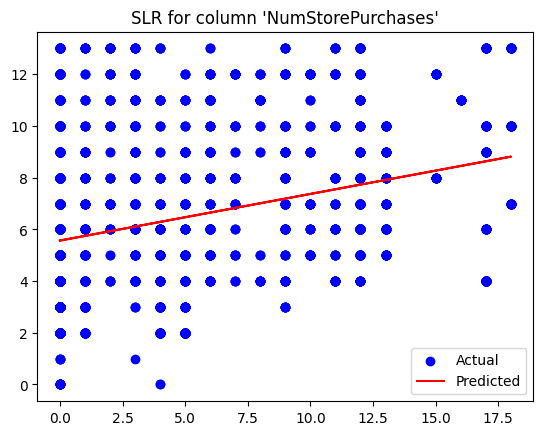

Results for column 'NumWebVisitsMonth':
                            OLS Regression Results                            
Dep. Variable:      NumWebVisitsMonth   R-squared:                       0.087
Model:                            OLS   Adj. R-squared:                  0.086
Method:                 Least Squares   F-statistic:                     334.4
Date:                Fri, 21 Jul 2023   Prob (F-statistic):           1.95e-71
Time:                        22:54:26   Log-Likelihood:                -7965.0
No. Observations:                3532   AIC:                         1.593e+04
Df Residuals:                    3530   BIC:                         1.595e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       

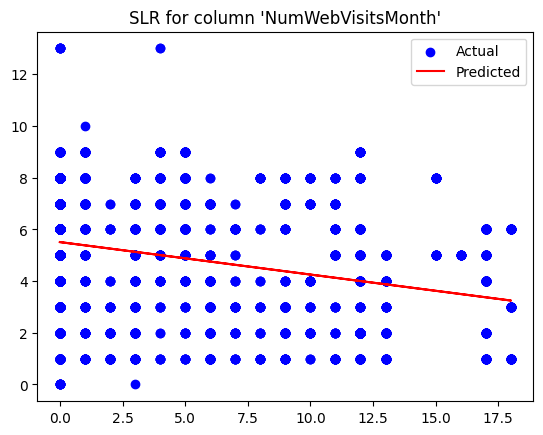

Results for column 'Complain':
                            OLS Regression Results                            
Dep. Variable:               Complain   R-squared:                       0.002
Model:                            OLS   Adj. R-squared:                  0.002
Method:                 Least Squares   F-statistic:                     8.230
Date:                Fri, 21 Jul 2023   Prob (F-statistic):            0.00415
Time:                        22:54:26   Log-Likelihood:                 2536.5
No. Observations:                3532   AIC:                            -5069.
Df Residuals:                    3530   BIC:                            -5057.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0191

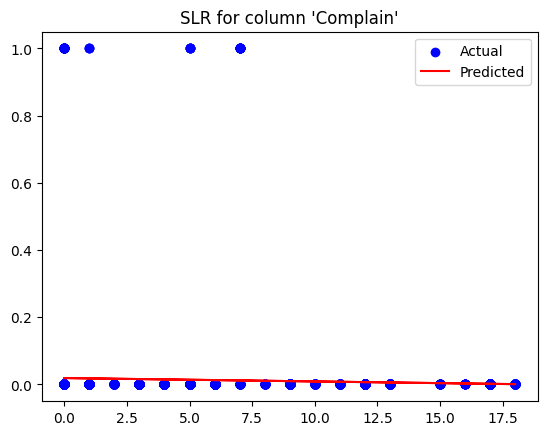

Results for column 'Z_CostContact':
                            OLS Regression Results                            
Dep. Variable:          Z_CostContact   R-squared:                        -inf
Model:                            OLS   Adj. R-squared:                   -inf
Method:                 Least Squares   F-statistic:                    -3530.
Date:                Fri, 21 Jul 2023   Prob (F-statistic):               1.00
Time:                        22:54:26   Log-Likelihood:             1.0767e+05
No. Observations:                3532   AIC:                        -2.153e+05
Df Residuals:                    3530   BIC:                        -2.153e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          3

/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear_model.py:1752: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.ssr/self.centered_tss


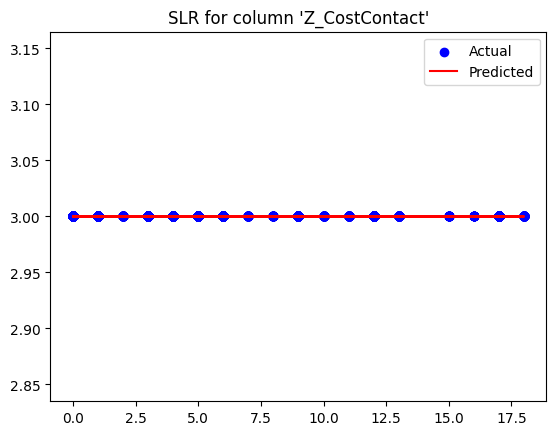

Results for column 'Z_Revenue':
                            OLS Regression Results                            
Dep. Variable:              Z_Revenue   R-squared:                        -inf
Model:                            OLS   Adj. R-squared:                   -inf
Method:                 Least Squares   F-statistic:                    -3530.
Date:                Fri, 21 Jul 2023   Prob (F-statistic):               1.00
Time:                        22:54:27   Log-Likelihood:             1.0437e+05
No. Observations:                3532   AIC:                        -2.087e+05
Df Residuals:                    3530   BIC:                        -2.087e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         11.000

/usr/local/lib/python3.10/dist-packages/statsmodels/stats/stattools.py:125: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  skew = stats.skew(resids, axis=axis)
/usr/local/lib/python3.10/dist-packages/statsmodels/stats/stattools.py:126: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurtosis = 3 + stats.kurtosis(resids, axis=axis)
/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:1633: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  b2 = skew(a, axis)
/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:1738: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic 

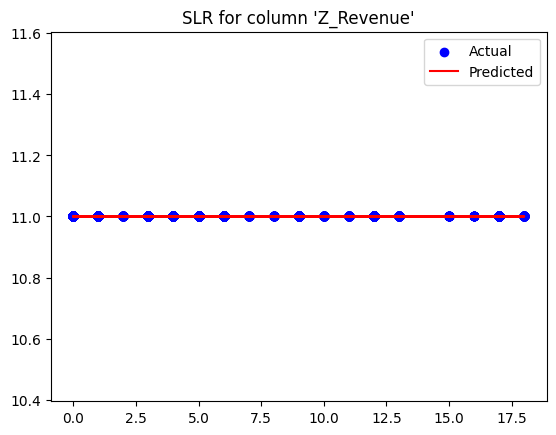

Results for column 'Education_2n Cycle':
                            OLS Regression Results                            
Dep. Variable:     Education_2n Cycle   R-squared:                       0.002
Model:                            OLS   Adj. R-squared:                  0.002
Method:                 Least Squares   F-statistic:                     7.972
Date:                Fri, 21 Jul 2023   Prob (F-statistic):            0.00478
Time:                        22:54:27   Log-Likelihood:                -441.87
No. Observations:                3532   AIC:                             887.7
Df Residuals:                    3530   BIC:                             900.1
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const      

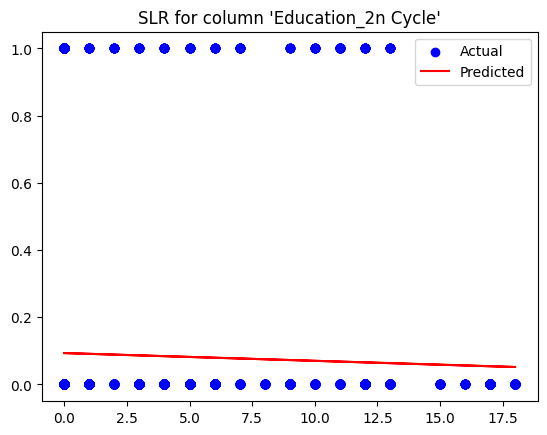

Results for column 'Education_Basic':
                            OLS Regression Results                            
Dep. Variable:        Education_Basic   R-squared:                       0.007
Model:                            OLS   Adj. R-squared:                  0.007
Method:                 Least Squares   F-statistic:                     25.51
Date:                Fri, 21 Jul 2023   Prob (F-statistic):           4.62e-07
Time:                        22:54:27   Log-Likelihood:                 2580.3
No. Observations:                3532   AIC:                            -5157.
Df Residuals:                    3530   BIC:                            -5144.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         

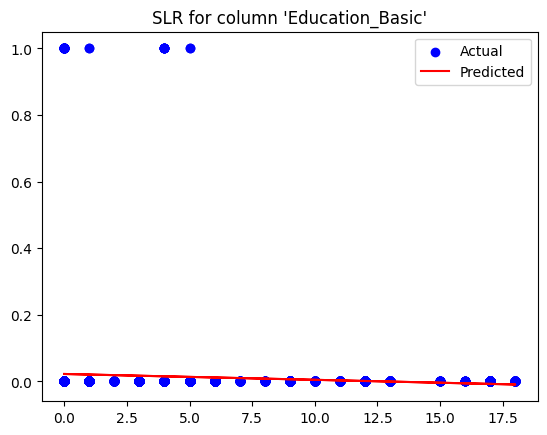

Results for column 'Education_Graduation':
                             OLS Regression Results                             
Dep. Variable:     Education_Graduation   R-squared:                       0.006
Model:                              OLS   Adj. R-squared:                  0.005
Method:                   Least Squares   F-statistic:                     20.43
Date:                  Fri, 21 Jul 2023   Prob (F-statistic):           6.38e-06
Time:                          22:54:27   Log-Likelihood:                -2552.9
No. Observations:                  3532   AIC:                             5110.
Df Residuals:                      3530   BIC:                             5122.
Df Model:                             1                                         
Covariance Type:              nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------

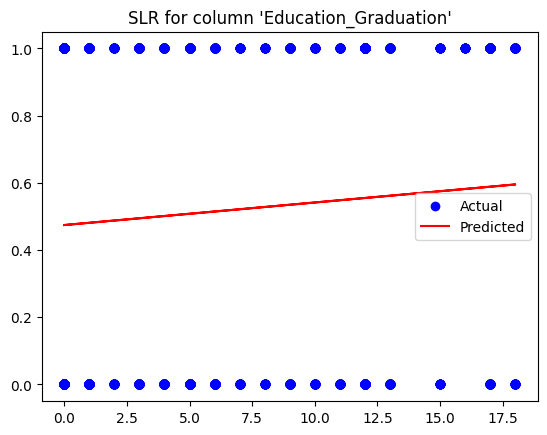

Results for column 'Education_Master':
                            OLS Regression Results                            
Dep. Variable:       Education_Master   R-squared:                       0.004
Model:                            OLS   Adj. R-squared:                  0.003
Method:                 Least Squares   F-statistic:                     13.10
Date:                Fri, 21 Jul 2023   Prob (F-statistic):           0.000299
Time:                        22:54:28   Log-Likelihood:                -1442.7
No. Observations:                3532   AIC:                             2889.
Df Residuals:                    3530   BIC:                             2902.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        

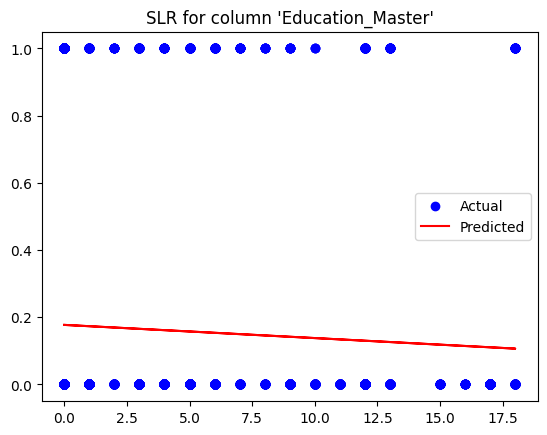

Results for column 'Education_PhD':
                            OLS Regression Results                            
Dep. Variable:          Education_PhD   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                     1.006
Date:                Fri, 21 Jul 2023   Prob (F-statistic):              0.316
Time:                        22:54:28   Log-Likelihood:                -1998.1
No. Observations:                3532   AIC:                             4000.
Df Residuals:                    3530   BIC:                             4013.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0

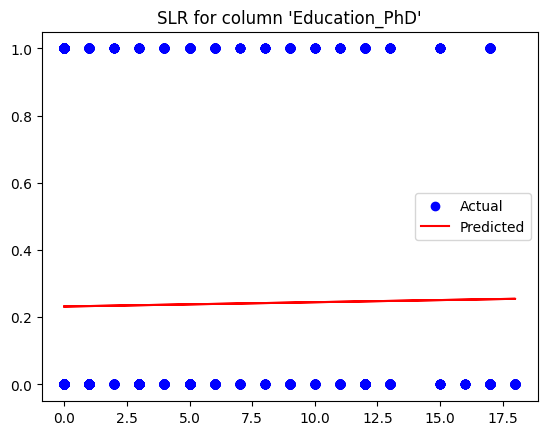

Results for column 'Marital_Status_Absurd':
                              OLS Regression Results                             
Dep. Variable:     Marital_Status_Absurd   R-squared:                       0.001
Model:                               OLS   Adj. R-squared:                  0.000
Method:                    Least Squares   F-statistic:                     2.169
Date:                   Fri, 21 Jul 2023   Prob (F-statistic):              0.141
Time:                           22:54:29   Log-Likelihood:                 5748.7
No. Observations:                   3532   AIC:                        -1.149e+04
Df Residuals:                       3530   BIC:                        -1.148e+04
Df Model:                              1                                         
Covariance Type:               nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------

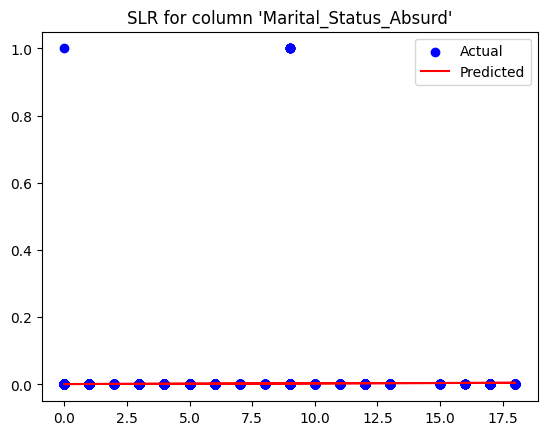

Results for column 'Marital_Status_Alone':
                             OLS Regression Results                             
Dep. Variable:     Marital_Status_Alone   R-squared:                       0.000
Model:                              OLS   Adj. R-squared:                 -0.000
Method:                   Least Squares   F-statistic:                    0.4824
Date:                  Fri, 21 Jul 2023   Prob (F-statistic):              0.487
Time:                          22:54:29   Log-Likelihood:                 6254.9
No. Observations:                  3532   AIC:                        -1.251e+04
Df Residuals:                      3530   BIC:                        -1.249e+04
Df Model:                             1                                         
Covariance Type:              nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------

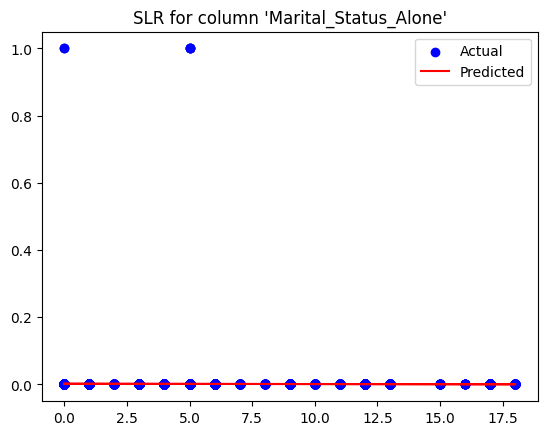

Results for column 'Marital_Status_Divorced':
                               OLS Regression Results                              
Dep. Variable:     Marital_Status_Divorced   R-squared:                       0.004
Model:                                 OLS   Adj. R-squared:                  0.004
Method:                      Least Squares   F-statistic:                     14.76
Date:                     Fri, 21 Jul 2023   Prob (F-statistic):           0.000124
Time:                             22:54:29   Log-Likelihood:                -972.13
No. Observations:                     3532   AIC:                             1948.
Df Residuals:                         3530   BIC:                             1961.
Df Model:                                1                                         
Covariance Type:                 nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------

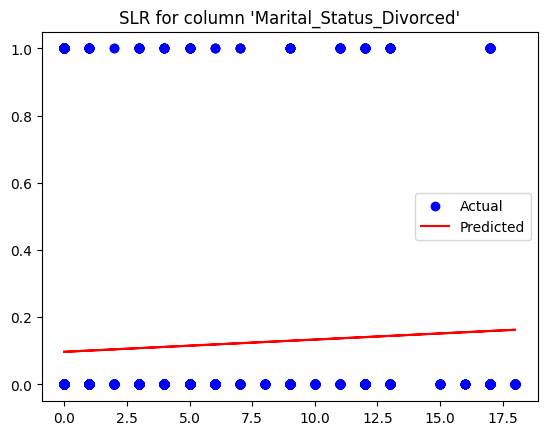

Results for column 'Marital_Status_Married':
                              OLS Regression Results                              
Dep. Variable:     Marital_Status_Married   R-squared:                       0.002
Model:                                OLS   Adj. R-squared:                  0.001
Method:                     Least Squares   F-statistic:                     5.365
Date:                    Fri, 21 Jul 2023   Prob (F-statistic):             0.0206
Time:                            22:54:30   Log-Likelihood:                -2440.6
No. Observations:                    3532   AIC:                             4885.
Df Residuals:                        3530   BIC:                             4898.
Df Model:                               1                                         
Covariance Type:                nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------

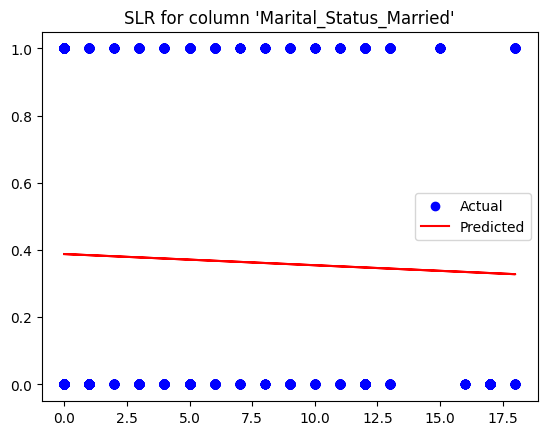

Results for column 'Marital_Status_Single':
                              OLS Regression Results                             
Dep. Variable:     Marital_Status_Single   R-squared:                       0.000
Model:                               OLS   Adj. R-squared:                 -0.000
Method:                    Least Squares   F-statistic:                    0.5376
Date:                   Fri, 21 Jul 2023   Prob (F-statistic):              0.463
Time:                           22:54:31   Log-Likelihood:                -1955.4
No. Observations:                   3532   AIC:                             3915.
Df Residuals:                       3530   BIC:                             3927.
Df Model:                              1                                         
Covariance Type:               nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------

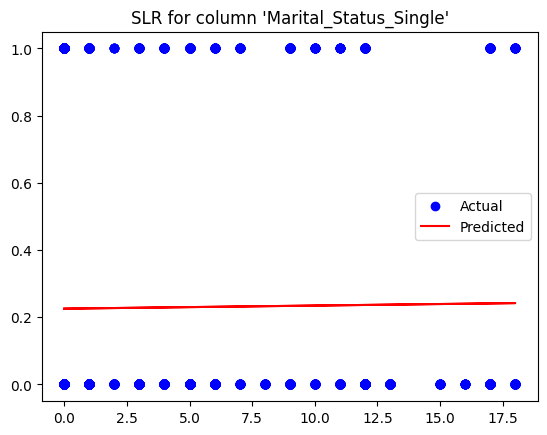

Results for column 'Marital_Status_Together':
                               OLS Regression Results                              
Dep. Variable:     Marital_Status_Together   R-squared:                       0.000
Model:                                 OLS   Adj. R-squared:                 -0.000
Method:                      Least Squares   F-statistic:                    0.7251
Date:                     Fri, 21 Jul 2023   Prob (F-statistic):              0.395
Time:                             22:54:31   Log-Likelihood:                -2016.7
No. Observations:                     3532   AIC:                             4037.
Df Residuals:                         3530   BIC:                             4050.
Df Model:                                1                                         
Covariance Type:                 nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------

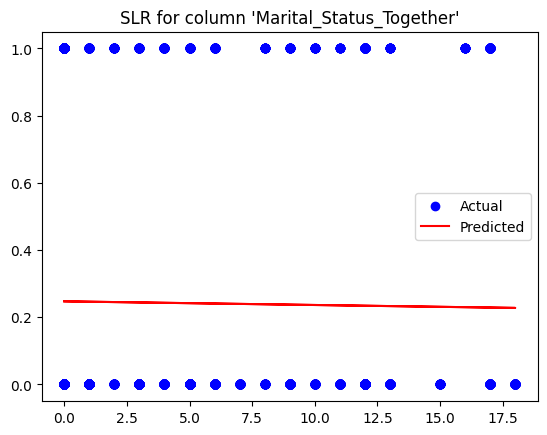

Results for column 'Marital_Status_Widow':
                             OLS Regression Results                             
Dep. Variable:     Marital_Status_Widow   R-squared:                       0.000
Model:                              OLS   Adj. R-squared:                 -0.000
Method:                   Least Squares   F-statistic:                    0.1194
Date:                  Fri, 21 Jul 2023   Prob (F-statistic):              0.730
Time:                          22:54:32   Log-Likelihood:                 912.42
No. Observations:                  3532   AIC:                            -1821.
Df Residuals:                      3530   BIC:                            -1809.
Df Model:                             1                                         
Covariance Type:              nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------

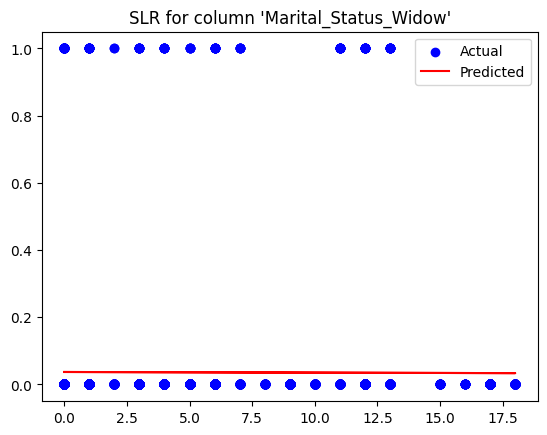

Results for column 'Marital_Status_YOLO':
                             OLS Regression Results                            
Dep. Variable:     Marital_Status_YOLO   R-squared:                       0.000
Model:                             OLS   Adj. R-squared:                  0.000
Method:                  Least Squares   F-statistic:                     1.232
Date:                 Fri, 21 Jul 2023   Prob (F-statistic):              0.267
Time:                         22:54:32   Log-Likelihood:                 8193.4
No. Observations:                 3532   AIC:                        -1.638e+04
Df Residuals:                     3530   BIC:                        -1.637e+04
Df Model:                            1                                         
Covariance Type:             nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------


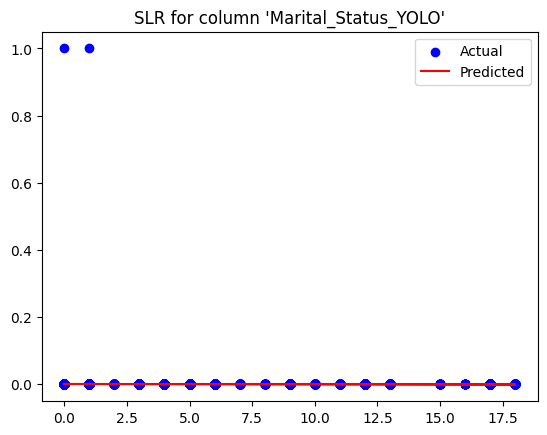

Results for column 'Year':
                            OLS Regression Results                            
Dep. Variable:                   Year   R-squared:                       0.005
Model:                            OLS   Adj. R-squared:                  0.004
Method:                 Least Squares   F-statistic:                     16.95
Date:                Fri, 21 Jul 2023   Prob (F-statistic):           3.92e-05
Time:                        22:54:33   Log-Likelihood:                -3647.0
No. Observations:                3532   AIC:                             7298.
Df Residuals:                    3530   BIC:                             7310.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       2012.9688    

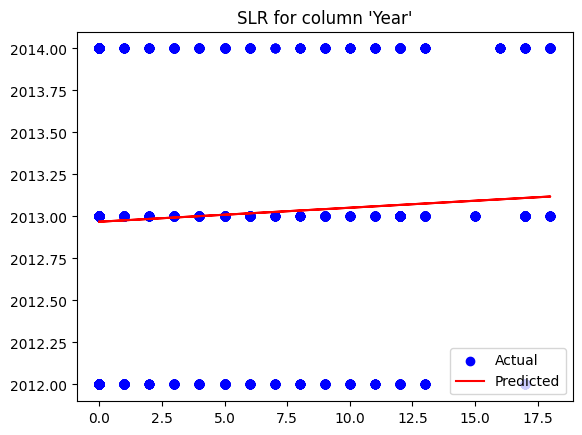

Results for column 'Month':
                            OLS Regression Results                            
Dep. Variable:                  Month   R-squared:                       0.014
Model:                            OLS   Adj. R-squared:                  0.014
Method:                 Least Squares   F-statistic:                     51.14
Date:                Fri, 21 Jul 2023   Prob (F-statistic):           1.04e-12
Time:                        22:54:34   Log-Likelihood:                -9360.3
No. Observations:                3532   AIC:                         1.872e+04
Df Residuals:                    3530   BIC:                         1.874e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          6.7093   

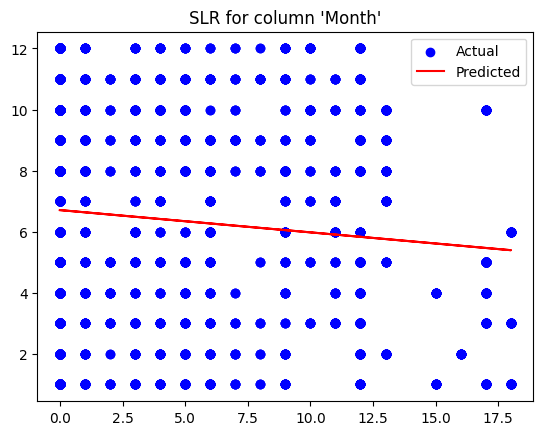

Results for column 'Day':
                            OLS Regression Results                            
Dep. Variable:                    Day   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                 -0.000
Method:                 Least Squares   F-statistic:                    0.6711
Date:                Fri, 21 Jul 2023   Prob (F-statistic):              0.413
Time:                        22:54:34   Log-Likelihood:                -12672.
No. Observations:                3532   AIC:                         2.535e+04
Df Residuals:                    3530   BIC:                         2.536e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         15.3904     

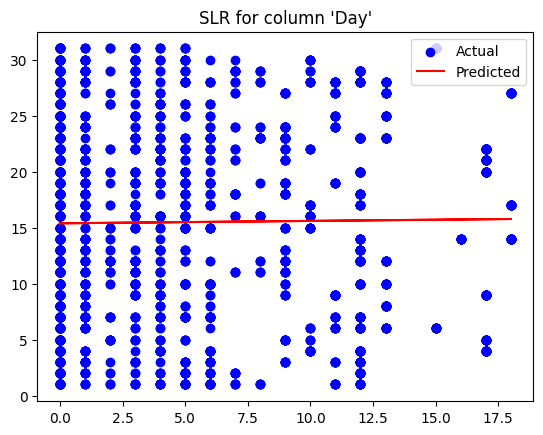

Results for column 'DayOfWeek':
                            OLS Regression Results                            
Dep. Variable:              DayOfWeek   R-squared:                       0.008
Model:                            OLS   Adj. R-squared:                  0.008
Method:                 Least Squares   F-statistic:                     30.20
Date:                Fri, 21 Jul 2023   Prob (F-statistic):           4.17e-08
Time:                        22:54:35   Log-Likelihood:                -7374.1
No. Observations:                3532   AIC:                         1.475e+04
Df Residuals:                    3530   BIC:                         1.476e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          2.961

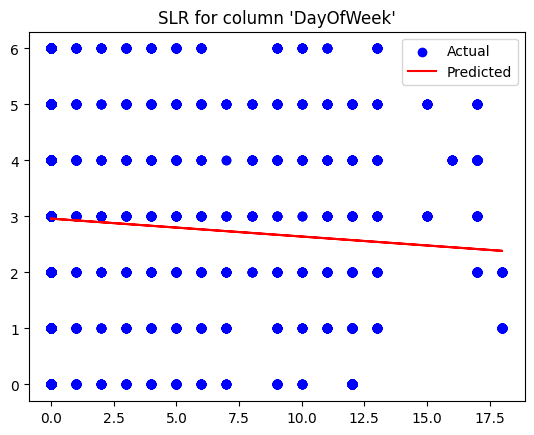

In [ ]:
import statsmodels.api as sm
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression

# Define predictor and target variables
X_train = train_data['predictor'].values
y_train = train_data.drop('predictor', axis=1)

# Initialize the linear regression model
model_sklearn = LinearRegression()

for column in y_train.columns:
    # Select target variable
    y = y_train[column]

    # Add a constant for statsmodels
    X_train_sm = sm.add_constant(X_train)

    # Fit the model using statsmodels
    model_sm = sm.OLS(y, X_train_sm)
    results_sm = model_sm.fit()

    # Print out the statistics
    print(f"Results for column '{column}':")
    print(results_sm.summary())

    # Fit the model using sklearn
    model_sklearn.fit(X_train.reshape(-1, 1), y)

    # Print the coefficient and intercept
    print('Coefficient: ', model_sklearn.coef_)
    print('Intercept: ', model_sklearn.intercept_)

    # Make predictions with the sklearn model
    y_pred = model_sklearn.predict(X_train.reshape(-1, 1))

    # Plot the results
    plt.scatter(X_train, y, color='blue', label='Actual')
    plt.plot(X_train, y_pred, color='red', label='Predicted')
    plt.title(f"SLR for column '{column}'")
    plt.legend()
    plt.show()

# Random forest regression

The error figures are extremely low relative to range of target. Therby, the model is performing very well. We see that certain features such as home are much better and feature engineering might hep us achieve a better performance in the latter stages. However, there is a fan shaped pattern in the errors and this is something that needs to be looked into in the latter stages (much more errors in the smaller values)

Mean Squared Error (MSE): 1.0126707988837484
Root Mean Squared Error (RMSE): 1.0063154569436705
Mean Absolute Error (MAE): 0.5089172376510013
R-squared: 0.9689193316186405


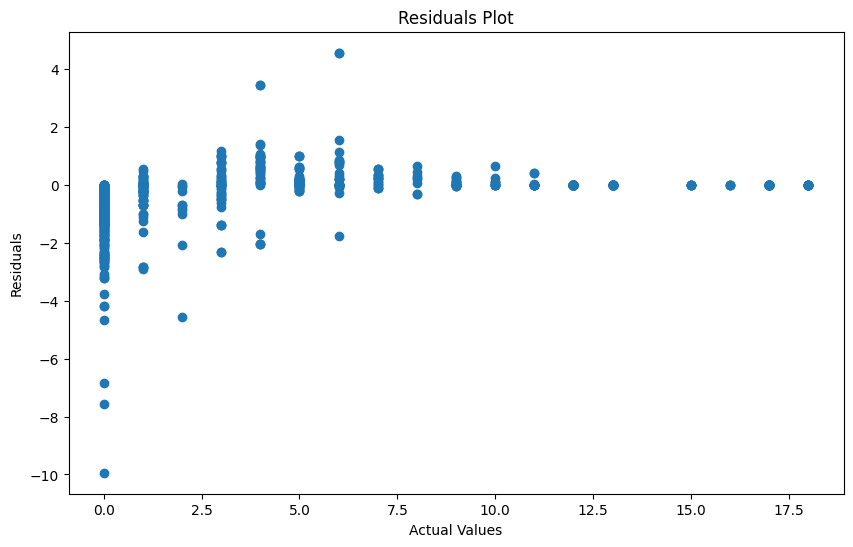


Feature Importances:
                    feature  importance
1                    Income    0.409509
5                  MntWines    0.251233
0                Year_Birth    0.033525
10             MntGoldProds    0.033045
8           MntFishProducts    0.026716
13      NumCatalogPurchases    0.025774
4                   Recency    0.022288
34                      Day    0.022154
15        NumWebVisitsMonth    0.019139
19                     Year    0.018402
33                    Month    0.018080
9          MntSweetProducts    0.017926
7           MntMeatProducts    0.015657
14        NumStorePurchases    0.013559
6                 MntFruits    0.012646
12          NumWebPurchases    0.011688
23         Education_Master    0.008390
22     Education_Graduation    0.007654
35                DayOfWeek    0.006978
28   Marital_Status_Married    0.005974
11        NumDealsPurchases    0.005911
30  Marital_Status_Together    0.003076
2                   Kidhome    0.001704
3                 

In [ ]:
print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"Mean Absolute Error (MAE): {mae}")
print(f"R-squared: {r2}")

# Plot residuals
residuals = y_test - y_pred
plt.figure(figsize=(10,6))
plt.scatter(y_test, residuals)
plt.title('Residuals Plot')
plt.xlabel('Actual Values')
plt.ylabel('Residuals')
plt.show()

# Get feature importances
importances = rf.feature_importances_

# Create a DataFrame for visualization
importances_df = pd.DataFrame({'feature': X_train.columns, 'importance': importances})

# Sort the DataFrame by importance score
importances_df = importances_df.sort_values('importance', ascending=False)

print("\nFeature Importances:")
print(importances_df)

In [ ]:
#@title Q4a. Evaluate the Model's Accuracy

# from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score ...
# print(xxxx)

> Q4b. After Evaluation, Please indicate which model would you eventually pursue & the underlying rationale

**Answer:**

I choose the random forest classifier model over the random forest regression because it has the highest prediction accuracy. Furthermore, we would prefer the classification capabilities over the regression capabilities. Also, the classifier places more importance on the range of parameters rather than relying on one. Thereby, once feature engineering is applied. It might be possibel to create a model of higher accuracy. The SLR, is too simple and might not be able to pick up on complex patterns which seems to be evident at the smaller scales (thereby leading to small errors but a large number of them). The clustering is only a visual representation and the clusters are not too evident for us to extract any useful predictions. For instance, having two clusters does us no good in trying to predict the target based on the inputs.

Furthermore, the use of alternative data (wherein the data was feature engineered further) but I would rather opt for the lower fidelity model to avoid overfitting at this stage as the difference is just 2%



---



#### **Step 5. Optimization**
In this step, you will try to improve the performance of the best model by applying some advanced techniques such as hyperparameter tuning, K-fold Cross Validation, ensemble methods, etc.

>  Q5a. Attempt Manual Hyperparameter Tuning & Observe how it affects the accuracy score

It appears that hyperparameter tuning only improves performance under 9 conditions. With the best improvements being by roughly 0.4%. under the following paramters:

n_estimators max_depth  min_samples_split  min_samples_leaf  accuracy
54            200        20                  2                 1  0.976244

over the previous accuracy of

Accuracy: 0.9739819004524887

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
import pandas as pd

# Define predictor and explanatory variables
X_train = train_data.drop('predictor', axis=1)
y_train = train_data['predictor']
X_test = test_data.drop('predictor', axis=1)
y_test = test_data['predictor']

# List of hyperparameters for manual tuning
n_estimators = [100, 200, 500]
max_depth = [None, 10, 20, 30]
min_samples_split = [2, 5, 10]
min_samples_leaf = [1, 2, 4]

# Prepare a list to store the results
results = []

# Loop through the hyperparameters and store the accuracy score for each combination
for n in n_estimators:
    for depth in max_depth:
        for split in min_samples_split:
            for leaf in min_samples_leaf:
                rf = RandomForestClassifier(n_estimators=n, max_depth=depth, min_samples_split=split,
                                            min_samples_leaf=leaf, random_state=42)
                rf.fit(X_train, y_train)
                y_pred = rf.predict(X_test)
                accuracy = accuracy_score(y_test, y_pred)
                results.append({
                    'n_estimators': n,
                    'max_depth': str(depth),  # Convert to string to handle None values
                    'min_samples_split': split,
                    'min_samples_leaf': leaf,
                    'accuracy': accuracy
                })

# Convert the results to a DataFrame
results_df = pd.DataFrame(results)

# Display the DataFrame sorted by accuracy
results_df = results_df.sort_values('accuracy', ascending=False)
print(results_df)

    n_estimators max_depth  min_samples_split  min_samples_leaf  accuracy
54           200        20                  2                 1  0.978507
63           200        30                  2                 1  0.978507
36           200      None                  2                 1  0.978507
18           100        20                  2                 1  0.976244
27           100        30                  2                 1  0.976244
..           ...       ...                ...               ...       ...
11           100        10                  2                 4  0.842760
14           100        10                  5                 4  0.842760
53           200        10                 10                 4  0.838235
89           500        10                 10                 4  0.835973
17           100        10                 10                 4  0.834842

[108 rows x 5 columns]


In [ ]:
pd.set_option('display.max_rows', None)
print(results_df)

     n_estimators max_depth  min_samples_split  min_samples_leaf  accuracy
54            200        20                  2                 1  0.978507
63            200        30                  2                 1  0.978507
36            200      None                  2                 1  0.978507
18            100        20                  2                 1  0.976244
27            100        30                  2                 1  0.976244
0             100      None                  2                 1  0.976244
99            500        30                  2                 1  0.975113
90            500        20                  2                 1  0.975113
72            500      None                  2                 1  0.975113
21            100        20                  5                 1  0.966063
75            500      None                  5                 1  0.966063
102           500        30                  5                 1  0.966063
93            500        

>  Q5b. Attempt K-fold Cross Validation to find the best Hyperparameter & Observe how it affects the accuracy score

In [ ]:
#@title Q5b. Attempt K-fold Cross Validation to find the best Hyperparameter & Observe how it affects the accuracy score

# Step 1. Import K-fold Cross Validation Libraries
# from sklearn.model_selection import cross_val_score

# Step 2. Generate Cross-validation grid containing various combination of hyper-parameter (Tips: Check Slide 48 in Tutorial PPT)

# Step 3. Re-use the code in Part 4, to observe the changes in accuracy score

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV

# Define predictor and explanatory variables
X_train = train_data.drop('predictor', axis=1)
y_train = train_data['predictor']

# Dictionary of hyperparameters for tuning
param_grid = {
    'n_estimators': [100, 200, 500],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Initialize the RandomForestClassifier
rf = RandomForestClassifier(random_state=42)

# Initialize the GridSearchCV
grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, cv=5, scoring='accuracy')

# Fit the GridSearchCV
grid_search.fit(X_train, y_train)

# Print the best parameters and the corresponding accuracy score
print(f"Best parameters: {grid_search.best_params_}")
print(f"Best accuracy score: {grid_search.best_score_}")

Best parameters: {'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}
Best accuracy score: 0.9317641072079688


In [ ]:
from sklearn.linear_model import LogisticRegression

model = LogisticRegression(max_iter=100000000)

In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline

pipe = make_pipeline(StandardScaler(), LogisticRegression(max_iter=1000))
pipe.fit(X_train, y_train)

Pipeline(steps=[('standardscaler', StandardScaler()),
                ('logisticregression', LogisticRegression(max_iter=1000))])

# The same folding but through an alternative approach

In [ ]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.pipeline import make_pipeline
import pandas as pd
import numpy as np

def cv_comparison(models, params, X, y, cv):
    cv_accuracies = pd.DataFrame()
    accs = []

    for model, param in zip(models, params):
        if isinstance(model, LogisticRegression):
            pipe = make_pipeline(StandardScaler(), model)
            param = {f"logisticregression__{k}": v for k, v in param.items()}
        elif isinstance(model, RandomForestClassifier):
            pipe = make_pipeline(model)
            param = {f"randomforestclassifier__{k}": v for k, v in param.items()}
        elif isinstance(model, XGBClassifier):
            model.set_params(num_class=len(np.unique(y))) # set num_class here
            pipe = make_pipeline(model)
            param = {f"xgbclassifier__{k}": v for k, v in param.items()}

        random_search = RandomizedSearchCV(pipe, param, n_iter=min(50, len(params)), cv=cv, scoring='accuracy', random_state=42)
        random_search.fit(X, y)
        acc = random_search.best_score_
        accs.append(acc)
        cv_accuracies[str(model)] = [acc]

    cv_accuracies.index = ['Accuracy']
    return cv_accuracies, accs

lr = LogisticRegression(max_iter=10000000, random_state=42)
rf = RandomForestClassifier(random_state=42)
xgb = XGBClassifier(random_state=42)

param_lr = {'C': [0.1, 1, 10, 100]}
param_rf = {'n_estimators': [100, 200, 500], 'max_depth': [None, 10, 20, 30], 'min_samples_split': [2, 5, 10], 'min_samples_leaf': [1, 2, 4]}
param_xgb = {'n_estimators': [100, 200, 500], 'max_depth': [None, 10, 20, 30], 'learning_rate': [0.01, 0.1, 0.3]}

models = [lr, rf, xgb]
params = [param_lr, param_rf, param_xgb]

# Encode y_train
encoder = LabelEncoder()
y_train_encoded = encoder.fit_transform(y_train)

# Check the unique classes in the target variable
print("Unique classes in y_train_encoded:", np.unique(y_train_encoded))

comp, accs = cv_comparison(models, params, X_train, y_train_encoded, 5)

Unique classes in y_train_encoded: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17]


In [ ]:
# Print the accuracy for each model
for model, acc in zip(models, accs):
    print(f"Accuracy for {type(model).__name__}: {acc:.4f}")

# Print the comparison dataframe
print(comp)

Accuracy for LogisticRegression: 0.6243
Accuracy for RandomForestClassifier: 0.9224
Accuracy for XGBClassifier: 0.9207
          LogisticRegression(max_iter=10000000, random_state=42)  \
Accuracy                                           0.624286        

          RandomForestClassifier(random_state=42)  \
Accuracy                                  0.92242   

          XGBClassifier(base_score=None, booster=None, callbacks=None,\n              colsample_bylevel=None, colsample_bynode=None,\n              colsample_bytree=None, early_stopping_rounds=None,\n              enable_categorical=False, eval_metric=None, feature_types=None,\n              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,\n              interaction_constraints=None, learning_rate=None, max_bin=None,\n              max_cat_threshold=None, max_cat_to_onehot=None,\n              max_delta_step=None, max_depth=None, max_leaves=None,\n              min_child_weight=None, missing=nan, monotone_constrai

>  Q5c. Attempt one of the 3 ensemble methods & Observe how it affects the accuracy score

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
import pandas as pd

# Assume that rf is your pre-trained RandomForestClassifier
rf = RandomForestClassifier()

# Define the parameter grid
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 5, 10],
    'min_samples_split': [2, 5, 10]
}

# Create a GridSearchCV object with 10 folds cross validation
grid = GridSearchCV(rf, param_grid, refit=True, verbose=0, cv=10)

# Fit to the data
grid.fit(X_train, y_train)

print(f"The best parameters are {grid.best_params_} with a score of {grid.best_score_}")

# Get the cross validation results
cv_results = pd.DataFrame(grid.cv_results_)

# Print the cross validation results
print("\nCross Validation Results:")
print(cv_results)

# Create the model with the best parameters
best_model = RandomForestClassifier(n_estimators=grid.best_params_['n_estimators'],
                                    max_depth=grid.best_params_['max_depth'],
                                    min_samples_split=grid.best_params_['min_samples_split'])

# Fit the best model to the data
best_model.fit(X_train, y_train)

# Predict the test data
y_pred = best_model.predict(X_test)

# Get feature importances
importances = best_model.feature_importances_

# Create a DataFrame for visualization
importances_df = pd.DataFrame({'feature': X_train.columns, 'importance': importances})

# Sort the DataFrame by importance score
importances_df = importances_df.sort_values('importance', ascending=False)

print("\nFeature Importances:")
print(importances_df)

The best parameters are {'max_depth': None, 'min_samples_split': 2, 'n_estimators': 300} with a score of 0.9464909332437061

Cross Validation Results:
    mean_fit_time  std_fit_time  mean_score_time  std_score_time  \
0        1.919750      0.510382         0.058668        0.024153   
1        2.156628      1.149108         0.066965        0.037450   
2        2.140483      0.381774         0.059817        0.009070   
3        0.820824      0.246937         0.027108        0.011239   
4        1.342702      0.226614         0.038476        0.006383   
5        2.024300      0.300234         0.057122        0.008507   
6        0.653088      0.127812         0.020842        0.003162   
7        1.350332      0.254471         0.036762        0.006640   
8        2.302626      1.072529         0.060401        0.011604   
9        0.359456      0.007771         0.014610        0.001455   
10       0.862468      0.174412         0.030742        0.006292   
11       1.338395      0.623277  

# Acessing Feature Importance to see if anything should be removed

    Number of Features  Cross Validation Score
0                    1                0.393828
1                    2                0.393828
2                    3                0.393545
3                    4                0.394111
4                    5                0.395809
5                    6                0.395809
6                    7                0.395809
7                    8                0.395809
8                    9                0.398356
9                   10                0.401470
10                  11                0.400622
11                  12                0.398640
12                  13                0.411380
13                  14                0.415061
14                  15                0.413078
15                  16                0.419025
16                  17                0.419308
17                  18                0.457816
18                  19                0.519253
19                  20                0.620610
20           

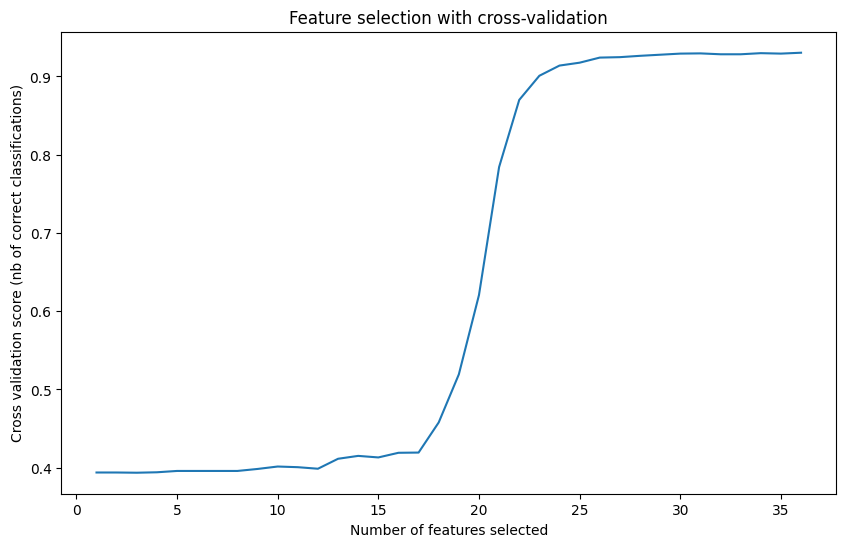

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Train a RandomForestClassifier
model = RandomForestClassifier(n_estimators=100)
model.fit(X_train, y_train)

# Get feature importances
importances = model.feature_importances_

# Sort features by importance
sorted_indices = np.argsort(importances)

# Initialize a list to hold the cross-validation scores
scores = []

# Iterate over number of features
for i in range(1, len(sorted_indices) + 1):
    # Select the most important features
    top_features = X_train.columns[sorted_indices[:i]]

    # Train the model on the selected features
    model = RandomForestClassifier(n_estimators=100)
    score = cross_val_score(model, X_train[top_features], y_train, cv=5, scoring='accuracy').mean()

    # Append the score to the scores list
    scores.append(score)

# Create a DataFrame with the number of features and the cross-validation scores
results = pd.DataFrame({
    'Number of Features': range(1, len(scores) + 1),
    'Cross Validation Score': scores
})

# Print the results
print(results)

# Plot number of features vs. cross-validation scores
plt.figure(figsize=(10, 6))
plt.title('Feature selection with cross-validation')
plt.xlabel("Number of features selected")
plt.ylabel("Cross validation score (nb of correct classifications)")
plt.plot(range(1, len(scores) + 1), scores)
plt.show()

## The same but for alternative data

This proves that despite higher accuracy with the train and test data. The feature engineered data does worse on the cross validation test. Proving my initial hypothesis that the model was overfitted

    Number of Features  Cross Validation Score
0                    1                0.393828
1                    2                0.393828
2                    3                0.393545
3                    4                0.394111
4                    5                0.395809
5                    6                0.395809
6                    7                0.395809
7                    8                0.398640
8                    9                0.398640
9                   10                0.400056
10                  11                0.400339
11                  12                0.400339
12                  13                0.420164
13                  14                0.441675
14                  15                0.520102
15                  16                0.622589
16                  17                0.785109
17                  18                0.873725
18                  19                0.900902
19                  20                0.909962
20           

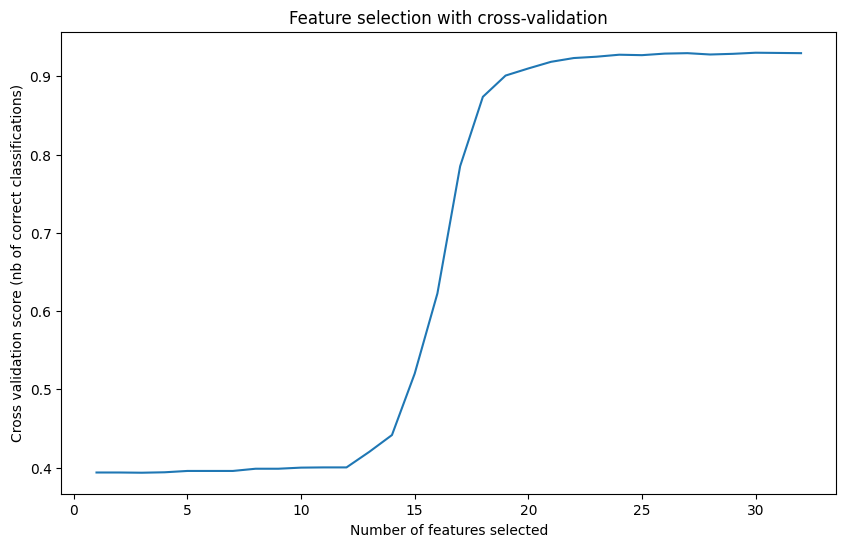

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Train a RandomForestClassifier
model = RandomForestClassifier(n_estimators=100)
model.fit(X_train2, y_train2)

# Get feature importances
importances = model.feature_importances_

# Sort features by importance
sorted_indices = np.argsort(importances)

# Initialize a list to hold the cross-validation scores
scores = []

# Iterate over number of features
for i in range(1, len(sorted_indices) + 1):
    # Select the most important features
    top_features = X_train2.columns[sorted_indices[:i]]

    # Train the model on the selected features
    model = RandomForestClassifier(n_estimators=100)
    score = cross_val_score(model, X_train2[top_features], y_train2, cv=5, scoring='accuracy').mean()

    # Append the score to the scores list
    scores.append(score)

# Create a DataFrame with the number of features and the cross-validation scores
results = pd.DataFrame({
    'Number of Features': range(1, len(scores) + 1),
    'Cross Validation Score': scores
})

# Print the results
print(results)

# Plot number of features vs. cross-validation scores
plt.figure(figsize=(10, 6))
plt.title('Feature selection with cross-validation')
plt.xlabel("Number of features selected")
plt.ylabel("Cross validation score (nb of correct classifications)")
plt.plot(range(1, len(scores) + 1), scores)
plt.show()

Best parameters found:  {'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 500}
Best score found:  0.931480019713829


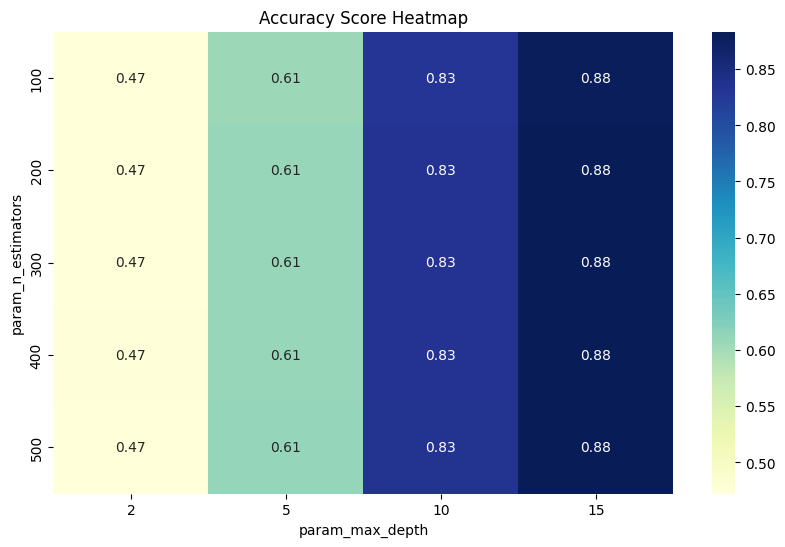

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Define the hyperparameters and their values for the grid
param_grid = {
    'n_estimators': [100, 200, 300, 400, 500],
    'max_depth': [2, 5, 10, 15, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Create a RandomForestClassifier
model = RandomForestClassifier()

# Create the GridSearchCV object
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, scoring='accuracy')

# Fit GridSearchCV to the training data
grid_search.fit(X_train, y_train)

# Print the best parameters
print('Best parameters found: ', grid_search.best_params_)

# Print the best score found
print('Best score found: ', grid_search.best_score_)

# Convert the grid search results into a Pandas DataFrame
results = pd.DataFrame(grid_search.cv_results_)

# Create a pivot table for 'mean_test_score', indexed by 'param_n_estimators' and 'param_max_depth'
pivot_table = results.pivot_table(values='mean_test_score',
                                  index='param_n_estimators',
                                  columns='param_max_depth')

# Plot the heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(pivot_table, annot=True, cmap='YlGnBu')
plt.title('Accuracy Score Heatmap')
plt.show()

In [ ]:
#@title Q5c. Attempt one of the 3 ensemble methods & Observe how it affects the accuracy score

# Step 1. Import Relevant functions from Libraries
# e.g. from sklearn.ensemble import BaggingClassifier

# Step 2. Add ensembling methods on top of Base models

# Step 3. Re-use the code in Part 4, to observe the changes in accuracy score

# Stacking

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from mlxtend.classifier import StackingClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import confusion_matrix, accuracy_score

# Build Different Models
KNC = KNeighborsClassifier()  # initialising KNeighborsClassifier
NB = GaussianNB()  # initialising Naive Bayes
RFC = RandomForestClassifier(n_estimators=100)  # initialising RandomForestClassifier

# Training of individual models
model_knc = KNC.fit(X_train, y_train)
model_nb = NB.fit(X_train, y_train)
model_rfc = RFC.fit(X_train, y_train)

# Predictions
pred_knc = model_knc.predict(X_test)
pred_nb = model_nb.predict(X_test)
pred_rfc = model_rfc.predict(X_test)

# Calculate accuracy score
accuracy_knc = accuracy_score(y_test, pred_knc)
accuracy_nb = accuracy_score(y_test, pred_nb)
accuracy_rfc = accuracy_score(y_test, pred_rfc)

print(f'K-Neighbors Classifier Accuracy: {accuracy_knc}')
print(f'Naive Bayes Classifier Accuracy: {accuracy_nb}')
print(f'Random Forest Classifier Accuracy: {accuracy_rfc}')

# Defining meta-classifier
lr = LogisticRegression()
clf_stack = StackingClassifier(classifiers=[KNC, NB, RFC], meta_classifier=lr, use_probas=True, use_features_in_secondary=True)

# Training of stacked model
model_stack = clf_stack.fit(X_train, y_train)

# Predictions
pred_stack = model_stack.predict(X_test)

# Calculate accuracy score
accuracy_stack = accuracy_score(y_test, pred_stack)

print(f'Stacking Classifier Accuracy: {accuracy_stack}')

# Print confusion matrix
conf_matrix = confusion_matrix(y_test, pred_stack)
print(f'Confusion Matrix: \n{conf_matrix}')

K-Neighbors Classifier Accuracy: 0.9777777777777777
Naive Bayes Classifier Accuracy: 0.9333333333333333
Random Forest Classifier Accuracy: 0.9555555555555556
Stacking Classifier Accuracy: 0.9555555555555556
Confusion Matrix: 
[[14  0  0]
 [ 0 17  1]
 [ 0  1 12]]




---



# Bagging

In [ ]:
from sklearn.ensemble import BaggingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.datasets import load_iris
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

# Load iris dataset
iris = load_iris()
X, y = iris.data, iris.target

# Split dataset into training set and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1)

# Create a decision tree classifier
tree = DecisionTreeClassifier()

# Create a bagging classifier with the decision tree
bagging = BaggingClassifier(estimator=tree, n_estimators=100, random_state=1)

# Train the bagging classifier
bagging.fit(X_train, y_train)

# Make predictions on the test set
y_pred = bagging.predict(X_test)

# Calculate the accuracy of the model
accuracy = accuracy_score(y_test, y_pred)

print(f'Accuracy: {accuracy}')

Accuracy: 0.9555555555555556


# Boosting (misclaneous - not complete)

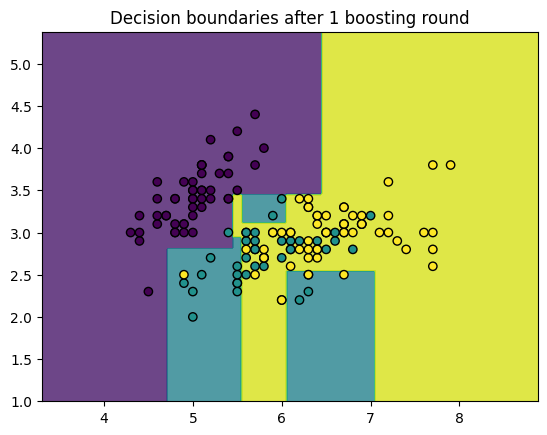

GradientBoosting Classifier Accuracy after 1 round: 0.6222222222222222


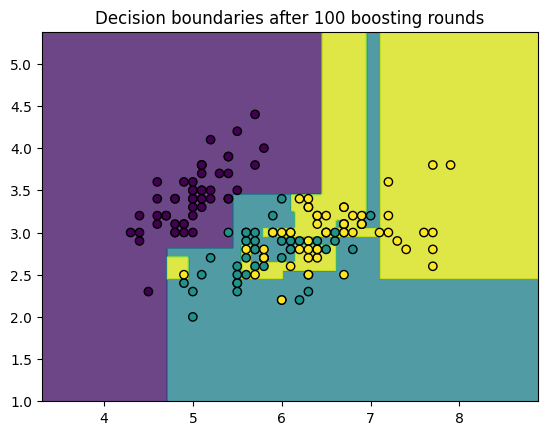

GradientBoosting Classifier Accuracy after 100 rounds: 0.6444444444444445


In [ ]:
import matplotlib.pyplot as plt
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.datasets import load_iris
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix
from matplotlib.colors import ListedColormap
import numpy as np

# Load iris dataset
iris = load_iris()
X, y = iris.data[:, :2], iris.target  # use only the first two features for simplicity

# Split dataset into training set and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1)

# Define GradientBoostingClassifier
GBC = GradientBoostingClassifier(n_estimators=1, learning_rate=0.1, random_state=42)

# Training of GradientBoostingClassifier model
model_gb = GBC.fit(X_train, y_train)

# Create a mesh grid for our plot
x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.02), np.arange(y_min, y_max, 0.02))

# Plot the decision boundary for each class
Z = model_gb.predict(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)
plt.figure()
plt.contourf(xx, yy, Z, alpha=0.8)

# Plot the training points
plt.scatter(X[:, 0], X[:, 1], c=y, edgecolor='k')
plt.title('Decision boundaries after 1 boosting round')
plt.show()

# Predictions
pred_gb = model_gb.predict(X_test)

# Calculate accuracy score
accuracy = accuracy_score(y_test, pred_gb)

print(f'GradientBoosting Classifier Accuracy after 1 round: {accuracy}')

# Now let's add more boosting rounds
GBC = GradientBoostingClassifier(n_estimators=100, learning_rate=0.1, random_state=42)

# Training of GradientBoostingClassifier model
model_gb = GBC.fit(X_train, y_train)

# Plot the decision boundary for each class
Z = model_gb.predict(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)
plt.figure()
plt.contourf(xx, yy, Z, alpha=0.8)

# Plot the training points
plt.scatter(X[:, 0], X[:, 1], c=y, edgecolor='k')
plt.title('Decision boundaries after 100 boosting rounds')
plt.show()

# Predictions
pred_gb = model_gb.predict(X_test)

# Calculate accuracy score
accuracy = accuracy_score(y_test, pred_gb)

print(f'GradientBoosting Classifier Accuracy after 100 rounds: {accuracy}')

# Boosting using Ada

In [ ]:
from sklearn.ensemble import AdaBoostClassifier, RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix
import pandas as pd

# Define predictor and explanatory variables
X_train = train_data.drop('predictor', axis=1)
y_train = train_data['predictor']
X_test = test_data.drop('predictor', axis=1)
y_test = test_data['predictor']

# Initialize the RandomForestClassifier with default parameters
rf = RandomForestClassifier(random_state=42)

# Initialize AdaBoost with RandomForest as the base estimator
ada = AdaBoostClassifier(base_estimator=rf, n_estimators=50, learning_rate=0.1, random_state=42)

# Fit AdaBoost to the data
ada.fit(X_train, y_train)

# Predict the target for the test data
y_pred = ada.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)

print(f"Accuracy: {accuracy}")

# Print the confusion matrix
cm = confusion_matrix(y_test, y_pred)
print(f"Confusion Matrix: \n{cm}")

# Get feature importances
importances = ada.feature_importances_

# Create a DataFrame for visualization
importances_df = pd.DataFrame({'feature': X_train.columns, 'importance': importances})

# Sort the DataFrame by importance score
importances_df = importances_df.sort_values('importance', ascending=False)

print("\nFeature Importances:")
print(importances_df)

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


Accuracy: 0.9751131221719457
Confusion Matrix: 
[[340   5   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0]
 [  8  53   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0   0  10   1   0   0   0   0   0   0   0   0   0   0   0   0   0   0]
 [  2   0   0  43   1   0   0   0   0   0   0   0   0   0   0   0   0   0]
 [  2   0   0   0  39   0   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0   0   0   0   1  50   0   0   0   0   0   0   0   0   0   0   0   0]
 [  2   0   0   0   0   0  42   0   0   0   0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0  18   0   0   0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0   8   0   0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0   0  35   0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0   0   0  11   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0   0   0   0  18   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0   0   0   0   0  7

#### **Step 6. Interpretation**
In this step, you will interpret the results of the best model and explain its predictions using some methods such as SHAP values, LIME, etc. You will also discuss the limitations and implications of the model and provide some recommendations for future work.

> Q6. Plot 3+ Graph that effectively explain insights that you uncovered about the trained model, comment to describe the insight that was uncovered.

The only improvements were made with the incorporation of hyper parameter tuning and involving an AdaBoostClassifier hence these changes were incorporated

In [ ]:
from sklearn.model_selection import train_test_split

X = data_ML.drop('predictor', axis=1)
y = data_ML['predictor']

# Stratify the split to ensure both classes are represented in both sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)

In [ ]:
num_classes = y.nunique()
print(f'Number of unique classes: {num_classes}')

Number of unique classes: 18


In [ ]:
from sklearn.ensemble import AdaBoostClassifier, RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix
import pandas as pd

# Define predictor and explanatory variables
X_train = train_data.drop('predictor', axis=1)
y_train = train_data['predictor']
X_test = test_data.drop('predictor', axis=1)
y_test = test_data['predictor']

# Initialize the RandomForestClassifier with specific parameters
rf = RandomForestClassifier(n_estimators=200, max_depth=20, min_samples_split=2, min_samples_leaf=1, random_state=42)

# Initialize AdaBoost with the RandomForest as the base estimator
ada = AdaBoostClassifier(base_estimator=rf, n_estimators=50, learning_rate=0.1, random_state=42)

# Fit AdaBoost to the data
ada.fit(X_train, y_train)

# Predict the target for the test data
y_pred = ada.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)

print(f"Accuracy: {accuracy}")

# Print the confusion matrix
cm = confusion_matrix(y_test, y_pred)
print(f"Confusion Matrix: \n{cm}")

# Get feature importances
importances = ada.feature_importances_

# Create a DataFrame for visualization
importances_df = pd.DataFrame({'feature': X_train.columns, 'importance': importances})

# Sort the DataFrame by importance score
importances_df = importances_df.sort_values('importance', ascending=False)

print("\nFeature Importances:")
print(importances_df)

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning:

`base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.



Accuracy: 0.9751131221719457
Confusion Matrix: 
[[340   5   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0]
 [  8  53   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0   0  10   1   0   0   0   0   0   0   0   0   0   0   0   0   0   0]
 [  2   0   0  43   1   0   0   0   0   0   0   0   0   0   0   0   0   0]
 [  2   0   0   0  39   0   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0   0   0   0   1  50   0   0   0   0   0   0   0   0   0   0   0   0]
 [  2   0   0   0   0   0  42   0   0   0   0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0  18   0   0   0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0   8   0   0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0   0  35   0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0   0   0  11   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0   0   0   0  18   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0   0   0   0   0  7

In [ ]:
#@title Q6. Plot 3+ Graph that effectively explain insights that you uncovered about the trained model, comment to describe the insight that was uncovered.

# Step 1. Import Graph Plotting Libraries (if any)
# ...
# plt.show()

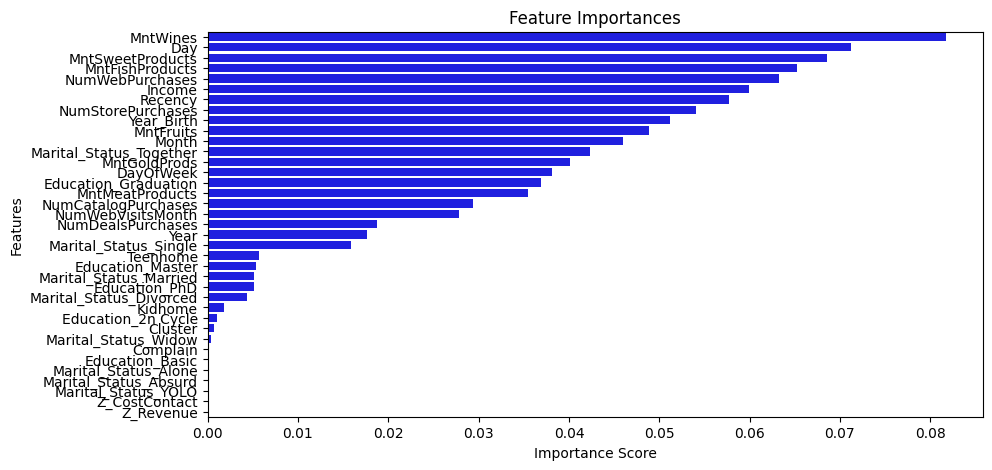

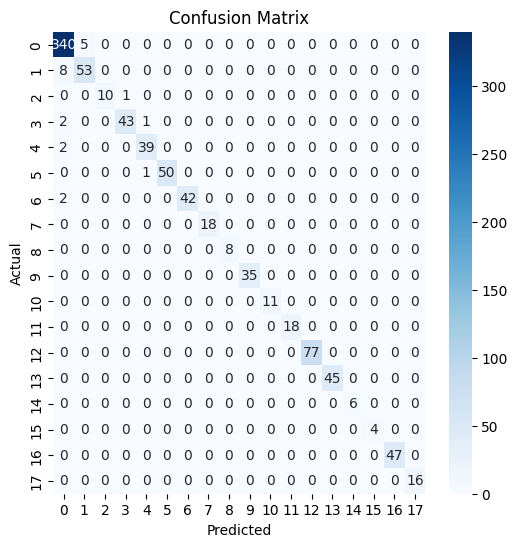

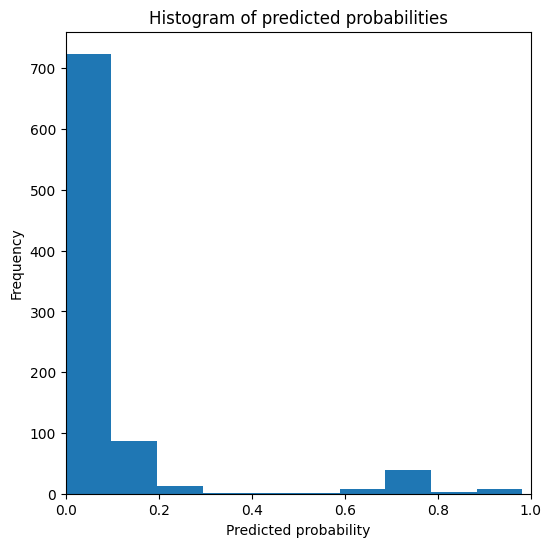

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/en

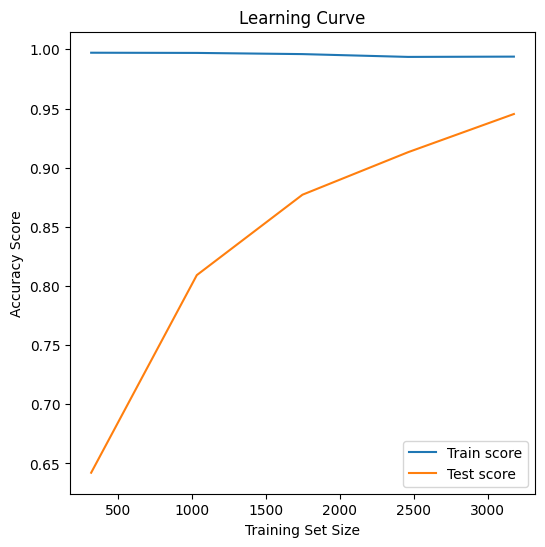

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import roc_curve, auc, precision_recall_curve
from sklearn.model_selection import learning_curve

# 1. Feature Importances
plt.figure(figsize=(10, 5))
sns.barplot(x='importance', y='feature', data=importances_df, color='b')
plt.title('Feature Importances')
plt.xlabel('Importance Score')
plt.ylabel('Features')
plt.show()

# 2. Confusion Matrix
plt.figure(figsize=(6, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

# 4. Precision-Recall Curve

# 5. Histogram of Predicted Probabilities
plt.figure(figsize=(6, 6))
plt.hist(ada.predict_proba(X_test)[:, 1], bins=10)
plt.xlim(0, 1)
plt.title('Histogram of predicted probabilities')
plt.xlabel('Predicted probability')
plt.ylabel('Frequency')
plt.show()

# 6. Learning Curve
train_sizes, train_scores, test_scores = learning_curve(ada, X_train, y_train, cv=10, scoring='accuracy')
train_scores_mean = np.mean(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
plt.figure(figsize=(6, 6))
plt.plot(train_sizes, train_scores_mean, label='Train score')
plt.plot(train_sizes, test_scores_mean, label='Test score')
plt.xlabel('Training Set Size')
plt.ylabel('Accuracy Score')
plt.title('Learning Curve')
plt.legend(loc="lower right")
plt.show()



---



#### **Step 7. Machine Learning Dashboard**
In this section of the assignment, you will showcase your findings and insights from your Machine Learning project by building an interactive and visually appealing dashboard.


Transform Graphs that you generated in
1. Part 1d - Exploratory Data Analysis
2. Part 4a - Model's Evaluation
3. Part 6 - Model's Insight Generation

into a web-based dashboard.

(For reference - Dashboard Example: https://explainerdashboard.readthedocs.io/en/latest/)



# I tried many versions but they didnt all work. I made my final dashboard on a web hosting site. You can follow this link to get to it:

https://preview.webflow.com/preview/yasirus-top-notch-site?utm_medium=preview_link&utm_source=designer&utm_content=yasirus-top-notch-site&preview=e2f3eb7b935fc2491538e0d1f2ee714d&workflow=preview

In [ ]:
from explainerdashboard import ClassifierExplainer, ExplainerDashboard
from sklearn.model_selection import StratifiedShuffleSplit

# Stratified sampling of instances from X_test and y_test
sss = StratifiedShuffleSplit(n_splits=1, test_size=50, random_state=42)
for train_index, test_index in sss.split(X_test, y_test):
    X_test_sample, y_test_sample = X_test.iloc[test_index], y_test.iloc[test_index]

# Initialize explainer with the sampled data
try:
    explainer = ClassifierExplainer(ada, X_test_sample, y_test_sample)
    # Initialize the dashboard
    dashboard = ExplainerDashboard(explainer)
except ValueError as e:
    print(f"Caught an exception: {e}")
else:
    # Run the dashboard
    dashboard.run()

Note: shap values for shap='kernel' normally get calculated against X_background, but paramater X_background=None, so setting X_background=shap.sample(X, 50)...
Generating self.shap_explainer = shap.KernelExplainer(model, X, link='identity')
Building ExplainerDashboard..
Detected google colab environment, setting mode='external'
For this type of model and model_output interactions don't work, so setting shap_interaction=False...
The explainer object has no decision_trees property. so setting decision_trees=False...
Generating layout...
Calculating shap values...


/usr/local/lib/python3.10/dist-packages/dash/dash.py:516: UserWarning:

JupyterDash is deprecated, use Dash instead.
See https://dash.plotly.com/dash-in-jupyter for more details.



  0%|          | 0/50 [00:00<?, ?it/s]

Calculating prediction probabilities...
Calculating metrics...
Caught an exception: Only one class present in y_true. ROC AUC score is not defined in that case.


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.



## Trial

In [ ]:
# Step 1: Installation
!pip install dash
!pip install jupyter_dash
!pip install ngrok

# Step 2: Import libraries
import dash
import dash_core_components as dcc
import dash_html_components as html
from dash.dependencies import Input, Output
from jupyter_dash import JupyterDash

# Step 3: Create a Dash Application
app = JupyterDash(__name__)

app.layout = html.Div([
    html.H1('Hello Dash!'),
    html.Div('''
        Dash - A web application framework for Python.
    '''),
    dcc.Graph(
        id='example-graph',
        figure={
            'data': [
                {'x': [1, 2, 3], 'y': [4, 1, 2], 'type': 'bar', 'name': 'SF'},
                {'x': [1, 2, 3], 'y': [2, 4, 5], 'type': 'bar', 'name': 'Montreal'},
            ],
            'layout': {
                'title': 'Dash Data Visualization'
            }
        }
    )
])

# Step 4: Run the server
app.run_server(mode='external')

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.4/10.4 MB 16.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.6/233.6 kB 14.4 MB/s eta 0:00:00
  Attempting uninstall: Werkzeug
    Found existing installation: Werkzeug 2.3.6
    Uninstalling Werkzeug-2.3.6:
      Successfully uninstalled Werkzeug-2.3.6
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 14.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 9.6 MB/s eta 0:00:00
Dash app running on:


<ipython-input-2-b23890d97276>:8: UserWarning: 
The dash_core_components package is deprecated. Please replace
`import dash_core_components as dcc` with `from dash import dcc`
  import dash_core_components as dcc
<ipython-input-2-b23890d97276>:9: UserWarning: 
The dash_html_components package is deprecated. Please replace
`import dash_html_components as html` with `from dash import html`
  import dash_html_components as html
/usr/local/lib/python3.10/dist-packages/dash/dash.py:516: UserWarning: JupyterDash is deprecated, use Dash instead.
See https://dash.plotly.com/dash-in-jupyter for more details.
  warnings.warn(


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# Trial 2

In [ ]:
# Step 1: Install ngrok
!pip install pyngrok

# Step 2: Import required libraries
import threading
from pyngrok import ngrok

# Step 3: Run the dashboard

# Assuming `db` is your ExplainerDashboard object
def run_dashboard():
    db.run(port=8050)

threading.Thread(target=run_dashboard).start()

# Step 4: Setup ngrok and print the public URL
public_url = ngrok.connect(8050)
print('Dashboard link:', public_url)

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 681.2/681.2 kB 5.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pyngrok: filename=pyngrok-6.0.0-py3-none-any.whl size=19867 sha256=811eeb2cf5aa1ad7545332274441925f706aeab28b84a2070870782d804f08e5
  Stored in directory: /root/.cache/pip/wheels/5c/42/78/0c3d438d7f5730451a25f7ac6cbf4391759d22a67576ed7c2c
Successfully built pyngrok


Exception in thread Thread-57 (run_dashboard):
Traceback (most recent call last):
  File "/usr/lib/python3.10/threading.py", line 1016, in _bootstrap_inner
    self.run()
  File "/usr/lib/python3.10/threading.py", line 953, in run
    self._target(*self._args, **self._kwargs)
  File "<ipython-input-3-718b70b95af8>", line 12, in run_dashboard
NameError: name 'db' is not defined


Dashboard link: NgrokTunnel: "https://5b49-35-202-225-28.ngrok.io" -> "http://localhost:8050"


## Broken


In [ ]:
from explainerdashboard import ClassifierExplainer, ExplainerDashboard
from sklearn.utils import resample

# Randomly sample 100 instances from X_test and y_test
X_test_sample, y_test_sample = resample(X_test, y_test, n_samples=10, random_state=42)

# Initialize explainer with the sampled data
explainer = ClassifierExplainer(ada, X_test_sample, y_test_sample)

# Initialize the dashboard
dashboard = ExplainerDashboard(explainer)

# Run the dashboard
dashboard.run()

Note: shap values for shap='kernel' normally get calculated against X_background, but paramater X_background=None, so setting X_background=shap.sample(X, 50)...
Generating self.shap_explainer = shap.KernelExplainer(model, X, link='identity')
Building ExplainerDashboard..
Detected google colab environment, setting mode='external'
For this type of model and model_output interactions don't work, so setting shap_interaction=False...
The explainer object has no decision_trees property. so setting decision_trees=False...
Generating layout...
Calculating shap values...


/usr/local/lib/python3.10/dist-packages/dash/dash.py:516: UserWarning:

JupyterDash is deprecated, use Dash instead.
See https://dash.plotly.com/dash-in-jupyter for more details.



  0%|          | 0/10 [00:00<?, ?it/s]

Calculating prediction probabilities...
Calculating metrics...


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.



ValueError: ignored

##Install

In [ ]:
!pip install explainerdashboard

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 286.9/286.9 kB 4.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 220.6/220.6 kB 9.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.4/10.4 MB 23.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 91.8/91.8 kB 11.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 547.9/547.9 kB 32.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.7/57.7 kB 7.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.6/233.6 kB 12.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 136.5/136.5 kB 16.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 24.3 MB/s eta 0:00:00
  Attempting uninstall: Werkzeug
    Found existing installation: Werkzeug 2.3.6
    Uninstalling Werkzeug-2.3.6:
      Successfully uninstalled Werkzeug-2.3.6
